In [1]:
import os 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import powerlaw as pwl
from myutils.utilities import *
import pycop
import seaborn as sns
import openturns as ot
import openturns.viewer as viewer
from local_utils import *


In [2]:

plt.rcParams.update({
    "text.usetex": True,           # Enable LaTeX for text rendering
    "font.family": "serif",        # Use serif font
    "font.size": 14,               # Set font size
    "figure.figsize": (10, 10/1.5), # Figure size (matches LaTeX document width)
    "figure.dpi": 300,             # High resolution for clarity
    "axes.linewidth": 1.0,         # Thickness of axes lines
    "axes.grid": True,             # Enable grid globally
    "axes.grid.which": "major",    # Apply grid to both major and minor ticks
    "grid.color": "gray",          # Grid line color
    "grid.linestyle": "-",         # Grid line style
    "grid.linewidth": 0.2,         # Grid line thickness
    "grid.alpha": 0.7,             # Grid transparency
    "axes.labelweight": "bold",    # Bold axis labels
    "axes.labelsize": 12,
    "axes.titleweight": "bold",    # Bold titles
    "legend.fontsize": "large",    # Larger legend text
    "xtick.labelsize": 14,         # X-tick label size
    "ytick.labelsize": 14,         # Y-tick label size
    "xtick.direction": "in",       # Ticks pointing inwards
    "ytick.direction": "in",
    "xtick.major.size": 5,         # Major tick size
    "ytick.major.size": 5,
    "xtick.minor.size": 3,         # Minor tick size
    "ytick.minor.size": 3,
    "legend.fontsize": 12,
    "legend.frameon": True,
    "legend.framealpha": 0.8,    # Transparency of legend box (1 = opaque, 0 = fully transparent)
    "legend.facecolor": "white", # Background color of the legend box
    # "legend.edgecolor": "black", # Border color of the legend box
    "legend.borderpad": 0.3,     # Padding inside the legend box
    "legend.labelspacing": 0.3,  # Space between legend entries
    "legend.handlelength": 2,    # Length of legend handles (line, marker)
    "legend.handletextpad": 0.5, # Space between handle and label
    "legend.loc": "best",        # Default position of the legend
    "legend.columnspacing": 1.0, # Space between legend columns
})

# Define a wrapper function for saving figures with bbox_inches='tight'
def save_figure(fig, filename):
    fig.savefig(filename, bbox_inches='tight')


fig_path = '/home/claudio/tesi/manuscript/final_figures'

testing = False

In [3]:
txns_fn = '/home/claudio/tesi/sarafu/final_data/00_tx_with_bal_bwd_allpositivebalances.csv'
TXDF = pd.read_csv(txns_fn,sep=",",header=0,dtype={'id': 'int',
                                                    'date': 'string',
                                                    'type': 'category',
                                                    'source_xdai': 'string',
                                                    'target_xdai': 'string',
                                                    'weight': 'float',
                                                    'source_bal_pre': 'float',
                                                    'source_bal_post': 'float',
                                                    'target_bal_pre': 'float',
                                                    'target_bal_post': 'float',
                                                    'source': 'int',
                                                    'target': 'int',
                                                    'source_role': 'category',
                                                    'target_role': 'category',
                                                    'right_weight': 'bool',
                                                    'frac_out': 'float',
                                                    'frac_in': 'float',
                                                    'frac_out_post': 'float',
                                                    'frac_in_post': 'float'}
 )

users_fn = '/home/claudio/tesi/sarafu/final_data/03_users_adjusted_allpositivebalances.csv'
USERS = pd.read_csv(users_fn,  # assuming 'user_fn' is your file name
                      sep=",",
                      header=0,
                      dtype={'id': 'int',
                             'start': 'string',
                             'final_bal': 'float',
                             'gender': 'category',
                             'area_name': 'string',
                             'area_type': 'category',
                             'role': 'category',
                             'business': 'category',
                             'poa': 'string',
                             'xdai': 'string',
                             'ovol_in': 'float',
                             'ovol_out': 'float',
                             'otxns_in': 'int',
                             'otxns_out': 'int',
                             'ounique_in': 'int',
                             'ounique_out': 'int',
                             'svol_in': 'float',
                             'svol_out': 'float',
                             'stxns_in': 'int',
                             'stxns_out': 'int',
                             'sunique_in': 'int',
                             'sunique_out': 'int',
                             'crid': 'int',
                             'net': 'float',
                             'initial_bal': 'float',
                             'min_bal': 'float'}) 

TXDF.drop(columns=['Unnamed: 0'],inplace=True)
USERS.drop(columns=['Unnamed: 0'],inplace=True)

formats = ['%Y-%m-%d %H:%M:%S.%f', '%Y-%m-%d %H:%M:%S', '%Y-%m-%d']
for fmt in formats:
    USERS.start = pd.to_datetime(USERS.start, format=fmt, errors='coerce').fillna(USERS.start)
USERS = USERS.sort_values(by='start')

for fmt in formats:
    TXDF.date = pd.to_datetime(TXDF.date, format=fmt, errors='coerce').fillna(TXDF.date)
TXDF = TXDF.sort_values(by='date')

PRECISION = 3
USERS = round_df(USERS, PRECISION)
TXDF = round_df(TXDF, PRECISION)

In [4]:
agents = basic_agents(TXDF)

cond1 = agents['tx_in'].sum() == agents['tx_out'].sum()
cond2 = agents['vol_in'].sum() == agents['vol_out'].sum()

print(cond1)
if ~cond1: 
    print(abs(agents['tx_in'].sum() - agents['tx_out'].sum()))

print(cond2)
if ~cond2:
    print(abs(agents['vol_in'].sum() - agents['vol_out'].sum()))

True
True


In [5]:
END = pd.to_datetime(TXDF.date.max())
START = pd.to_datetime(TXDF.date.min())
NUM_PERIODS = 20
BAD_USERS = [8356,8357,21712,54998]




In [6]:
standard_tx = lambda tx: tx.type == 'STANDARD'
good_users = lambda tx: ~tx.source.isin(BAD_USERS) | ~tx.target.isin(BAD_USERS)
std_roles = lambda tx: tx.source_role.isin(['BENEFICIARY','GROUP_ACCOUNT','VENDOR']) & tx.target_role.isin(['BENEFICIARY','GROUP_ACCOUNT','VENDOR'])   
standard = lambda tx: standard_tx(tx) & good_users(tx) & std_roles(tx)

standard_users = lambda usr : usr.role.isin(['BENEFICIARY','GROUP_ACCOUNT','VENDOR'])
validated = lambda usr: ~usr.crid.isin(BAD_USERS)


disbursement = lambda tx: tx.type == 'DISBURSEMENT'
withdrawal = lambda tx: tx.type.isin(['RECLAMATION','AGENT_OUT'])

from_kinango = lambda tx: tx.source_area == 'Kinango Kwale'
to_kinango = lambda tx: tx.target_area == 'Kinango Kwale'
just_kinango = lambda tx: from_kinango(tx) & to_kinango(tx) 

from_mukuru = lambda tx: tx.source_area == 'Mukuru Nairobi'
to_mukuru = lambda tx: tx.target_area == 'Mukuru Nairobi'
just_mukuru = lambda tx: from_mukuru(tx) & to_mukuru(tx) 




In [7]:
#BalanceS DFS FILTERS
balxmin = lambda bal,feat,tau: bal[feat]>=tau
balxinf = lambda bal,feat,tau: bal[feat]>tau
balxmax = lambda bal,feat,tau: bal[feat]<=tau
balxsup = lambda bal,feat,tau: bal[feat]<tau


In [8]:
#AGENTS DFS FILTERS
agxmin = lambda ag,feat,tau: ag[feat]>=tau
agxinf = lambda ag,feat,tau: ag[feat]>tau
agxmax = lambda ag,feat,tau: ag[feat]<=tau
agxsup = lambda ag,feat,tau: ag[feat]<tau

In [9]:
tx = TXDF.copy(deep=True)
users = USERS.copy(deep=True)




In [11]:
import pickle

pickle.dump(tx,open('/home/claudio/papers/adtxns_paper/pickled_data/sarafu/tx.pkl','wb'))
pickle.dump(users,open('/home/claudio/papers/adtxns_paper/pickled_data/sarafu/users.pkl','wb'))

In [ ]:

subset_0 = users.loc[(standard_users(users)) & (validated(users))]

subset_1 = users.loc[(users.stxns_in > 0) & (users.stxns_out > 0)]

tx = TXDF.copy(deep=True)
# tx = tx[standard(tx)]

tx_1 = tx[tx.source.isin(subset_1.crid.unique()) & tx.target.isin(subset_1.crid.unique())]



In [32]:
print(f"Standard users account for {subset_0.shape[0]/users.shape[0] * 100}% of all users")
print(f"Users with at least 1 standard transaction out: {subset_0[subset_0.stxns_out>0].shape[0]/subset_0.shape[0] * 100} % of all standard users")
print(f"Users with at least 1 standard transaction in: {subset_0[subset_0.stxns_in>0].shape[0]/subset_0.shape[0] * 100} % of all standard users")
print(f"Users with at least 1 standard transaction in and out: {subset_1.shape[0]/subset_0.shape[0] * 100} % of all standard users \n {subset_1.shape[0]/users.shape[0] * 100} % of all users")

Standard users account for 99.82174039580907% of all users
Users with at least 1 standard transaction out: 71.44393017238238 % of all standard users
Users with at least 1 standard transaction in: 45.929151937023946 % of all standard users
Users with at least 1 standard transaction in and out: 43.25594956084405 % of all standard users 
 43.17884167636787 % of all users


In [33]:
print(f" filtered transaction record made by subset_1: {len(tx_1)/len(TXDF)*100}% of all transactions")

 filtered transaction record made by subset_1: 41.79082975957925% of all transactions


In [34]:
tx_2 = tx_1[standard(tx_1)]

print(f"filtered transaction record of just standard transactions made by subset_1: {len(tx_2)/len(TXDF)*100}% of all transactions")

filtered transaction record of just standard transactions made by subset_1: 41.79061474303911% of all transactions


In [35]:
tx_3 = tx_2[tx_2.weight > 1]

print(f"filtered transaction record of just standard transactions made by subset_1: {len(tx_2)/len(TXDF)*100}% of all transactions")

filtered transaction record of just standard transactions made by subset_1: 41.79061474303911% of all transactions


In [36]:
print("Taotal time in seconds for the transactions we care about: ", T := round((tx.date.max() - tx.date.min()).total_seconds()))
print("Total number of transactions we care abpout", N:= tx.shape[0])
print("Transactions per second",N/T)
print("Average wait (s)", round(T/N))

Taotal time in seconds for the transactions we care about:  43753633
Total number of transactions we care abpout 930161
Transactions per second 0.02125905750500764
Average wait (s) 47


In [37]:
agents = basic_agents(tx)

cond1 = agents['tx_in'].sum() == agents['tx_out'].sum()
cond2 = agents['vol_in'].sum() == agents['vol_out'].sum()



print("this filtering conserves the number of transactions" * cond1 + f"$N^i-N^o$ = {abs(agents['tx_in'].sum() - agents['tx_out'].sum())} "*(1-cond1))

# print(cond2)
if ~cond2:
    print(abs(agents['vol_in'].sum() - agents['vol_out'].sum()))
else:
    print("This filtering conserves the total volume")

print("")

this filtering conserves the number of transactions
This filtering conserves the total volume



In [38]:
end = pd.to_datetime(tx.date.max())
start = pd.to_datetime(tx.date.min())

print(f'Time period: {start} to {end}')
print(f"total time in seconds: {round((end - start).total_seconds())}")
print(f'total time in minutes: {round((end - start).total_seconds()/60)}')
print(f'total time in hours: {round((end - start).total_seconds()/60/60)}')
print(f'total time in days: {round((end - start).total_seconds()/60/60/24,2)}')
print(f'total time in years: {round((end - start).total_seconds()/60/60/24/365,2)}')

Time period: 2020-01-25 19:13:17.731529 to 2021-06-15 05:00:30.887568
total time in seconds: 43753633
total time in minutes: 729227
total time in hours: 12154
total time in days: 506.41
total time in years: 1.39


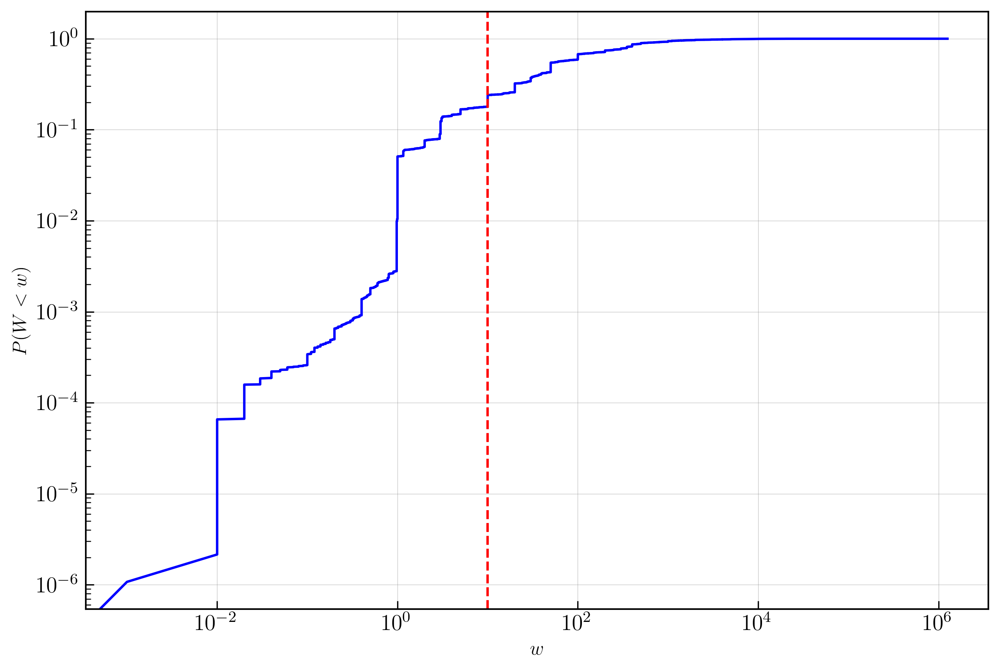

| w   | P(W < w) |
|-----|----------|
| 1 | 0.051 |
| 5 | 0.168 |
| 10 | 0.241 |
| 25 | 0.331 |
| 50 | 0.546 |


In [42]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

x = tx.weight
q=np.linspace(0.001,0.999,100)

# Compute and plot empirical CDF
ecdf = sm.distributions.ECDF(x)
plt.plot(ecdf.x, ecdf.y, 'b-')

# Compute the 20th percentile value
q20 = tx.weight.quantile(0.2)

# Add vertical line at the 20th percentile
plt.axvline(x=q20, color='r', linestyle='--')

# Get current x-ticks and add q20 to them
xticks = np.append(plt.xticks()[0], q20)
plt.xticks(xticks, labels=[f"{t:.2e}" if t != q20 else f"{q20:.2e}" for t in xticks])

# Labels
plt.xlabel(r"$w$")
plt.ylabel(r"$P(W < w)$")
plt.loglog()

# Show plot
plt.show()

# tx.weight.quantile([0.01,0.10,0.2,0.25,0.5,0.75,0.95,0.99])
ws = [1, 5, 10, 25, 50]

# Print markdown table header
print("| w   | P(W < w) |")
print("|-----|----------|")

# Print each row
for w in ws:
    print(f"| {w} | {ecdf(w):.3f} |")





In [43]:
weightfloor = 1
tx = tx[tx.weight>=weightfloor] #filter transactions with amount less than a threshold

In [44]:
agents = basic_agents(tx,how='outer')

cond1 = agents['tx_in'].sum() == agents['tx_out'].sum()
cond2 = agents['vol_in'].sum() == agents['vol_out'].sum()



print(cond1)
if ~cond1: 
    print(abs(agents['tx_in'].sum() - agents['tx_out'].sum()))

print(cond2)
if ~cond2:
    print(abs(agents['vol_in'].sum() - agents['vol_out'].sum()))

True
True


In [45]:
#Preliminary filtering


perturbations = {
    "sym_unif": lambda size: np.random.uniform(-delta, delta, size=size),
    "std_unif": lambda size: np.random.uniform(0, 1, size=size),
    "std_norm": lambda size: np.random.standard_normal(size=size),
    # "wide": lambda size: np.random.uniform(-2*delta, 2*delta, size=size),
}


weightfloor = 1


actfloor = 1
epsilon = 1e0
delta = 0.5
mode = 'std_unif'


volfloor = 0

if testing: 
    fig_path = f'/home/claudio/tesi/sarafu/test_figures/w{weightfloor}_a{actfloor}_{mode}'
    os.makedirs(fig_path, exist_ok=True)


In [46]:
users['total_volume'] = users.svol_in + users.svol_out
users['total_tx'] = users.stxns_in + users.stxns_out
# threshold = users['total_volume'].quantile(0.20)

# threshold

In [47]:
agents = basic_agents(tx,how='outer')

cond1 = agents['tx_in'].sum() == agents['tx_out'].sum()
cond2 = agents['vol_in'].sum() == agents['vol_out'].sum()



print(cond1)
if ~cond1: 
    print(abs(agents['tx_in'].sum() - agents['tx_out'].sum()))

print(cond2)
if ~cond2:
    print(abs(agents['vol_in'].sum() - agents['vol_out'].sum()))


True
True


In [48]:
agents[['tx_in','tx_out','vol_in','vol_out']].sum()

tx_in      9.204700e+05
tx_out     9.204700e+05
vol_in     3.563398e+08
vol_out    3.563398e+08
dtype: float64

In [81]:
tx = TXDF.copy(deep=True)
tx = tx[standard(tx)]
# tx = tx[tx.weight>=weightfloor] #filter transactions with amount less than a threshold

agents = basic_agents(tx) #create agent dataframe
agents = agents[agxmin(agents,'tx_in',actfloor)&agxmin(agents,'tx_out',actfloor)] #filter agents with less than 1 transaction out and 1 in
print(agents[['tx_in','tx_out']].agg(['min','max']))


def conservation(agents):

    cond1 = agents['tx_in'].sum() == agents['tx_out'].sum()
    cond2 = agents['vol_in'].sum() == agents['vol_out'].sum()

    print('----')
    print(cond1)
    if ~cond1: 
        print(abs(agents['tx_in'].sum() - agents['tx_out'].sum()))

    print(cond2)
    if ~cond2:
        print(abs(agents['vol_in'].sum() - agents['vol_out'].sum()))
    print('----')

conservation(agents)

      tx_in  tx_out
min     1.0     1.0
max  2118.0  1838.0
----
False
27787.0
False
5119923.410000026
----


In [82]:

# agents = agents[agents.crid.isin(users.loc[users.total_volume>=5].crid)] #filter out agents that did not exchanged at least 

filtered_crid = agents.crid.unique() #save the ids of the users we do care about


# agents['activity'] = agents['tx_out'] + epsilon*perturbations[mode](size=agents.shape[0]) #define activity bu perturbing the number of transactions out
# agents['attractiveness'] = agents['tx_in'] + epsilon*perturbations[mode](size=agents.shape[0]) #same as activity

tx = tx[(tx.source.isin(filtered_crid)) & (tx.target.isin(filtered_crid)) ] #
# tx = TXDF.copy(deep=True)
tx.reset_index(inplace=True) #
tx['period'] = pd.cut(tx.index, NUM_PERIODS, labels=False) #divide in periods; each period contains same number of transactions


agents = basic_agents(tx)
# tx.groupby('period').weight.count()


In [83]:
cond1 = agents['tx_in'].sum() == agents['tx_out'].sum()
cond2 = agents['vol_in'].sum() == agents['vol_out'].sum()



print(cond1)
if ~cond1: 
    print(abs(agents['tx_in'].sum() - agents['tx_out'].sum()))

print(cond2)
if ~cond2:
    print(abs(agents['vol_in'].sum() - agents['vol_out'].sum()))


True
True


In [52]:
user_map = USERS.copy(deep=True).set_index('crid')['xdai'].to_dict()

agents['xdai'] = agents.crid.map(user_map)

In [53]:
all_balances = balance_constructor(TXDF[['date','source','target','source_bal_post','target_bal_post','type','id']])

all_balances['period'] = pd.cut(all_balances.date, bins=20,labels=False) #period by date


In [54]:
filtered_balances = all_balances.loc[(all_balances.crid.isin(filtered_crid)) & (all_balances.type == 'STANDARD')]

# filtered_balances[filtered_balances.crid == 54973]

In [55]:
bal_pivot = pd.pivot_table(filtered_balances, index='crid',columns='period', values='balance', aggfunc='last')
bal_pivot = bal_pivot.ffill(axis=1)
# bal_pivot = bal_pivot.bfill(axis=1)


In [56]:
bal_pivot

period,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
crid,,,,,,,,,,,,,,,,,,,,
1,25257.726,3507.726,3507.726,8098.786,2374.886,2640.886,244.886,4268.886,3572.966,2572.966,8949.726,11776.726,11776.726,3874.886,2500.886,2820.886,1834.886,103.886,4635.966,10853.966
3,6079.000,4006.800,7436.300,1266.150,162.150,162.150,162.100,175.100,1006.850,1087.850,6619.800,8094.150,2896.150,3120.150,672.150,9446.100,215.100,514.100,514.100,43389.850
6,NaN,648.710,628.710,628.710,628.710,260.670,357.670,428.670,509.280,518.280,676.170,676.170,676.170,676.170,676.170,676.170,676.170,519.670,519.670,519.670
9,NaN,NaN,2799.655,2779.655,1029.655,1029.655,783.655,783.655,783.655,783.655,783.655,783.655,783.655,783.655,783.655,783.655,783.655,783.655,783.655,783.655
12,18.000,18.000,0.000,0.000,0.000,0.000,0.000,0.000,1266.960,1241.960,1241.960,160.000,160.000,160.000,230.000,170.000,1310.000,1310.000,1310.000,1310.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54972,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.000
54973,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.000
54976,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94.000


In [84]:
agents.columns

Index(['crid', 'tx_in', 'vol_in', 'mean_earn', 'median_earn', 'max_earn',
       'min_earn', 'mean_frac_in', 'median_frac_in', 'max_frac_in',
       'min_frac_in', 'in_deg', 'first_txns_in', 'tx_out', 'vol_out',
       'mean_exp', 'median_exp', 'max_exp', 'min_exp', 'mean_frac_out',
       'median_frac_out', 'max_frac_out', 'min_frac_out', 'out_deg',
       'first_txns_out'],
      dtype='object')

In [57]:
js_test_balances = compute_sequential_js(bal_pivot)
# plt.plot()

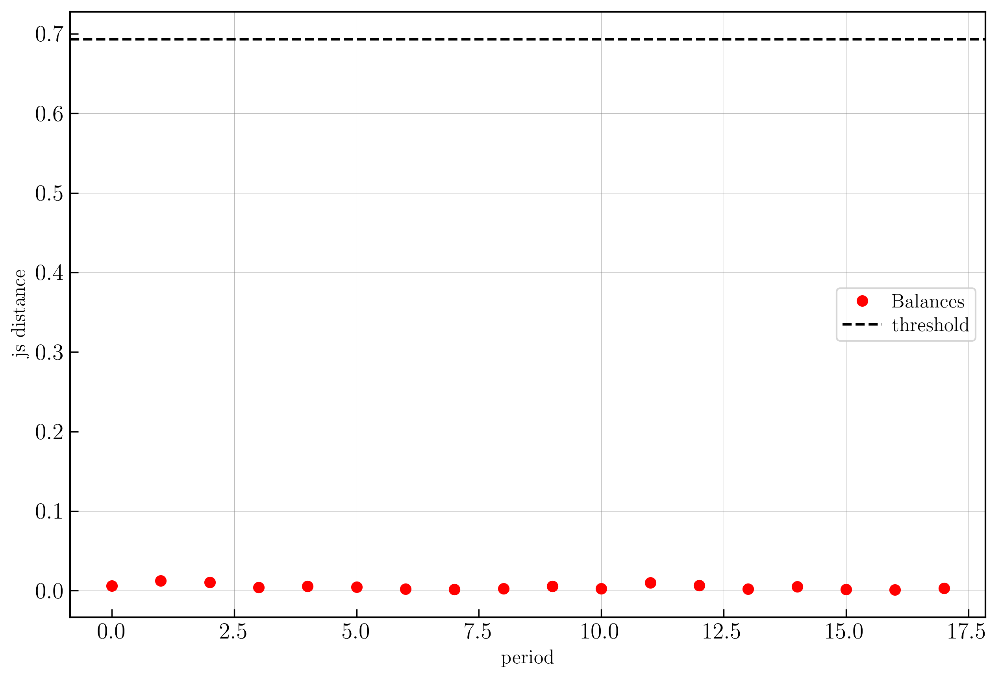

In [58]:
plt.plot(js_test_balances.values(),'ro',label = 'Balances')
plt.axhline(y=np.log(2), label='threshold', color='k', linestyle='--')
plt.xlabel('period')
plt.ylabel('js distance')
plt.legend()

In [59]:
# tx = tx.drop(columns='period')
# tx['period'] = pd.cut(tx.index, NUM_PERIODS, labels=False) #periodize by constant activity
data = []
for period,group in tx.groupby('period'):
    data.append(pd.Series(group.groupby('source').weight.count().values))

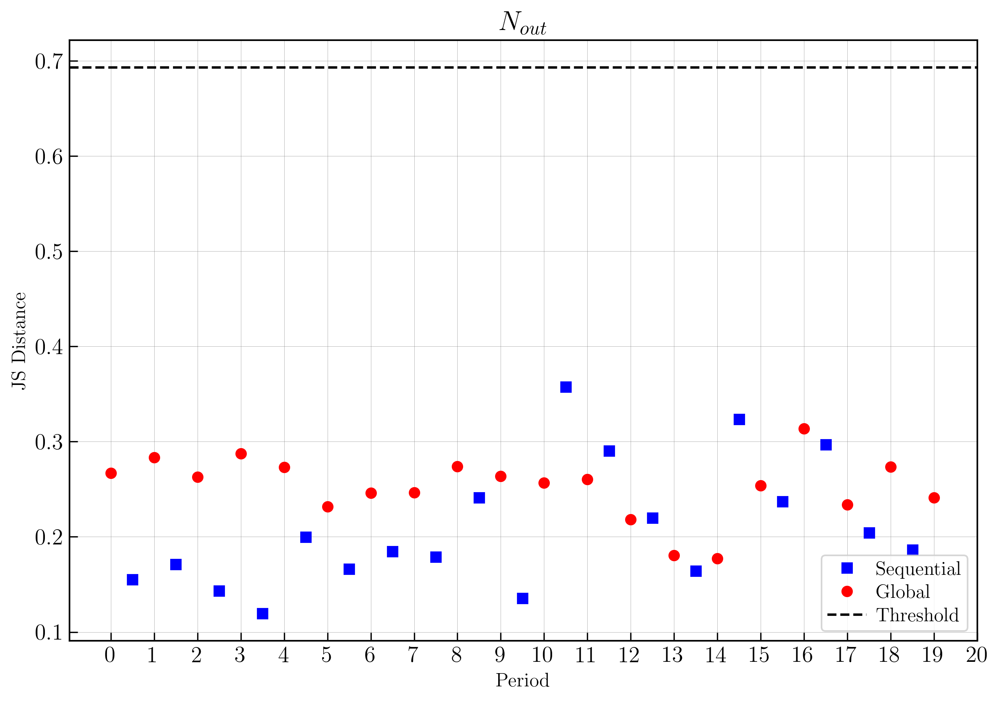

In [60]:
js_test_activity_glob = []
js_test_activity_seq = []


for i in range(1,len(data)):
    # data = data/s
    js_test_activity_seq.append(compute_js_distance((data[i]),(data[i-1]))[1])

for i in range(len(data)):
    js_test_activity_glob.append(compute_js_distance((data[i]),(agents.tx_out))[1])

fig, ax = plt.subplots()
ax.plot(np.arange(0.5, len(js_test_activity_seq) + 0.5, 1), js_test_activity_seq, 'bs', label='Sequential ')
ax.plot(np.arange(0, len(js_test_activity_glob), 1), js_test_activity_glob, 'ro', label='Global ')
# Add threshold line
ax.axhline(y=np.log(2), label='Threshold', color='k', linestyle='--')

# Set integer ticks
ax.set_xticks(np.arange(0, len(js_test_activity_glob) + 1))  # Ensure only integers are shown

# Labels and title
ax.set_xlabel("Period")
ax.set_ylabel("JS Distance")
plt.title(r"$N_{out}$")
plt.legend()

# Show plot
plt.show()

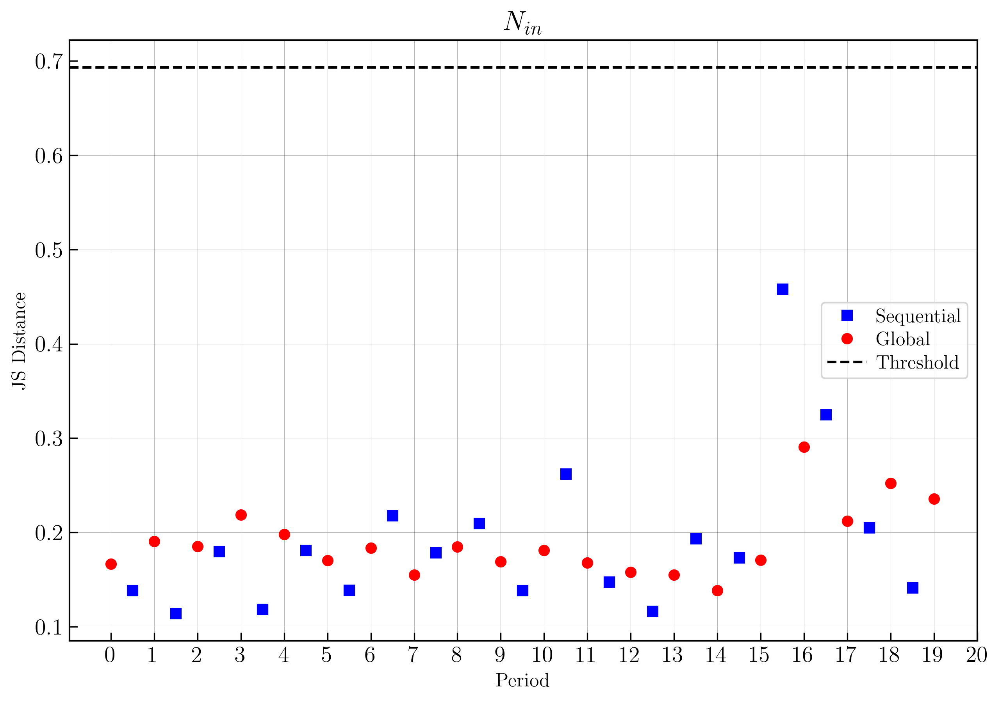

In [61]:
data = []
for period,group in tx.groupby('period'):
    data.append(pd.Series(group.groupby('target').weight.count().values))

js_test_attractiveness_glob = []
js_test_attractiveness_seq = []

for i in range(1,len(data)):
    # data = data/s
    js_test_attractiveness_seq.append(compute_js_distance((data[i]),(data[i-1]))[1])

for i in range(len(data)):
    js_test_attractiveness_glob.append(compute_js_distance((data[i]),(agents.tx_in))[1])

fig, ax = plt.subplots()
ax.plot(np.arange(0.5, len(js_test_attractiveness_seq) + 0.5, 1), js_test_attractiveness_seq, 'bs', label='Sequential ')
ax.plot(np.arange(0, len(js_test_attractiveness_glob), 1), js_test_attractiveness_glob, 'ro', label='Global ')
# Add threshold line
ax.axhline(y=np.log(2), label='Threshold', color='k', linestyle='--')

# Set integer ticks
ax.set_xticks(np.arange(0, len(js_test_attractiveness_glob) + 1))  # Ensure only integers are shown

# Labels and title
ax.set_xlabel("Period")
ax.set_ylabel("JS Distance")
plt.title(r"$N_{in}$")
plt.legend()

# Show plot
plt.show()

In [62]:
agents.tx_out.sum(), agents.tx_in.sum()

(np.float64(388719.0), np.float64(388719.0))

In [63]:
np.quantile(agents.tx_in,0.20)

np.float64(1.0)

Values less than or equal to 0 in data. Throwing out 0 or negative values
Values less than or equal to 0 in data. Throwing out 0 or negative values
Values less than or equal to 0 in data. Throwing out 0 or negative values


Chosen xmin for tx_out: 2.0
KS Statistic: 0.04370494094466415
Quantile of data used for the fit: 0.8011 (80.11%)
Chosen xmin for tx_in: 1.0
KS Statistic: 0.08416783328665645
Quantile of data used for the fit: 0.9677 (96.77%)


Values less than or equal to 0 in data. Throwing out 0 or negative values


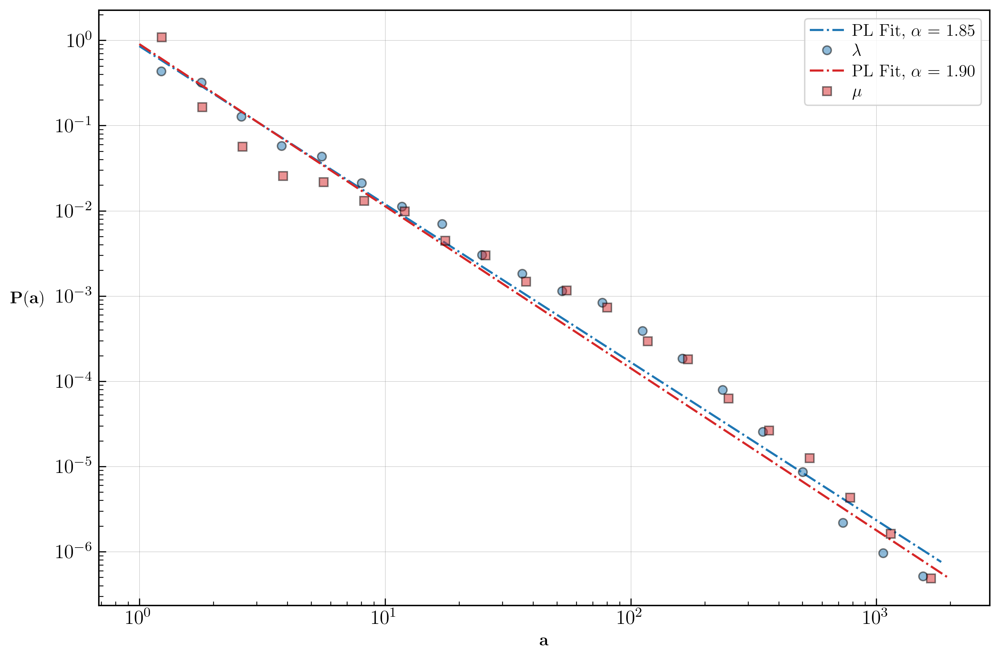

In [ ]:

# Boolean flag to control fitting
perform_fit = 1

alpha = {}
c = {}
colors = ['tab:blue', 'tab:red']
markers = ['o', 's']
disc = False

if perform_fit:
    if disc:
        columns = ['tx_out', 'tx_in']
        labels = [r'$n^{out}$', r'$n^{in}$']
    else:
        # columns = ['activity', 'attractiveness']
        columns = ['tx_out', 'tx_in']
        labels = [r'$\lambda$', r'$\mu$']
else:
    labels = [r'$n^{out}$', r'$n^{in}$']
    columns = ['tx_out', 'tx_in']



fig, ax = plt.subplots()
fits = {}

for idx, col in enumerate(columns):
    # data = agents[col]/agents[col].sum()
    data=agents[col]
    xmin_plot = data[data != 0].min()  # Start plot from same min
    xmax = data.max()

    # Automatically determine xmin for 20% quantile
    xmin_fit = find_xmin_by_quantile(data, quantile=0.25)
    # xmin_fit = 10

    if perform_fit:
        # Fit power-law model
        fit = pwl.Fit(data, xmin=xmin_fit, xmax=xmax, discrete=disc, estimator='Hill', estimate_discrete=disc)
        alpha[col] = fit.power_law.alpha
        xmin_fit = fit.xmin
        xmax = data.max()
        
        print(f"Chosen xmin for {col}: {xmin_fit}")
        print(f"KS Statistic: {fit.D}")
        q = np.sum(data >= xmin_fit) / len(data)
        print(f"Quantile of data used for the fit: {q:.4f} ({q * 100:.2f}%)")

        # Recalculate C for full range
        C_adjusted = recalculate_constant(alpha[col], xmin_plot, xmax)
        
        if disc:
            CC = fit.power_law._pdf_discrete_normalizer
        else:
            CC = fit.power_law._pdf_continuous_normalizer

        fits[col] = (fit, C_adjusted)
        # fit.plot_pdf(ax=ax,
        #              original_data=True,
        #              marker=markers[idx], 
        #              linestyle='', 
        #              markeredgecolor='k', 
        #              alpha=0.5, 
        # label=labels[idx], 
        # color=colors[idx],)

        # fit.power_law.plot_pdf(ax=ax, 
        #                        linestyle='--' , 
        #                        color=colors[idx], 
        #                        label=r'PL Fit, $\alpha$ = %.2f' % alpha[col],
        #                        )
        # Perform power-law fitting on subset (x >= xmin_fit)
        fit = pwl.Fit(data, xmin=xmin_fit, xmax=xmax, discrete=disc, estimator='Hill', estimate_discrete=disc)
        alpha[col] = fit.power_law.alpha

        # Normalize C for full dataset range
        C_adjusted = recalculate_constant(alpha[col], xmin_plot, xmax)

        # Generate x-values for fitted curve using full dataset range
        x = np.logspace(np.log10(xmin_plot), np.log10(xmax), 1000)
        y = powerlaw_function(x, alpha=alpha[col], xmin=xmin_plot, C=C_adjusted)

        # Plot adjusted power-law fit over full dataset range
        ax.plot(x, y, label=r'PL Fit, $\alpha$ = %.2f' % alpha[col], color=colors[idx], linestyle='-.')

        # Plot empirical distribution on full dataset
    plot_distribution(data, 
                    marker=markers[idx], 
                    linestyle='', 
                    markeredgecolor='k',
                    alpha=0.5, 
                    label=labels[idx], 
                    color=colors[idx],
                    ax=ax)

# Legend and labels
if perform_fit:
    ax.set_ylabel(r"$\mathbf{P(a)}$", rotation=0, labelpad=20)
    ax.set_xlabel(r"$\mathbf{a}$")
else:
    ax.set_ylabel(r"$\mathbf{P(n)}$", rotation=0, labelpad=20)
    ax.set_xlabel(r"$\mathbf{n}$")

ax.set_xscale('log')
ax.set_yscale('log')
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

sax = ax
sfig = fig


Values less than or equal to 0 in data. Throwing out 0 or negative values
Values less than or equal to 0 in data. Throwing out 0 or negative values


Chosen xmin for tx_out: 5.145104818647918e-06
KS Statistic: 0.04370494094466415
Quantile of data used for the fit: 0.8011 (80.11%)
Chosen xmin for tx_in: 2.572552409323959e-06
KS Statistic: 0.08416783328665645
Quantile of data used for the fit: 0.9677 (96.77%)


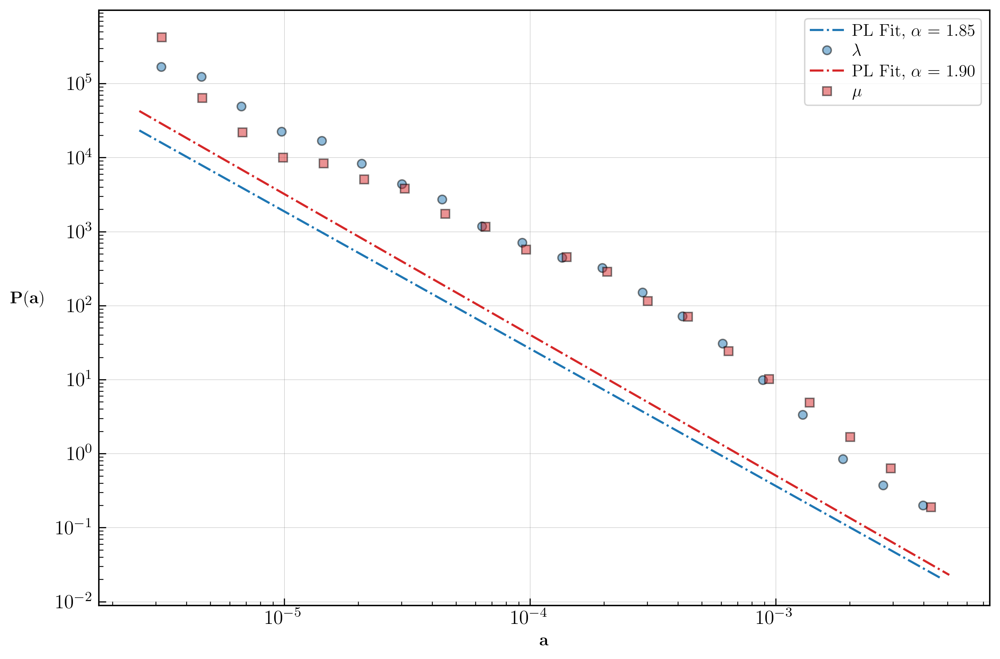

In [64]:

# Boolean flag to control fitting
perform_fit = 1

alpha = {}
c = {}
colors = ['tab:blue', 'tab:red']
markers = ['o', 's']
disc = False

if perform_fit:
    if disc:
        columns = ['tx_out', 'tx_in']
        labels = [r'$n^{out}$', r'$n^{in}$']
    else:
        # columns = ['activity', 'attractiveness']
        columns = ['tx_out', 'tx_in']
        labels = [r'$\lambda$', r'$\mu$']
else:
    labels = [r'$n^{out}$', r'$n^{in}$']
    columns = ['tx_out', 'tx_in']



fig, ax = plt.subplots()
fits = {}

for idx, col in enumerate(columns):
    data = agents[col] / agents[col].sum()  # Keep normalization
    xmin_plot = data[data != 0].min()  # Start plotting from this minimum
    xmax = data.max()

    # Select xmin for fitting based on quantile
    xmin_fit = find_xmin_by_quantile(data, quantile=0.25)

    if perform_fit:
        # Fit power-law model on the subset (x >= xmin_fit)
        fit = pwl.Fit(data, xmin=xmin_fit, xmax=xmax, discrete=disc, estimator='Hill', estimate_discrete=disc)
        alpha[col] = fit.power_law.alpha
        xmin_fit = fit.xmin  # Ensure we use the chosen fit threshold

        print(f"Chosen xmin for {col}: {xmin_fit}")
        print(f"KS Statistic: {fit.D}")
        q = np.sum(data >= xmin_fit) / len(data)
        print(f"Quantile of data used for the fit: {q:.4f} ({q * 100:.2f}%)")

        # Compute correct normalization constant for full data range
        C_adjusted = recalculate_constant(alpha[col], xmin_plot, xmax)

        # Generate x-values for the fitted curve (entire range)
        x = np.logspace(np.log10(xmin_plot), np.log10(xmax), 1000)
        y = x**-fit.power_law.alpha/1e6

        # Plot the power-law fit over the full range
        ax.plot(x, y, label=r'PL Fit, $\alpha$ = %.2f' % alpha[col], color=colors[idx], linestyle='-.')

        fits[col] = (fit, C_adjusted)

    # Plot empirical PDF using full dataset
    plot_distribution(data, 
                      marker=markers[idx], 
                      linestyle='', 
                      markeredgecolor='k',
                      alpha=0.5, 
                      label=labels[idx], 
                      color=colors[idx],
                      ax=ax)



# Legend and labels
if perform_fit:
    ax.set_ylabel(r"$\mathbf{P(a)}$", rotation=0, labelpad=20)
    ax.set_xlabel(r"$\mathbf{a}$")
else:
    ax.set_ylabel(r"$\mathbf{P(n)}$", rotation=0, labelpad=20)
    ax.set_xlabel(r"$\mathbf{n}$")

ax.set_xscale('log')
ax.set_yscale('log')
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

sax = ax
sfig = fig


In [65]:
agents.tx_in.min()

np.float64(0.0)

In [69]:

# Boolean flag to control fitting
perform_fit = 1

alpha = {}
c = {}
colors = ['tab:blue', 'tab:red']
markers = ['o', 's']
disc = False

if perform_fit:
    if disc:
        columns = ['tx_out', 'tx_in']
        labels = [r'$n^{out}$', r'$n^{in}$']
    else:
        # columns = ['activity', 'attractiveness']
        columns = ['tx_out', 'tx_in']
        labels = [r'$\lambda$', r'$\mu$']
else:
    labels = [r'$n^{out}$', r'$n^{in}$']
    columns = ['tx_out', 'tx_in']



# fig, ax = plt.subplots()
fits = {}

for idx, col in enumerate(columns):
    data = agents[col] / agents[col].sum()  # Keep normalization
    xmin_plot = data[data != 0].min()  # Start plotting from this minimum
    xmax = data.max()

    # Select xmin for fitting based on quantile
    xmin_fit = find_xmin_by_quantile(data, quantile=0.25) # Ensure we use the chosen fit threshold

    # Fit power-law model on the subset (x >= xmin_fit)
    fit = pwl.Fit(data, xmin=xmin_fit, xmax=xmax, discrete=disc, estimator='Hill', estimate_discrete=disc)
    fits[col] = {}
    fits[col]['alpha'] = fit.power_law.alpha
    fits[col]['xmin'] = data.min()
    fits[col]['xmax'] = data.max()
    
    



Values less than or equal to 0 in data. Throwing out 0 or negative values
Values less than or equal to 0 in data. Throwing out 0 or negative values


IndexError: index 0 is out of bounds for axis 0 with size 0

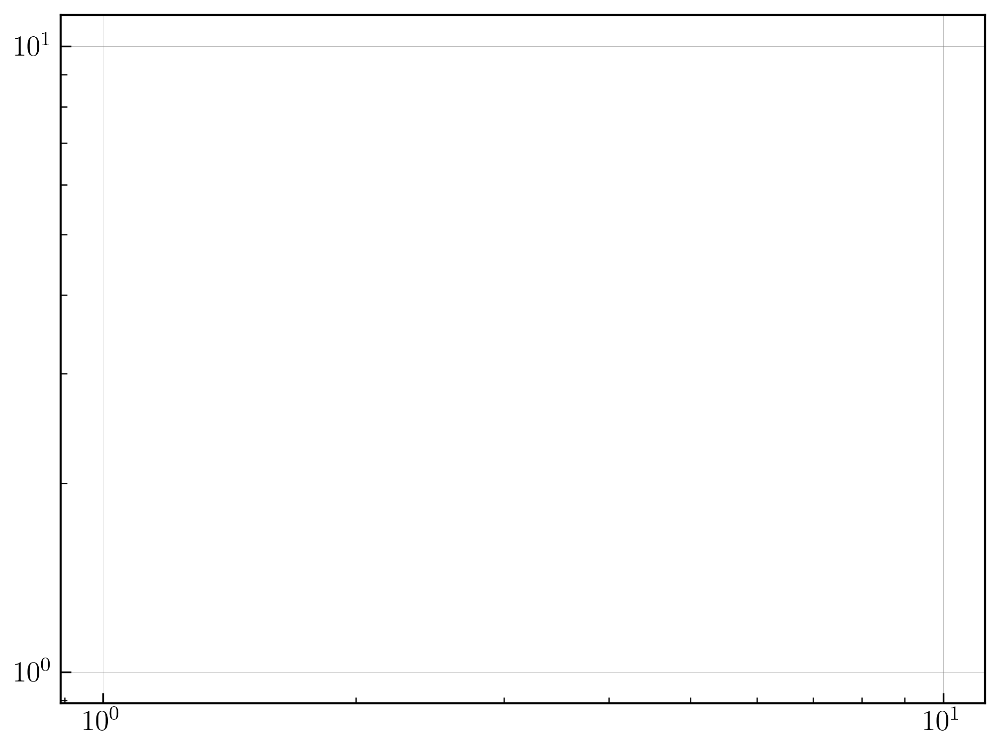

In [70]:
import numpy as np
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8, 6))

for idx, col in enumerate(columns):
    # Ingredients
    data = agents[col] / agents[col].sum()  # Scaled data
    exponent = fits[col]['alpha']  # Fitted exponent

    # Log binning
    bins = np.logspace(np.log10(data.min()), np.log10(data.max()), num=50)  # Adjust num for resolution
    hist, bin_edges = np.histogram(data, bins=bins, density=True)

    # Drop zero-count bins
    nonzero = hist > 0
    hist = hist[nonzero]
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    bin_centers = bin_centers[nonzero]

    # Plot histogram
    ax.loglog(bin_centers, hist, 'o', markersize=5, label=labels[idx])

    # Power-law line
    x_fit = np.logspace(np.log10(data.min()), np.log10(data.max()), 100)
    y_fit = x_fit ** -exponent
    y_fit *= hist[0] / y_fit[0]  # Scale to match the first histogram bin

    ax.loglog(x_fit, y_fit, '-.', label=r'PL Fit, $\alpha$ = %.2f' % exponent, color=colors[idx])

# Labels, legend, and log-log scale
ax.set_xscale('log')
ax.set_yscale('log')

if perform_fit:
    ax.set_ylabel(r"$\mathbf{P(a)}$", rotation=0, labelpad=20)
    ax.set_xlabel(r"$\mathbf{a}$")
else:
    ax.set_ylabel(r"$\mathbf{P(n)}$", rotation=0, labelpad=20)
    ax.set_xlabel(r"$\mathbf{n}$")

ax.legend()
# ax.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.tight_layout()
plt.show()


In [52]:
agents.tx_in.sum()

np.float64(419040.0)

In [50]:
tx.shape

(388719, 21)

In [ ]:
(pd.DataFrame(fits).T).to_csv('fit_results.csv')

In [71]:
if perform_fit:
    fig.savefig(f'{fig_path}/actattr_fit.png')
else:
    fig.savefig(f'{fig_path}/txintxout.png')

Text(0, 0.5, '$\\mu$')

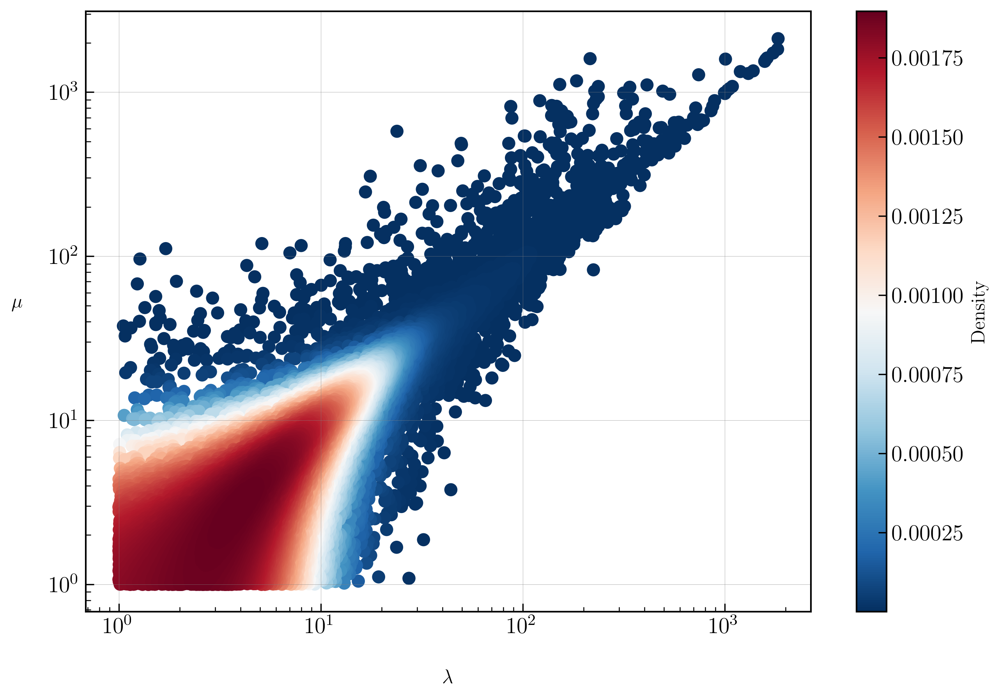

In [72]:
data = agents[['activity','attractiveness']].values
# data = np.column_stack((standard_scaler_shift(agents.activity),standard_scaler_shift(agents.attractiveness)))


fig,ax=plt.subplots()
xlabel = r'$\lambda$'
ylabel = r'$\mu$'

plot_scatter_kde(data,ax,cmap='RdBu_r')
plt.loglog()
plt.xlabel(xlabel,rotation = 0,labelpad=20)
plt.ylabel(ylabel,rotation = 0,labelpad=20)

In [73]:
fig.savefig(f'{fig_path}/actattr_corr.png')

Text(0, 0.5, '$N^{In}$')

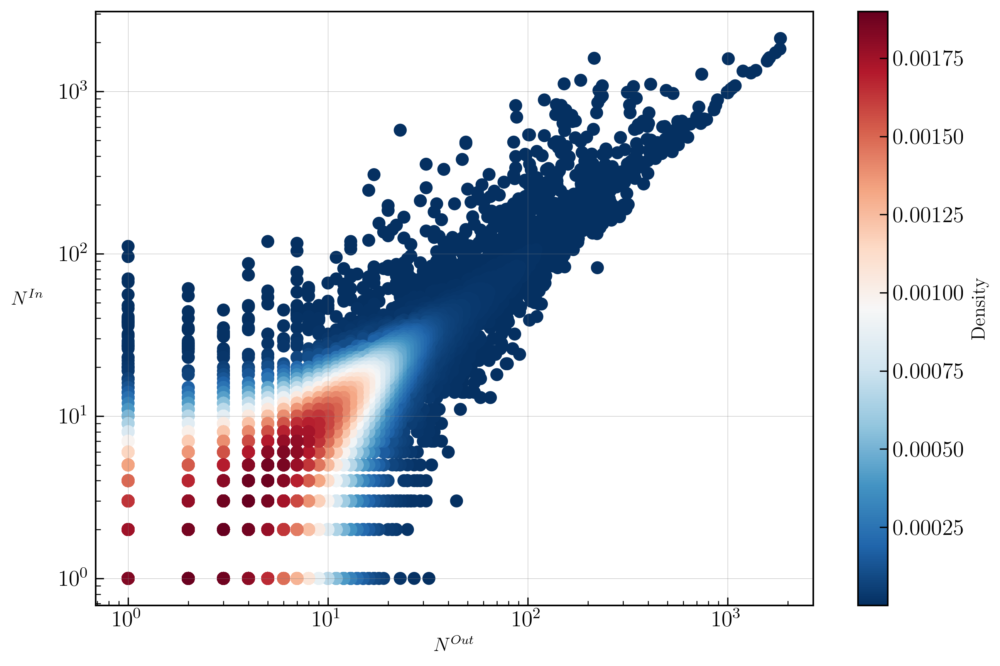

In [74]:
data = agents[['tx_out','tx_in']].values

fig,ax=plt.subplots()
xlabel = r'$N^{out}$'
ylabel = r'$N^{in}$'

plot_scatter_kde(data,ax,cmap='RdBu_r')
plt.loglog()
plt.xlabel(xlabel.title())
plt.ylabel(ylabel.title(),rotation = 0,labelpad=20)


In [75]:
fig.savefig(f'{fig_path}/txintxout_corr.png')

Text(0, 0.5, 'Psob($N^{In})$')

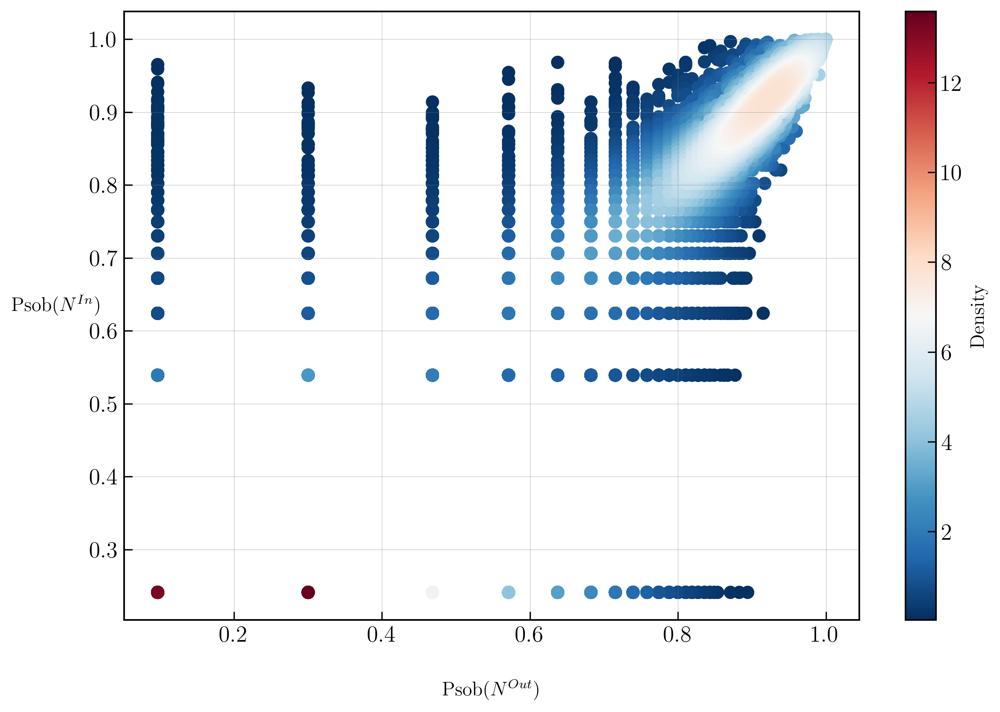

In [76]:
data = agents[['tx_out','tx_in']]

ranked_data = data.rank(pct=True)
# ranked_data = data.rank()

fig,ax=plt.subplots()
xlabel = r'PsOb($N^{out}$)'
ylabel = r'PsOb($N^{in})$'

plot_scatter_kde(ranked_data.values,ax,cmap='RdBu_r')
# plt.loglog()
plt.xlabel(xlabel.title(),rotation = 0,labelpad=20)
plt.ylabel(ylabel.title(),rotation = 0,labelpad=20)


In [77]:
fig.savefig(f'{fig_path}/actattr_rank.png')

Text(0, 0.5, 'PsOb($\\mu$)')

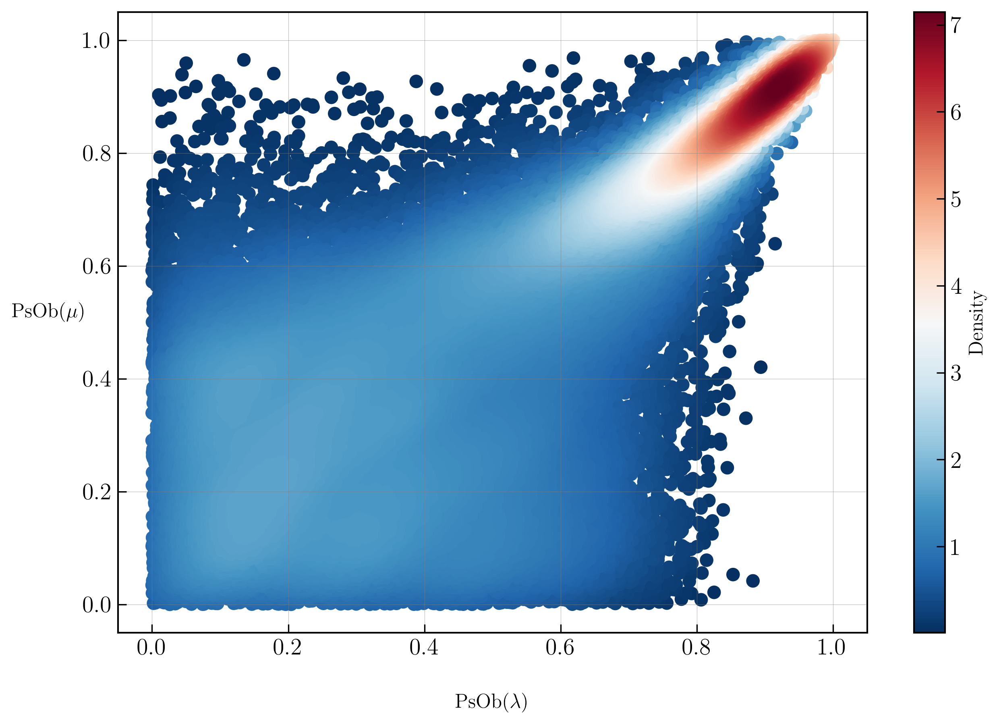

In [78]:

data = agents[['activity','attractiveness']].dropna()  


jittered_ranks = data.rank(pct=True)
# jittered_ranks = data.rank()

fig,ax=plt.subplots()
xlabel = r'PsOb($\lambda$)'
ylabel = r'PsOb($\mu$)'


plot_scatter_kde(jittered_ranks.values,ax,cmap='RdBu_r')
# plt.loglog()
plt.xlabel(xlabel,rotation=0,labelpad=20)
plt.ylabel(ylabel,rotation=0,labelpad=20)


In [79]:
fig.savefig(f'{fig_path}/actattr_rank_pert.png')

clayton [0.68116579] 2278.6778920832976
gumbel [2.22019175] 10811.44093661295
frank [5.75048828] 7341.597395385998
joe [2.97016408] 14642.899913749923
galambos [0.99364015] 6760.180708522537
fgm [0.999999] 4107.2336865925745
plackett [12.56821604] 7915.97616452755
rgumbel [1.66098756] 4513.264611095597
rclayton [2.6894385] 13168.229002193788
rjoe [1.] 11400.1453077244
rgalambos [0.63301174] 2643.9026426750347
BB1 [1.00000304e-06 2.22012000e+00] 10811.434860518339
 message: Inequality constraints incompatible
 success: False
  status: 4
     fun: nan
       x: [ 1.000e+00  1.000e+00]
     nit: 1
     jac: [       nan        nan]
    nfev: 3
    njev: 1
optimization failed
Error fitting BB2: cannot unpack non-iterable NoneType object
Best copula: joe, Parameter: [2.97016408], Score: 14642.899913749923


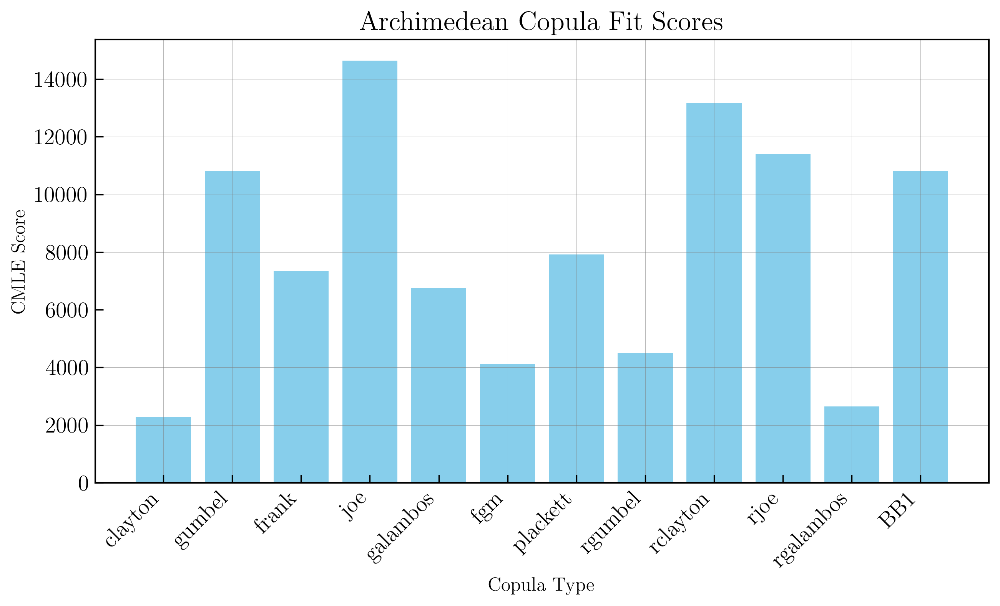

In [80]:
import matplotlib.pyplot as plt
import numpy as np
from pycop import estimation, archimedean

# Assuming 'agents' DataFrame exists
data = agents[['activity', 'attractiveness']]
data = data.rank(pct=True).T.values

max_score = 0
cmles = []
copula_types = []
fitted_params = []

for copula_type in archimedean.Archimedean_families:
    try:
        cop = archimedean(copula_type)
        param, cmle = estimation.fit_cmle(cop, data)
        cmles.append(cmle)
        copula_types.append(copula_type)
        fitted_params.append(param)
                
        if cmle >= max_score:
            max_score = cmle
            winner = copula_type
            winner_param = param
        
        print(copula_type, param, cmle)
    except Exception as e:
        print(f"Error fitting {copula_type}: {e}")
        pass

print(f'Best copula: {winner}, Parameter: {winner_param}, Score: {max_score}')

# Plot CMLE scores
fig = plt.figure(figsize=(10, 5))
plt.bar(copula_types, cmles, color='skyblue')
plt.xlabel('Copula Type')
plt.ylabel('CMLE Score')
plt.title('Archimedean Copula Fit Scores')
plt.xticks(rotation=45, ha='right')
plt.show()


In [81]:
# fig.savefig(f'{fig_path}/copulafit.png')
save_figure(fig,f'{fig_path}/copulafit.png')

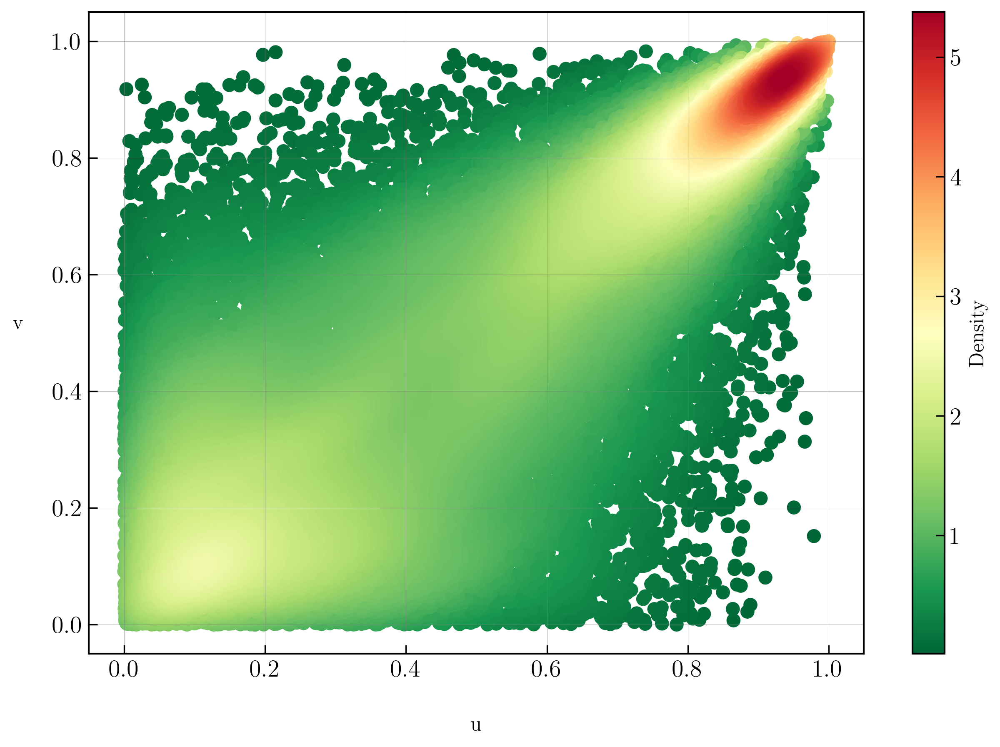

In [82]:
import numpy as np
import matplotlib.pyplot as plt
from pycop.simulation import simu_archimedean

# Define the best copula and parameter found from the previous script
best_copula_type = winner  # Ensure 'winner' is set from the previous script
best_param = winner_param  # Ensure 'winner_param' is set from the previous script

# Initialize the copula
size = agents.shape[0]
u,v = simu_archimedean(best_copula_type, 2,size,theta=best_param[0])

# Plot the generated sample
fig = plt.figure()
plot_scatter_kde(np.column_stack((u, v)),ax=plt.gca(),cmap='RdYlGn_r')
plt.xlabel('u',rotation = 0,labelpad=20)
plt.ylabel('v',rotation = 0,labelpad=20)
plt.show()

# # If needed, store the sample in a variable for further analysis
# synthetic_data = sample


In [83]:
samples = {'u':u,
           'v':v,
           'activity':powlaw_ppf(fits['tx_out'][0].power_law.alpha,fits['tx_out'][0].power_law.xmin,fits['tx_out'][0].power_law.xmax)(u),
           'attractiveness':powlaw_ppf(fits['tx_in'][0].power_law.alpha,fits['tx_in'][0].power_law.xmin,fits['tx_in'][0].power_law.xmax)(v)}

KeyError: 'tx_out'

In [ ]:
fig.savefig(f'{fig_path}/copulafit_sample.png')

In [ ]:
print('Real Tx_in-out Correlation')
for method in ['pearson', 'kendall', 'spearman']:
    print(f"{method}:{agents[['tx_out','tx_in']].corr(method=method).values[1,0]}")        

Real Tx_in-out Correlation
pearson:0.8922634388643664
kendall:0.6234674507682508
spearman:0.7274100399087775


In [ ]:
print('Real Rank Tx_in-out Correlation')
for method in ['pearson', 'kendall', 'spearman']:
    print(f"{method}:{agents[['tx_out','tx_in']].rank(pct=True).corr(method=method).values[1,0]}")   

Real Rank Tx_in-out Correlation
pearson:0.7274100399087743
kendall:0.6234674507682508
spearman:0.7274100399087775


In [ ]:
print('Real Activity-Attractiveness Correlation')
for method in ['pearson', 'kendall', 'spearman']:
    print(f"{method}:{agents[['activity','attractiveness']].corr(method=method).values[1,0]}")        

Real Activity-Attractiveness Correlation
pearson:0.8922575341323395
kendall:0.504787768812363
spearman:0.6744998386723721


In [ ]:
print('Real Rank Activity-Attractiveness Correlation')
for method in ['pearson', 'kendall', 'spearman']:
    print(f"{method}:{agents[['activity','attractiveness']].rank(pct=True).corr(method=method).values[1,0]}")        

Real Rank Activity-Attractiveness Correlation
pearson:0.6744998386723741
kendall:0.504787768812363
spearman:0.6744998386723721


In [ ]:
print('Simulated Rank Activity-Attractiveness Correlation')
for method in ['pearson', 'kendall', 'spearman']:
    print(f"{method}:{samples[['activity','attractiveness']].rank(pct=True).corr(method=method).values[1,0]}")        

print('Simulated Activity-Attractiveness Correlation')
for method in ['pearson', 'kendall', 'spearman']:
    print(f"{method}:{samples[['activity','attractiveness']].corr(method=method).values[1,0]}")        

print('Copula Sample Rank Correlation')
for method in ['pearson', 'kendall', 'spearman']:
    print(f"{method}:{samples[['u','v']].rank(pct=True).corr(method=method).values[1,0]}")            

print('Copula Sample Correlation')
for method in ['pearson', 'kendall', 'spearman']:
    print(f"{method}:{samples[['u','v']].rank(pct=True).corr(method=method).values[1,0]}")                

Simulated Rank Activity-Attractiveness Correlation
pearson:0.6985170330706373
kendall:0.5157082920066478
spearman:0.6985170330706334
Simulated Activity-Attractiveness Correlation
pearson:0.8750466779292433
kendall:0.5157082920066478
spearman:0.6985170330706334
Copula Sample Rank Correlation
pearson:0.6985170330706373
kendall:0.5157082920066478
spearman:0.6985170330706334
Copula Sample Correlation
pearson:0.6985170330706373
kendall:0.5157082920066478
spearman:0.6985170330706334


In [ ]:
samples = pd.DataFrame(samples)

cop = pd.DataFrame({'u':u,'v':v})

pairs = [(agents[['activity', 'attractiveness']].values,samples[['activity', 'attractiveness']].values),
 (agents[['activity', 'attractiveness']].rank(pct=True).values,cop[['u','v']].values),
#  (np.random.uniform([0,0],[1,1],size=(1000,2)),np.random.uniform([0,0],[1,1],size=(1000,2)))
]

names = ['observation','pseudo-observations']

for i,pair in enumerate(pairs):
    q,t = pair
    print(f'js distance :{names[i]}',np.sqrt(compute_js_divergence(q,t)))
    print('-----')

js distance :observation 0.0052574272073944
-----
js distance :pseudo-observations 0.15745352429157064
-----


In [ ]:
best_copula_type

tx_out 1.853878449594268
tx_in 1.8683059539572178


In [ ]:
labels = ['activity','attractiveness']

for label in labels:
    a,b = compute_js_distance(samples[label],agents[label])
    print(f'JS distance {label}: {b}')
    print('-----')

JS distance activity: 0.09219712259269665
-----
JS distance attractiveness: 0.07284196411358695
-----


In [ ]:

print('Goodness of fit real data vs generated sample')
cop = np.stack((u,v))
for idx, col in enumerate(columns):
    print(col)
    observed_data = agents[col]
    fit,C = fits[col]
    fitted_data = powlaw_ppf(fit.alpha,fit.xmin,fit.xmax)(cop[idx])
    result = entropy_goodness_of_fit(fitted_data,observed_data)

    print(result)


In [ ]:
labels = [r'$\hat{\lambda}$',r'$\hat{\mu}$']
markers = ['v','^']
# samples = {}

for idx, col in enumerate(columns):
    print(col)
    observed_data = agents[col]
    fit,C = fits[col]
    fitted_data = powlaw_ppf(fit.alpha,observed_data.min(),fit.xmax)(cop[idx])
    samples[col] = fitted_data
    # result = entropy_goodness_of_fit(fitted_data,observed_data)
    plot_distribution(fitted_data,ax=sax, linestyle='',marker = markers[idx],markeredgecolor='k',alpha=0.5,label = labels[idx],color=colors[idx])

    print(result)


# lam = powlaw_ppf(1.60,1-delta,1838+delta)(u)
# mu = powlaw_ppf(1.63,1-delta,2118+delta)(v)
# plot_distribution(lam,ax=sax, color = 'blue', linestyle='',marker = '*',markeredgecolor='k',alpha=0.5)
# plot_distribution(mu,ax=sax, color = 'red',linestyle='', marker = 'd',markeredgecolor='k',alpha=0.5)
sfig

In [ ]:
samples = pd.DataFrame(samples)

for tipo in ['pearson', 'kendall', 'spearman']:
    print(tipo)
    print(samples[['u','v']].corr(tipo),agents[['activity', 'attractiveness']].rank(pct=True).corr(tipo))
    print('\n')

In [ ]:
sfig.savefig(f'{fig_path}/synth_actattr.png')

In [ ]:
fig = plt.figure()
plot_scatter_kde(np.round(np.column_stack((samples['activity'],samples['attractiveness'])),0),ax=plt.gca(),cmap='RdYlGn_r' )
plt.loglog()
plt.xlabel(r'$\bar{\lambda}$',rotation = 0,labelpad=20)
plt.ylabel(r'$\bar{\mu}$',rotation = 0,labelpad=20)

In [ ]:
fig.savefig(f'{fig_path}/synth_actattr_corr_round.png')

In [ ]:
fig = plt.figure()  
plot_scatter_kde(np.column_stack((samples['activity'],samples['attractiveness'])),ax=plt.gca(),cmap='RdYlGn_r' )
plt.loglog()
plt.xlabel(r'$\hat{\lambda}$',rotation = 0,labelpad=20)
plt.ylabel(r'$\hat{\mu}$',rotation = 0,labelpad=20)

In [ ]:
fig.savefig(f'{fig_path}/synth_actattr_corr_round.png')

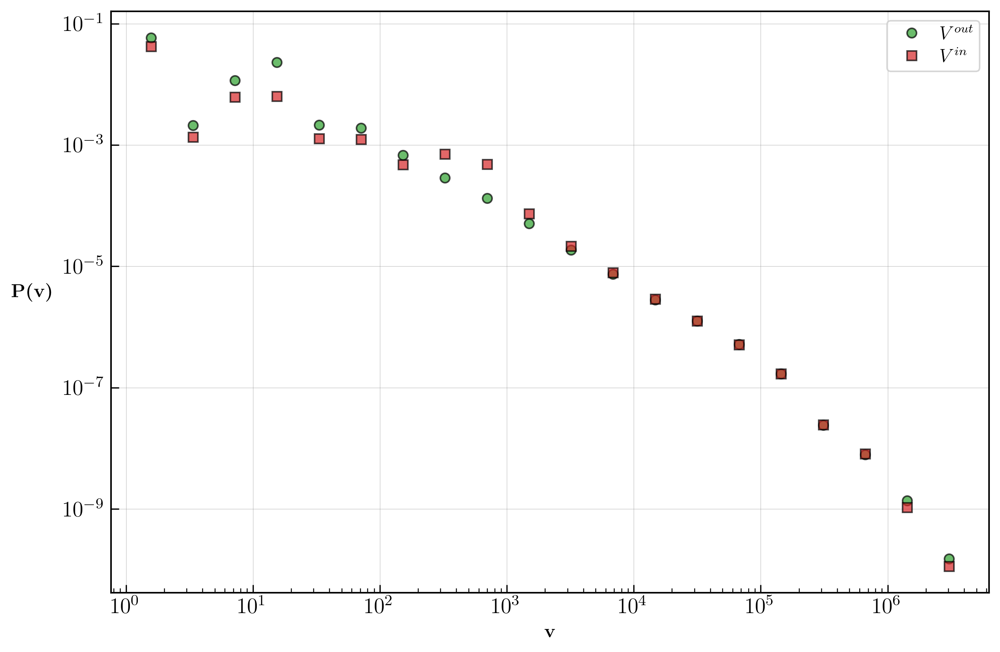

In [84]:
data = agents[['vol_out','vol_in']]

fig = plt.figure()
# ax=plt.gca()
xlabel = r'$V^{out}$'
ylabel = r'$V^{in}$'

plot_distribution(data.vol_in,ax=plt.gca(),color='tab:green',markeredgecolor='k',alpha = 0.7, linestyle='', marker='o',label = xlabel)
plot_distribution(data.vol_out,ax=plt.gca(),color='tab:red',markeredgecolor='k',alpha = 0.7, linestyle='', marker='s',label= ylabel)
plt.xlabel(r'$\textbf{v}$')
plt.ylabel(r'$\textbf{P(v)}$',rotation = 0,labelpad=20)
plt.legend()

In [85]:
fig.savefig(f'{fig_path}/volinvolout.png')

Text(0, 0.5, '$V^{In}$')

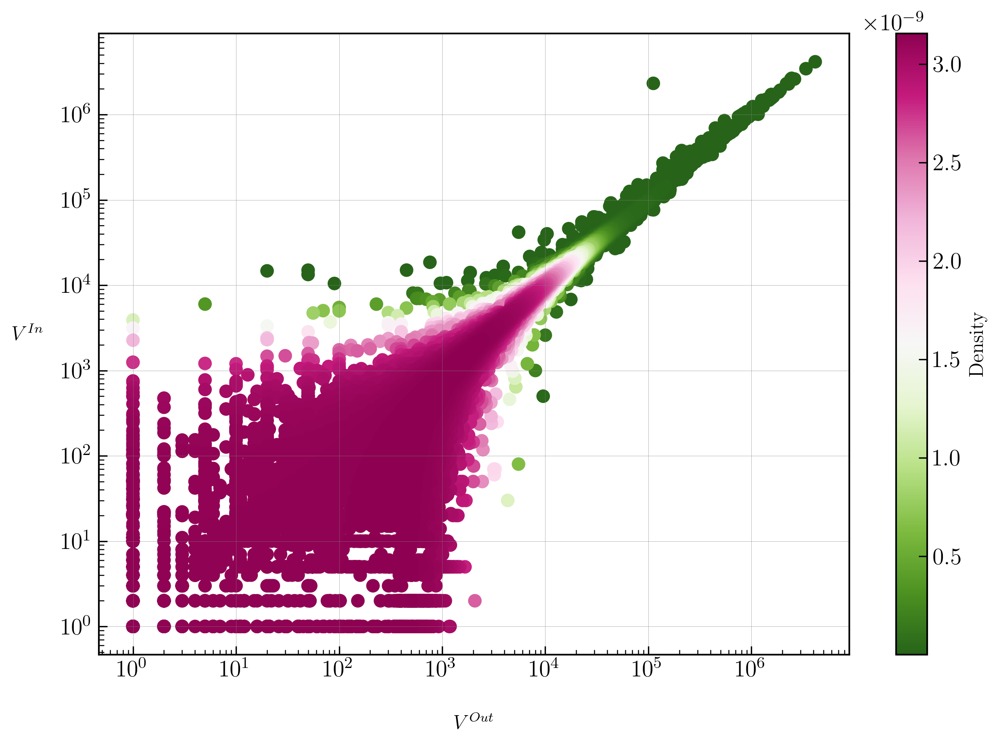

In [86]:
fig,ax=plt.subplots()
plot_scatter_kde(data.values,ax,cmap='PiYG_r')
plt.loglog()
plt.xlabel(xlabel.title(),rotation = 0,labelpad=20)
plt.ylabel(ylabel.title(),rotation = 0,labelpad=20)


In [87]:
fig.savefig(f'{fig_path}/volinvoloutcorr.png')

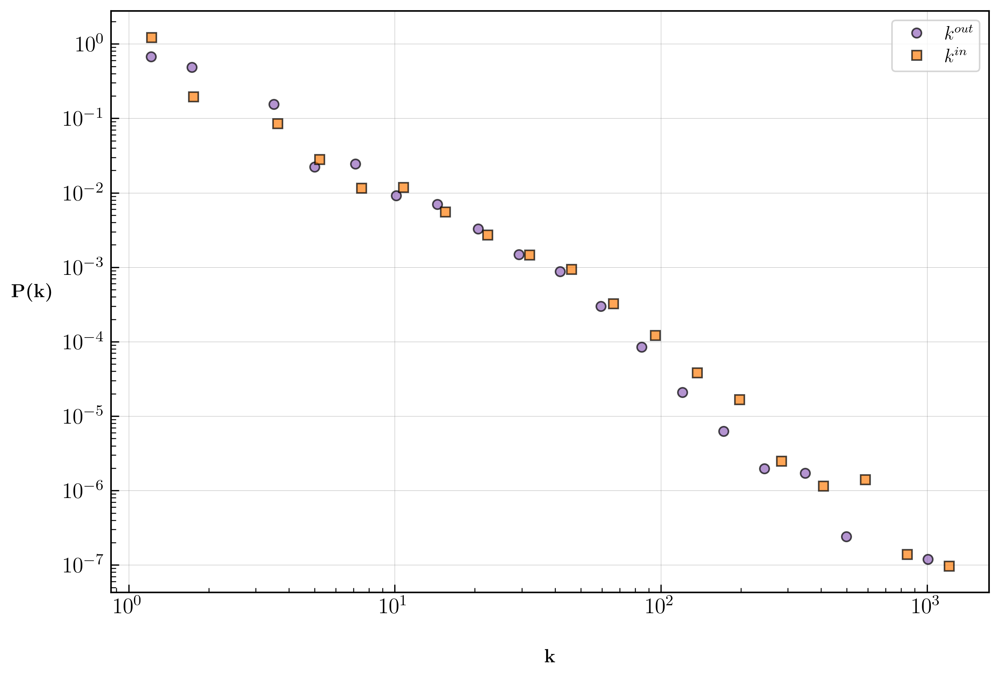

In [88]:
data = agents[['out_deg','in_deg']]

fig = plt.figure()
# ax=plt.gca()
xlabel = r'$k^{out}$'
ylabel = r'$k^{in}$'
colors = ['tab:purple', 'tab:orange']

plot_distribution(data.out_deg,ax=plt.gca(),color=colors[0],markeredgecolor='k',alpha = 0.7, linestyle='', marker='o',label = xlabel)
plot_distribution(data.in_deg,ax=plt.gca(),color=colors[1],markeredgecolor='k',alpha = 0.7, linestyle='', marker='s',label= ylabel)
plt.xlabel(r'$\textbf{k}$',rotation = 0,labelpad=20)
plt.ylabel(r'$\textbf{P(k)}$',rotation = 0, labelpad=20)
plt.legend()

In [89]:
fig.savefig(f'{fig_path}/degindegout.png')

Text(0, 0.5, '$K^{In}$')

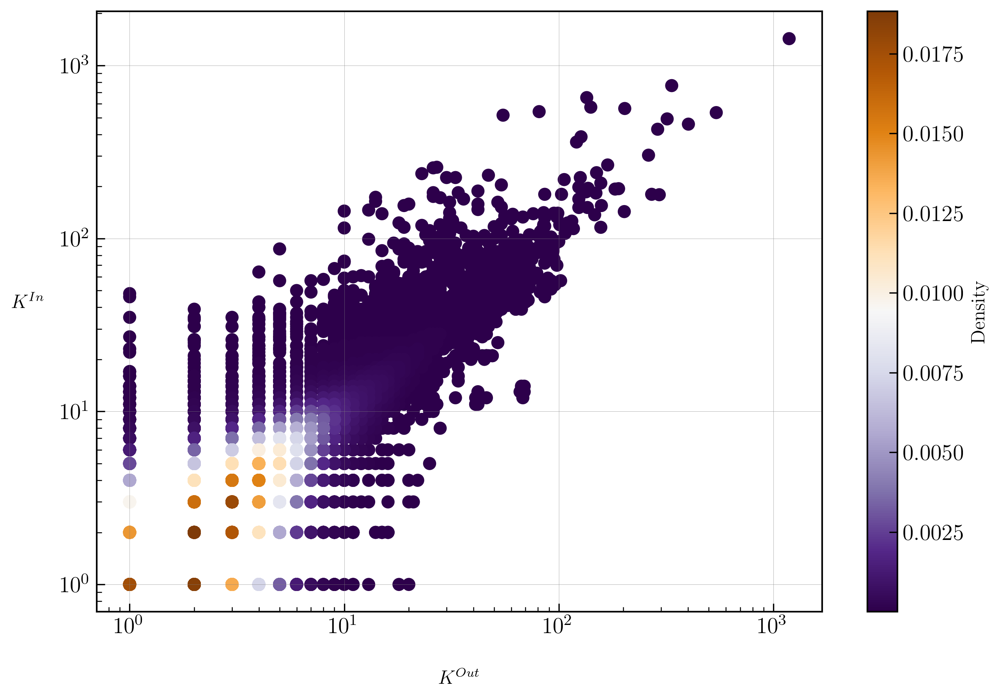

In [90]:
fig,ax=plt.subplots()
plot_scatter_kde(data.values,ax,cmap='PuOr_r')
plt.loglog()
plt.xlabel(xlabel.title(),rotation = 0,labelpad=20)
plt.ylabel(ylabel.title(),rotation = 0,labelpad=20)

In [91]:
fig.savefig(f'{fig_path}/degindegoutcorr.png')

Text(0, 0.5, '$p(\\langle \\xi \\rangle)$')

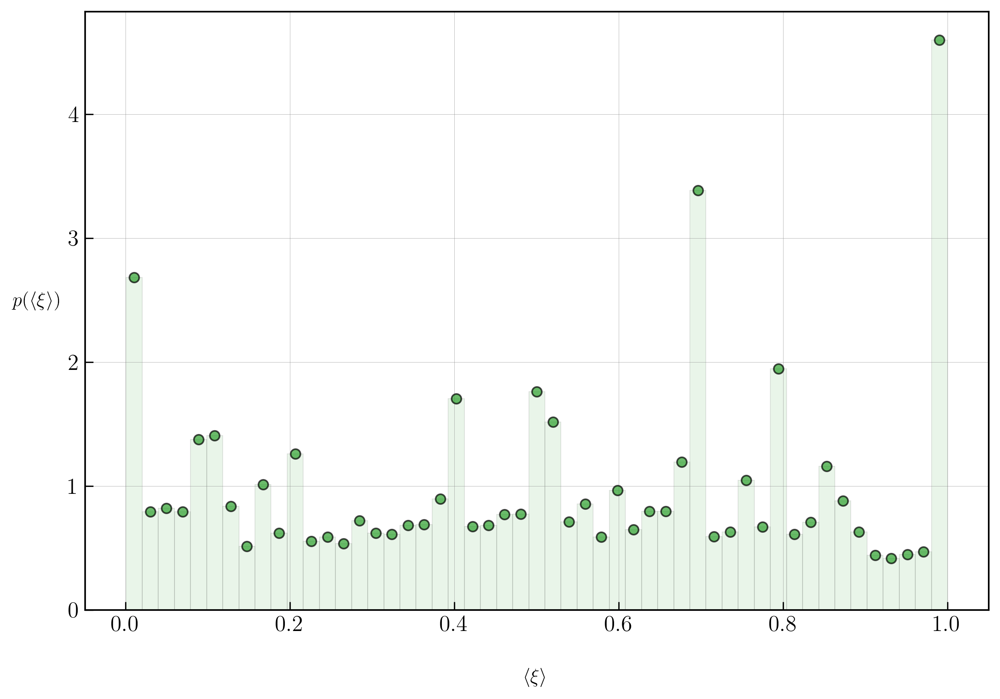

In [92]:
# plot_distribution(tx.groupby('source').frac_out.mean())
# data = tx.groupby('source').frac_out.mean()
data = agents.mean_frac_out

xlabel = r'$\langle \xi \rangle$'
ylabel = r'$p(\langle \xi \rangle)$'

fig,ax=plt.subplots()
plt.hist(data,edgecolor='k',alpha = 0.1,color='tab:green', bins=51,density = True, linewidth=0.5,align='mid')
# plt.hist(data2,edgecolor='k',alpha = 0.5,color='tab:red', bins=51,density = True, linewidth=0.5)

plot_distribution(data,ax=ax,color='tab:green',markeredgecolor='k',alpha = 0.7, linestyle='', marker='o',log_bin=False,log_scale=False,n_bins=51)
plt.xlabel(xlabel,rotation=0,labelpad=20)
plt.ylabel(ylabel,rotation=0,labelpad=20)

In [93]:
fig.savefig(f'{fig_path}/spending_shares.png')

Text(0, 0.5, '$p(\\xi)$')

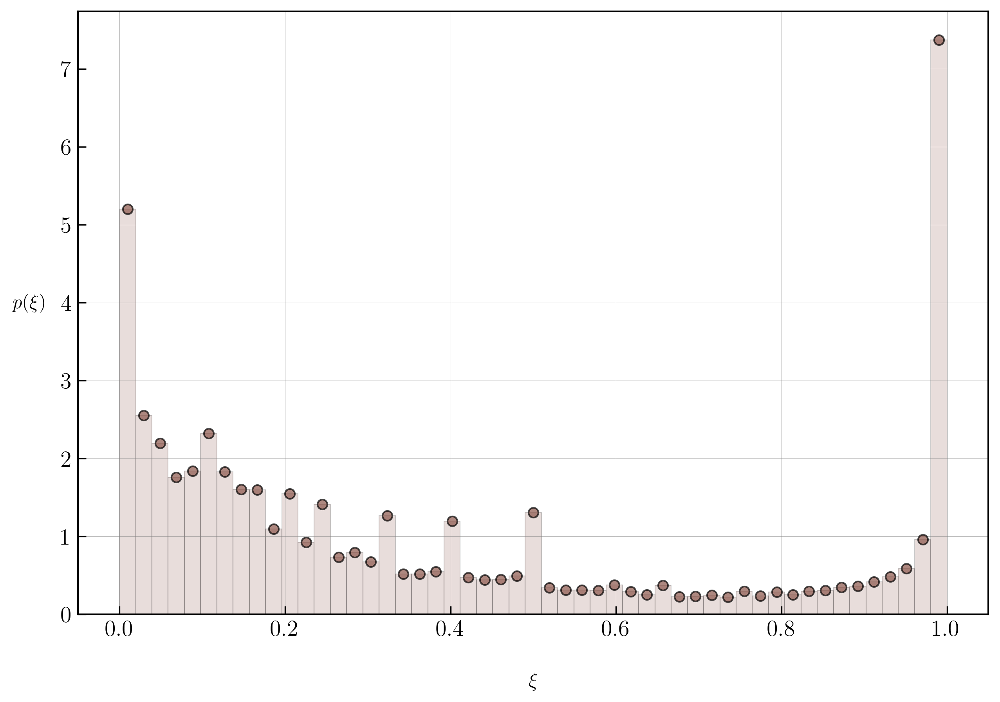

In [94]:
# plot_distribution(tx.frac_out)
bins = 51
data = tx.frac_out

fig = plt.figure()
plt.hist(data, bins=bins,edgecolor='k',color='tab:brown',density=True,alpha=0.2,linewidth=0.5,align='mid')
plot_distribution(data,ax=plt.gca(),color='tab:brown',markeredgecolor='k',alpha = 0.7, linestyle='', marker='o',log_bin=False,log_scale=False,n_bins=51)

xlabel = r'$\xi$'
ylabel = r'$p(\xi)$' 

plt.xlabel(xlabel,rotation=0,labelpad=20)
plt.ylabel(ylabel,rotation=0,labelpad=20)


# from scipy.stats import gaussian_kde

# # Generate synthetic data (replace with real data)
# data = tx.frac_out.values

# # Apply Kernel Density Estimation
# kde = gaussian_kde(data, bw_method='scott')  # 'scott' or 'silverman' for automatic bandwidth
# x = np.linspace(min(data), max(data), 1000)
# kde_pdf = kde(x,)

# # Plot KDE
# plt.plot(x, kde_pdf, label="KDE Smoothed Density", color='blue')

# from scipy.stats import beta
# data = data[(data > 0) & (data < 1)]  # Remove exact 0s and 1s

# # OR, apply a small shift to keep all values valid
# epsilon = 1e-6
# data = np.clip(data, epsilon, 1 - epsilon)  # Push values slightly inside (0,1)

# # Fit Beta Distribution to Data
# a_fit, b_fit, loc, scale = beta.fit(data, floc=0, fscale=1)  # Force fitting to [0,1] range

# # Generate Beta PDF for visualization
# x_beta = np.linspace(0, 1, 1000)
# beta_pdf = beta.pdf(x_beta, a_fit, b_fit)

# Plot Beta Fit
# plt.plot(x_beta, beta_pdf, label=f"Beta Fit (a={a_fit:.2f}, b={b_fit:.2f})", color='red')



In [95]:
fig.savefig(f'{fig_path}/spending_spectrum.png')

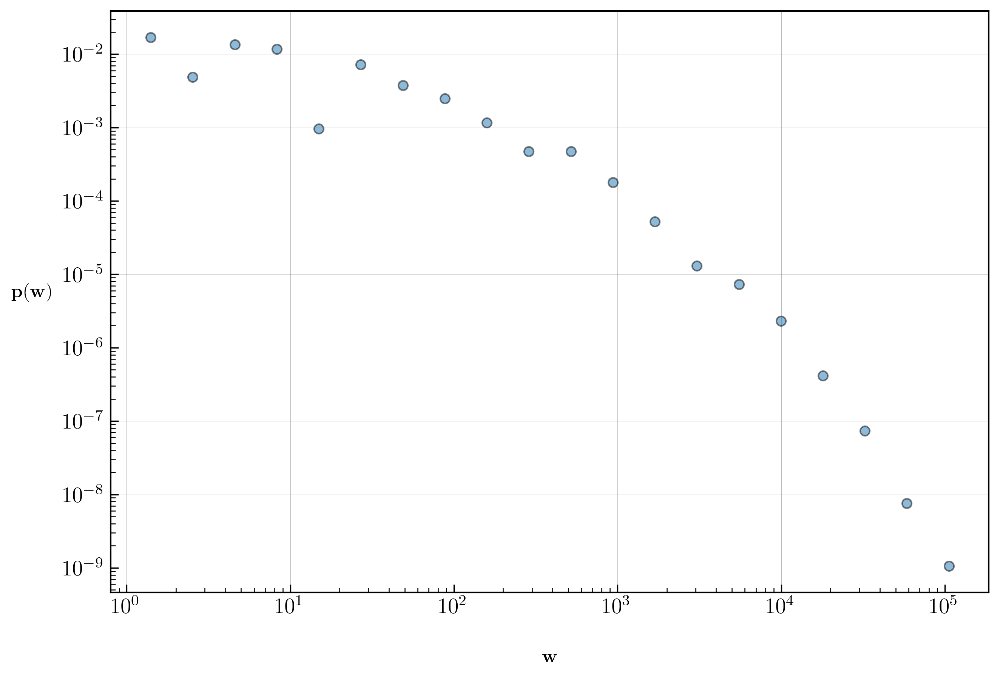

In [96]:
fig = plt.figure()
plot_distribution(tx.weight,marker = 'o',linestyle='',markeredgecolor='k',alpha=0.5,ax=plt.gca())
plt.xlabel(r'$\mathbf{w}$',rotation=0,labelpad=20)
plt.ylabel(r'$\mathbf{p(w)}$',rotation=0,labelpad=20)

fig.savefig(f'{fig_path}/weight.png')

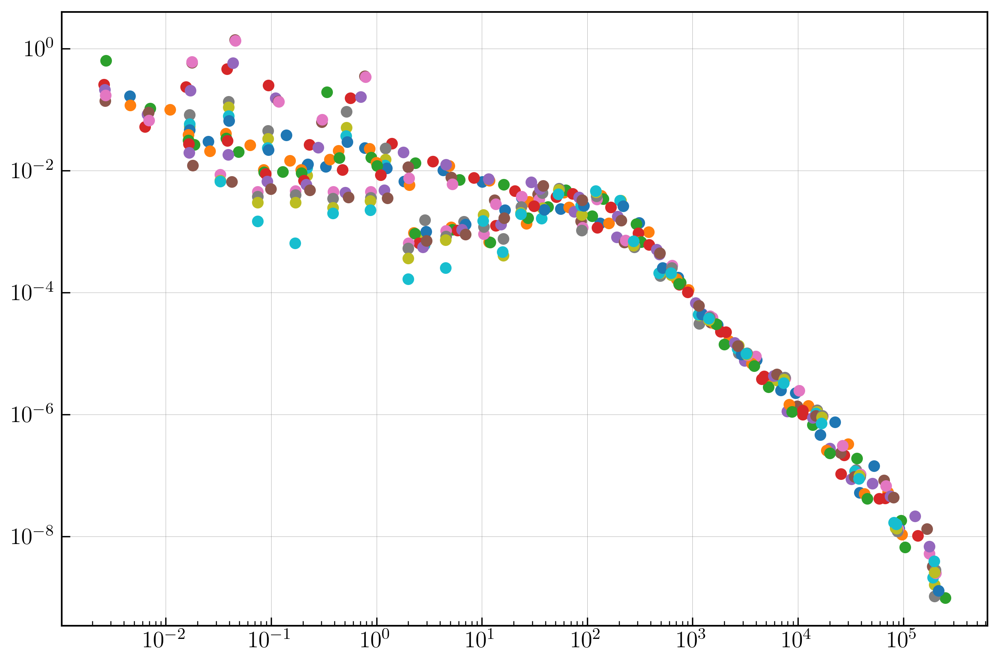

In [97]:
plt.figure()
for i in range(bal_pivot.shape[1]):
    plot_distribution(bal_pivot.iloc[:,i],ax=plt.gca(),marker='o',linestyle='')

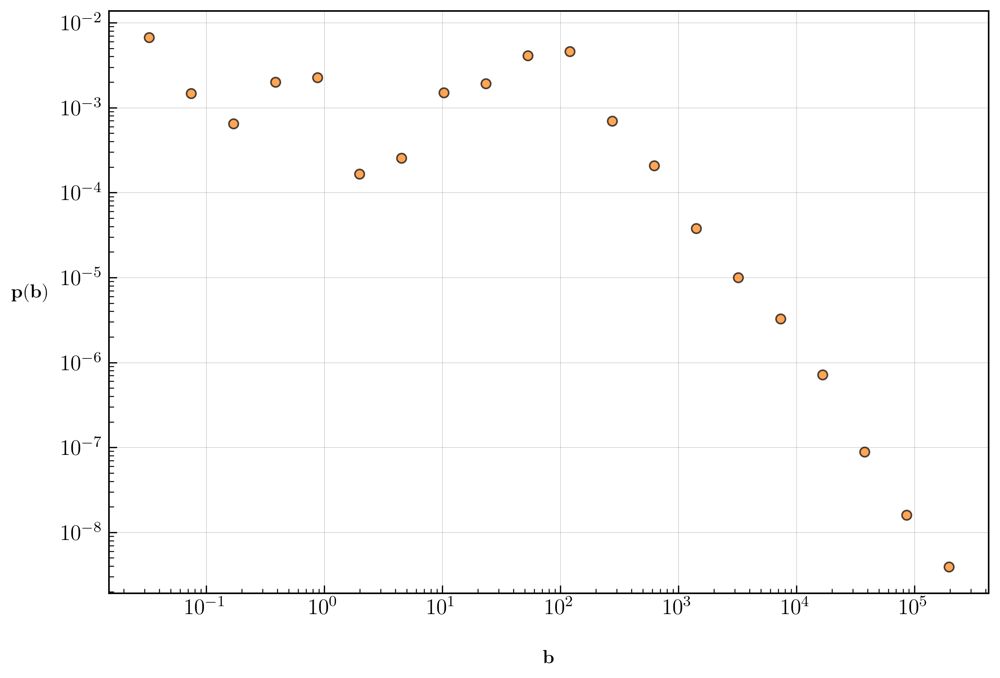

In [98]:
fig = plt.figure()

line1 = plot_distribution(bal_pivot.iloc[:,-1],ax=plt.gca(),marker='o',markeredgecolor='k',linestyle='',alpha = 0.7,color='tab:orange')
plt.xlabel(r'$\mathbf{b}$',rotation=0,labelpad=20)
plt.ylabel(r'$\mathbf{p(b)}$',rotation=0,labelpad=20)

fig.savefig(f'{fig_path}/final_bal.png')


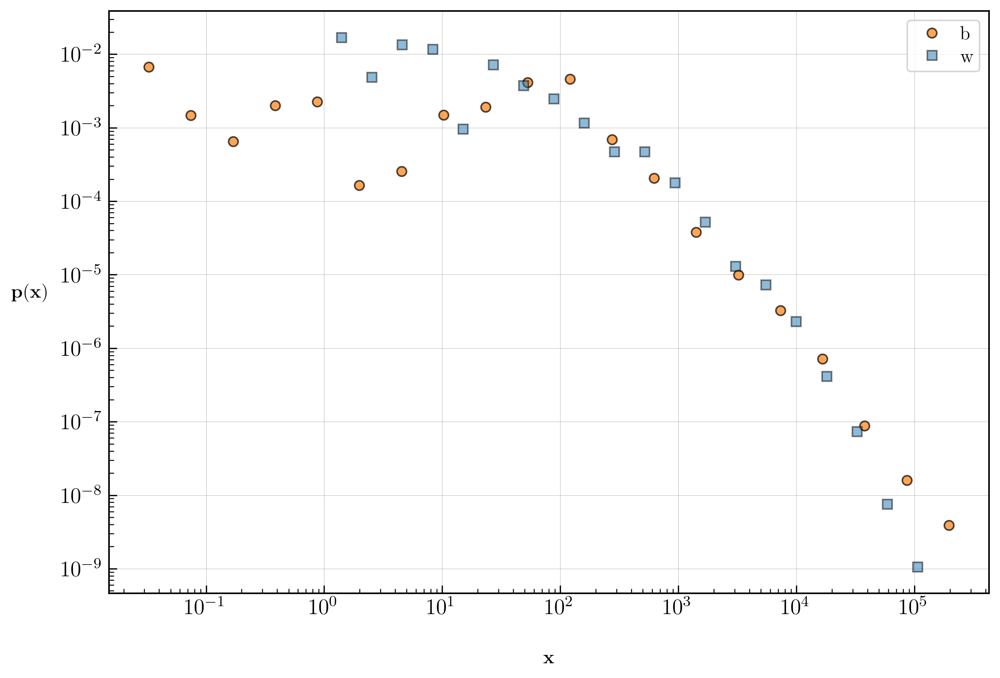

In [100]:
fig = plt.figure()
plot_distribution(bal_pivot.iloc[:,-1],ax=plt.gca(),marker='o',markeredgecolor='k',linestyle='',alpha = 0.7,color='tab:orange',label='b')
plot_distribution(tx.weight,marker = 's',linestyle='',markeredgecolor='k',alpha=0.5,ax=plt.gca(),label='w')
plt.xlabel(r'$\mathbf{x}$',rotation=0,labelpad=20)
plt.ylabel(r'$\mathbf{p(x)}$',rotation=0,labelpad=20)

fig.savefig(f'{fig_path}/weightandbalance.png')

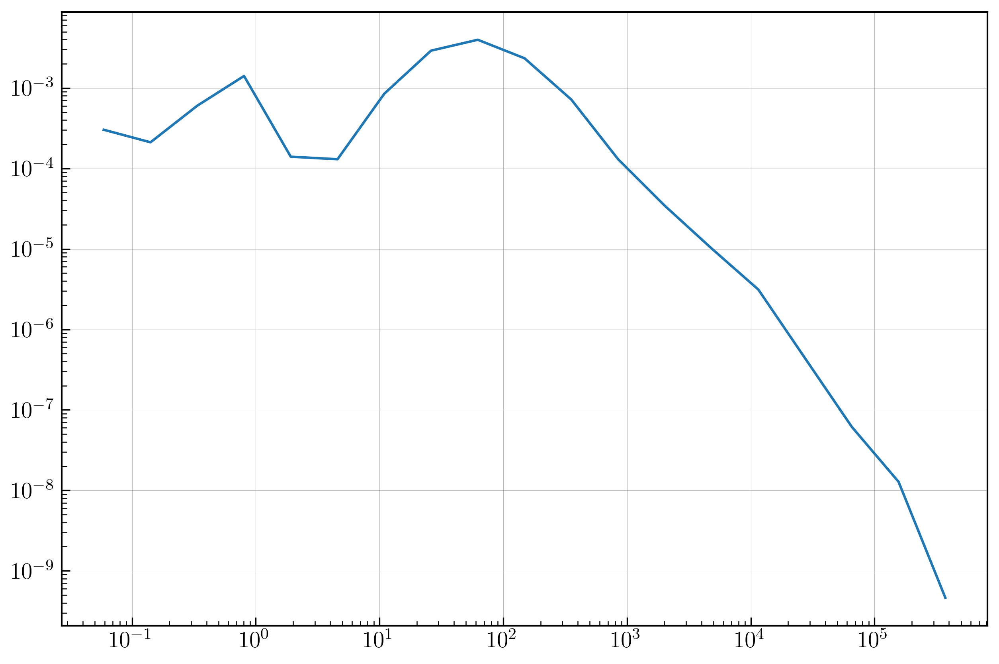

In [101]:
#Initial balance distribution

data = TXDF.loc[(TXDF.type == 'DISBURSEMENT') & (TXDF.target.isin(filtered_crid))].groupby('date').first().target_bal_post

plot_distribution(data)

In [ ]:
all_balances_pre = balance_constructor(TXDF[['date','source','target','source_bal_post','target_bal_post','type','id']])

all_balances_pre['period'] = pd.cut(all_balances.date, bins=20,labels=False) #period by date

In [ ]:
fig = plt.figure()
plot_distribution(data:=all_balances_pre[(all_balances_pre.type=='STANDARD')&(all_balances.crid.isin(filtered_crid))].groupby('crid').first().balance)
fig.savefig(f'{folder_path}/initial_balances.png')

In [ ]:
data.min()

In [ ]:
# fig,ax = plt.subplots(2,2)
# ax = ax.ravel()
colors = ['r','g','b','orange']
for i,typo in enumerate(TXDF.type.unique()):
    fig = plt.figure()
    plt.plot(TXDF[TXDF.type == typo].resample('W',on='date').weight.count(),color=colors[i],label = typo.replace('_', ' ').title())
    # plot.plot(TXDF[TXDF.type == typo].resample('W',on='date').weight.cumsum(),color=colors[i])
    plt.xticks(rotation=45)
    plt.legend()
    plt.close()
    fig.savefig(f'{fig_path}/txtype_{typo}.png')

plt.tight_layout()

In [ ]:
data = agents[['activity','mean_frac_out']].values

fig,ax=plt.subplots()
xlabel = r'$N^{out}$'
ylabel = r'$\langle \xi \rangle$'

plot_scatter_kde(data,ax,cmap='RdBu_r')
plt.loglog()
plt.xlabel(xlabel)
plt.ylabel(ylabel,rotation=0)


In [ ]:
agents[agents.mean_frac_in == np.inf]

In [ ]:
data = agents[['attractiveness','mean_frac_in']].dropna()
data = data[data.mean_frac_in != np.inf].values

fig,ax=plt.subplots()
xlabel = r'$N^{in}$'
ylabel = r'$Mean earning share$'

plot_scatter_kde(data,ax,cmap='RdBu_r')
plt.loglog()
plt.xlabel(xlabel.title())
plt.ylabel(ylabel.title())


In [ ]:
users.initial_bal.hist(bins=20)
plt.semilogy(True)

In [ ]:
agents.activity.min()

In [ ]:
# data = agents[['activity','final_bal']]
# data = data[data.final_bal>0.1]
# xlabel = 'activity'
# ylabel = 'final bal'
# fig,ax=plt.subplots()

# plot_scatter_kde(data.values,ax,cmap='RdBu_r')
# plt.loglog()
# plt.xlabel(xlabel.title())
# plt.ylabel(ylabel.title())

In [ ]:
tx = TXDF.copy(deep=True)

# Filter transactions to keep only those involving the filtered_crid accounts
tx = tx[tx.source.isin(filtered_crid) & tx.target.isin(filtered_crid)]

# Get the first transaction for each account as a source
source_first = tx.groupby('source')[['date', 'source_bal_pre']].first().rename(columns={'source_bal_pre': 'initial_balance'})

# Get the first transaction for each account as a target
target_first = tx.groupby('target')[['date', 'target_bal_pre']].first().rename(columns={'target_bal_pre': 'initial_balance'})

# Merge the two, keeping the earlier transaction date for each account
firsts = pd.concat([source_first, target_first]).reset_index()
firsts = firsts.loc[firsts.groupby('index')['date'].idxmin()].rename(columns={'index': 'account'})

# The "initial_balance" column now contains the inferred initial balance for each account


In [ ]:
fig,ax=plt.subplots(1,2)
plot_distribution(firsts.initial_balance,ax=ax[0],marker='o',linestyle='')
ax[0].set_xscale('linear')

plot_distribution(firsts.initial_balance,ax=ax[1],marker='o',linestyle='',log_bin=False)
ax[1].set_yscale('log')


In [ ]:
fig,ax=plt.subplots()
A = tx.groupby('source').agg({'weight':'count','source_bal_post': 'mean'}).values.T
B = np.array([scale_vect(A[0]),scale_vect(A[1])])
plot_scatter_kde(B.T,ax)

plt.loglog()
plt.xlabel('Activity')
plt.ylabel('Average Balance')

In [ ]:
firsts.initial_balance.hist()
plt.semilogy(True)

In [ ]:
bal_stats = pd.DataFrame({
    "mean": bal_pivot.mean(axis=1),
    "std": bal_pivot.std(axis=1)
})


fig,ax=plt.subplots()
# plt.scatter(mean_balances,std_balances)
plot_scatter_kde(bal_stats.dropna().values,ax)
plt.xlabel('Mean Balance')
plt.ylabel('Standard Deviation')
plt.loglog()

In [ ]:
merged_bal_act = pd.merge(bal_stats,agents[['crid','activity']],on='crid')

fig,ax=plt.subplots()
# plt.scatter(mean_balances,std_balances)
plot_scatter_kde(merged_bal_act[['activity','mean']].dropna().values,ax)
plt.ylabel('Mean Balance')
plt.xlabel('Activity')
plt.loglog()

In [ ]:
tx['date'] = pd.to_datetime(tx['date'])  # Ensure 'date' is datetime

# Define a function to apply resampling per group
def resample_balance(group):
    return group.resample('ME', on='date')['source_bal_post'].mean()

# Apply groupby and resample separately
monthly_avg_balance = (
    tx.groupby('source', group_keys=False)
    .apply(resample_balance)
    .reset_index()
)


# print(monthly_avg_balance)


In [ ]:
# Plot histogram for each month
months = monthly_avg_balance['date'].dt.to_period('M').unique()
framelist = []

x_min = monthly_avg_balance['source_bal_post'].min()
x_max = monthly_avg_balance['source_bal_post'].max()
y_max = 0
y_max = 1e4  # Will be updated dynamically

for month in months:
    subset = monthly_avg_balance[monthly_avg_balance['date'].dt.to_period('M') == month]

    plt.figure(figsize=(8, 5))
    plt.hist(subset['source_bal_post'], bins=20, alpha=0.7, edgecolor='black')
    plt.title(f"Histogram of Average Balances - {month}")
    plt.xlabel("Average Balance")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.semilogy(True)
    plt.xlim(x_min,x_max)
    plt.ylim(0, y_max)
    framelist.append(plt.gcf())
    # plt.show()
    plt.close()

make_gif_from_figures(framelist,'./average_balances_hist.gif')


In [ ]:
# Plot histogram for each month
months = monthly_avg_balance['date'].dt.to_period('M').unique()
framelist = []

x_min = monthly_avg_balance['source_bal_post'].min()
x_max = monthly_avg_balance['source_bal_post'].max()
y_min = 0
y_max = 1e4  # Will be updated dynamically

for month in months:
    subset = monthly_avg_balance[monthly_avg_balance['date'].dt.to_period('M') == month]

    fig,ax = plt.subplots(figsize=(8, 5))  # Get current axis

    # Use plot_distribution but force limits afterward
    # plot_distribution(subset['source_bal_post'], ax=ax, marker='*', linestyle='',log_bin=False,log_scale=False)
    plot_distribution(subset['source_bal_post'],ax=ax,marker='o',linestyle='',density=False)
    # ax.set_xscale('linear')

    # plot_distribution(subset['source_bal_post'],ax=ax,marker='o',linestyle='',log_bin=False,density=False)
    # ax.set_yscale('log')

    # Ensure fixed grid, axes, and scale after plotting
    ax.set_title(f"Histogram of Average Balances - {month}")
    ax.set_xlabel("Average Balance")
    ax.set_ylabel("Frequency")
    ax.set_xlim(1e-3, x_max)  # Force x-axis limits
    ax.set_ylim(y_min, y_max)  # Force y-axis limits
    # ax.set_yscale('log')  # Force log scale
    ax.grid(True, which="both", linestyle="--", linewidth=0.5)  # Fixed grid

    framelist.append(fig)  # Save the figure
    plt.close()  # Close the plot to prevent overlapping


make_gif_from_figures(framelist,'./average_balances_dist.gif')


In [ ]:
string = 'mario_anti_orario'

string.replace('_', ' ').title()

In [ ]:
import numpy as np
import scipy
import plotly.graph_objects as go
import plotly.io as pio

# Set Plotly renderer for Jupyter Notebook
pio.renderers.default = 'notebook'

# Define parameters
lambdas = np.logspace(-2,2,5)
taus = np.logspace(-2,2,5)
n = np.arange(50)

# Define Poisson probability function
p = lambda N, t, l: np.exp(-l * t) * (l * t) ** N / scipy.special.factorial(N)

# Create figure


# Loop through taus and lambdas to add traces


for tau in taus:
    fig = go.Figure()
    for lambd in lambdas:
        fig.add_trace(go.Scatter(
            x=n,
            y=p(n, tau, lambd),
            mode='markers',
            name=f'τ={tau}, λ={lambd}'
        ))

    # Update layout
    fig.update_layout(
        title="Poisson Distribution Visualization",
        xaxis_title="n",
        yaxis_title="P(n | τ, λ)",
        template="plotly_dark"
    )

    # Show figure
    fig.show()


In [ ]:

# Example Usage (Replace with actual empirical and copula-sampled data)
np.random.seed(42)
n_samples = 1000

# Generate empirical rank-transformed data (U, V) (e.g., from observed data)
empirical_data = np.random.uniform(0, 1, (n_samples, 2))

# Generate copula samples (e.g., from a Gaussian copula)
copula_samples = np.random.uniform(0, 1, (n_samples, 2))  # Replace with real copula samples

# Compute KS distance
ks_results = copula_ks_test(empirical_data, copula_samples)

print(f"KS Statistic for U: {ks_results[0][0]}, p-value: {ks_results[0][1]}")
print(f"KS Statistic for V: {ks_results[1][0]}, p-value: {ks_results[1][1]}")


In [ ]:


# Example usage
# np.random.seed(42)
n_samples = 10000

# Simulated empirical copula samples (U, V)
# empirical_data = np.random.uniform(0, 1, (n_samples, 2))
empirical_data = jittered_ranks.values

# Simulated copula-generated samples
# copula_samples = np.random.uniform(0, 1, (n_samples, 2))  # Replace with actual copula samples
copula_samples = np.column_stack((u, v))
# Compute KS distance
ks_U, ks_V = ks_distance(empirical_data, copula_samples)
print(f"KS Distance for U: {ks_U}")
print(f"KS Distance for V: {ks_V}")


In [ ]:
ks_U, ks_V = ks_distance(np.column_stack((lam,mu)),agents[['activity', 'attractiveness']].values)
print(f"KS Distance for U: {ks_U}")
print(f"KS Distance for V: {ks_V}")

In [ ]:


# Example usage
def main(X=np.random.normal(loc=[0, 0], scale=[1, 1], size=(1000, 2)),Y=np.random.normal(loc=[0, 0], scale=[1, 1], size=(1000, 2))):
    # np.random.seed(42)
    
    print("Wasserstein Distance:", compute_wasserstein(X, Y))
    print("Energy Distance:", compute_energy(X, Y))
    # print("MMD:", compute_mmd(X, Y))
    print("KL Divergence:", compute_kl_divergence(X, Y))
    print("JS Divergence:", compute_js_divergence(X, Y))

    print("Kolmogorov-Smirnov Distance:", compute_ks_distance(X, Y))
    print("Cramér-von Mises Distance:", compute_cramer_von_mises(X, Y))


# if __name__ == "__main__":
#     main()


In [ ]:
samples = pd.DataFrame(samples)

cop = pd.DataFrame({'u':u,'v':v})

In [ ]:
pairs = [(agents[['activity', 'attractiveness']].values,samples[['activity', 'attractiveness']].values),
 (agents[['activity', 'attractiveness']].rank(pct=True).values,cop[['u','v']].values)]
    

for pair in pairs:
    x,y = pair
    main(x,y)
    print('-----')


In [ ]:
for pair in pairs:
    x,y = pair
    print(x,y)

In [ ]:
bal_pre,bal_post = balance_constructor(tx,USERS.copy(deep=True))
bal_df = bal_post.loc[(~bal_post.role.isin(['ADMIN','TOKEN_AGENT']))]
bal_df = bal_df[bal_df.crid.isin(filtered_crid)]
bal_pivot = pd.pivot_table(bal_df, index='crid',columns='period', values='balance', aggfunc='last')
# bal_pivot = bal_pivot.bfill(axis=1)
bal_pivot

In [ ]:


compute_sequential_js(bal_pivot)

In [ ]:
import numpy as np
from scipy.spatial.distance import jensenshannon

# Generate random normal samples
x = np.random.normal(0, 1, 100000)
y = np.random.normal(0, 1, 100000)



# Convert samples into histograms (probability distributions)
bins = 100  # Adjust bin count as needed
p_x, _ = np.histogram(x, bins=bins, density=True)
p_y, _ = np.histogram(y, bins=bins, density=True)

# Compute Jensen-Shannon divergence
js_distance = jensenshannon(p_x, p_y)
print("Jensen-Shannon Distance:", js_distance)
from scipy.stats import gaussian_kde

# Estimate PDFs using Kernel Density Estimation
kde_x = gaussian_kde(x)
kde_y = gaussian_kde(y)

# Evaluate PDFs at common points
grid = np.linspace(min(x.min(), y.min()), max(x.max(), y.max()), 1000)
p_x = kde_x(grid)
p_y = kde_y(grid)

# Compute Jensen-Shannon divergence
js_distance = jensenshannon(p_x, p_y)
print("Jensen-Shannon Distance:", js_distance)


In [ ]:
print(bal_pivot.iloc[:, 1:].describe())


In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
normalized_data = pd.DataFrame(scaler.fit_transform(bal_pivot.iloc[:, 1:]), columns=bal_pivot.columns[1:])


In [ ]:
compute_sequential_js(normalized_data)

In [ ]:
# Create an empty list to collect sarafu 'iet' values
sarafu_iet = []

# Loop through groups and calculate 'iet' for each group
for idx, (key, group) in enumerate(tx.groupby('source')):
    group['iet'] = group['date'].diff().dt.total_seconds()
    group = group.dropna(subset=['iet'])  # Drop NaN values
    sarafu_iet.extend(group['iet'])  # Append 'iet' values to the list
    sarafu_iet_days = np.array(sarafu_iet) /  (60 *60* 24)


In [ ]:
# Create an empty list to collect sarafu 'iet' values
sarafu_iet = []

# Loop through groups and calculate 'iet' for each group
for idx, (key, group) in enumerate(tx.groupby('source')):
    group['iet'] = group['date'].diff().dt.total_seconds()
    group['iet'] = group['iet'].fillna((group['date'] - START).dt.total_seconds())

    agents.loc[agents.crid == key, 'mean_iet'] = group.iet.mean()
    # plot_distribution(group['iet'], bins=30, markeredgecolor='black',ax=plt.gca())
      # Fill NaN values with time elapsed from START
    # sarafu_iet.extend(group['iet'])  # Append 'iet' values to the list

# sarafu_iet_days = np.array(sarafu_iet) / (60 * 60 * 24)


In [ ]:
plot_distribution(agents.mean_iet/ (60 * 60 * 24),log_bin=False,log_scale=False)

In [ ]:
total_time = (END-START).total_seconds()/(60*60*24) #days

total_transactions = tx.weight.count() #txns

average_waiting_time_global = total_time/total_transactions #days/txns

print(f'on average: \n 1 txns each {average_waiting_time_global *24*60} minutes \n {1/(average_waiting_time_global*24)} txns each hour')


In [ ]:
agents['activity_potential'] = agents['tx_out']/total_transactions
agents['attractiveness_potential'] = agents['tx_in']/total_transactions




In [ ]:
(agents.mean_iet/ (60 * 60 * 24)).describe()

In [ ]:
# Plot the histogram of the aggregated 'iet' values
plot_distribution(sarafu_iet_days, bins=30, markeredgecolor='black',ax=plt.gca())  # Adjust the number of bins as needed
plt.xlabel('Inter-Event Time (days)')
plt.ylabel('Frequency')
# plt.title('Distribution of Inter-Event Times (IET)')
plt.show()


In [ ]:
# rnd_guy = agents.sample(1)

In [ ]:
rnd_guy=agents.loc[agents.crid == 15344]

In [ ]:
rnd_guy = agents.sample(1)
rnd_guy_bal = filtered_balances.loc[filtered_balances.crid == rnd_guy.crid.iloc[0]]
plt.figure()
rnd_guy_bal.plot(x='date',y='balance',kind='bar')
plt.semilogy()

In [ ]:
TXDF.loc[(TXDF.type == 'DISBURSEMENT') & (TXDF.target.isin(filtered_crid))].groupby('date').first().target_bal_post

In [35]:
import numpy as np
import scipy.stats as stats

def tail_dependence_coefficient(X, Y, q=0.95):
    """
    Estimate the upper and lower tail dependence coefficients.
    
    Parameters:
    X, Y : array-like
        Input data vectors (must be same length).
    q : float
        Quantile threshold (default: 0.95 for upper tail).
    
    Returns:
    lambda_L : float
        Lower tail dependence coefficient.
    lambda_U : float
        Upper tail dependence coefficient.
    """
    # Transform data to uniform [0,1] using empirical CDF
    U = stats.rankdata(X) / (len(X) + 1)
    V = stats.rankdata(Y) / (len(Y) + 1)
    
    # Upper tail dependence
    lambda_U = np.sum((U > q) & (V > q)) / np.sum(U > q)
    
    # Lower tail dependence (replace q with 1-q)
    lambda_L = np.sum((U < 1-q) & (V < 1-q)) / np.sum(U < 1-q)

    return lambda_L, lambda_U

# Example Usage
np.random.seed(42)
X = np.random.normal(0, 1, 1000)
Y = 0.8 * X + np.random.normal(0, 0.5, 1000)  # Correlated data

lambda_L, lambda_U = tail_dependence_coefficient(X, Y, q=0.95)
print(f"Lower Tail Dependence: {lambda_L:.4f}")
print(f"Upper Tail Dependence: {lambda_U:.4f}")


Lower Tail Dependence: 0.4600
Upper Tail Dependence: 0.5200


Lower Tail Dependence: 0.0700
Upper Tail Dependence: 0.8331


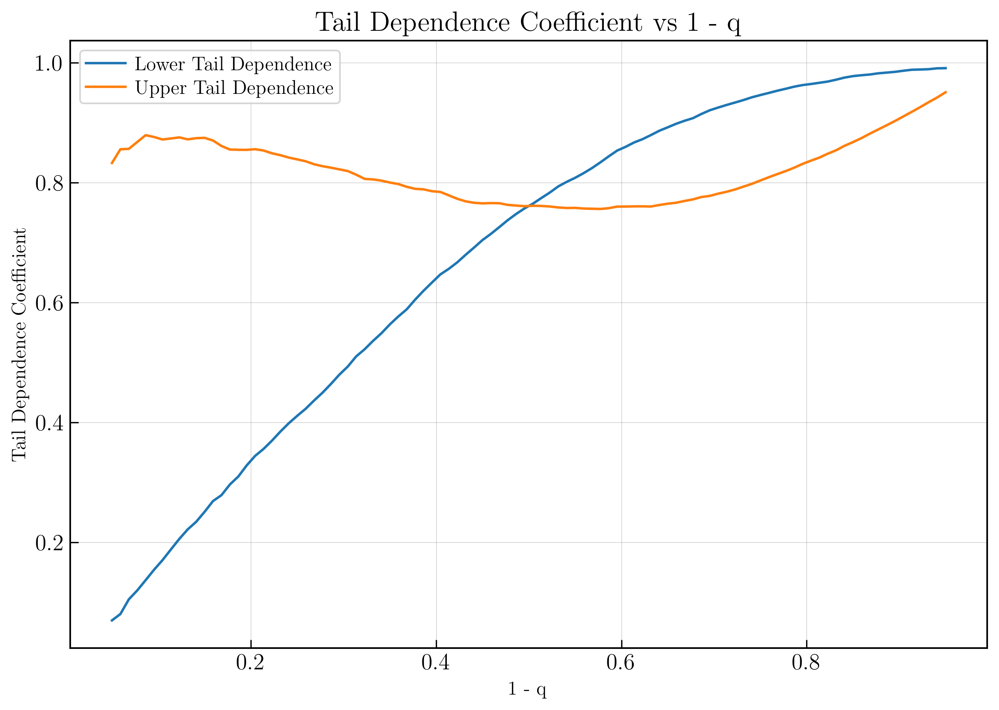

In [39]:
X = agents.activity
Y = agents.attractiveness
lambda_L, lambda_U = tail_dependence_coefficient(X, Y, q=0.95)
print(f"Lower Tail Dependence: {lambda_L:.4f}")
print(f"Upper Tail Dependence: {lambda_U:.4f}")

import numpy as np
import matplotlib.pyplot as plt

qs = np.linspace(0.05, 0.95, 100)  # Define a range of quantiles
uf = []
lf = []

for qq in qs:
    lambda_L, lambda_U = tail_dependence_coefficient(X, Y, qq)
    lf.append(lambda_L)
    uf.append(lambda_U)

# Fix the plotting issue
plt.plot(1 - qs, lf, label='Lower Tail Dependence')
plt.plot(1 - qs, uf, label='Upper Tail Dependence')

plt.xlabel("1 - q")
plt.ylabel("Tail Dependence Coefficient")
plt.legend()
plt.title("Tail Dependence Coefficient vs 1 - q")
plt.show()



In [74]:
X = samples.activity
Y = samples.attractiveness
lambda_L, lambda_U = tail_dependence_coefficient(X, Y, q=0.95)
print(f"Lower Tail Dependence: {lambda_L:.4f}")
print(f"Upper Tail Dependence: {lambda_U:.4f}")


Lower Tail Dependence: 0.1130
Upper Tail Dependence: 0.7454


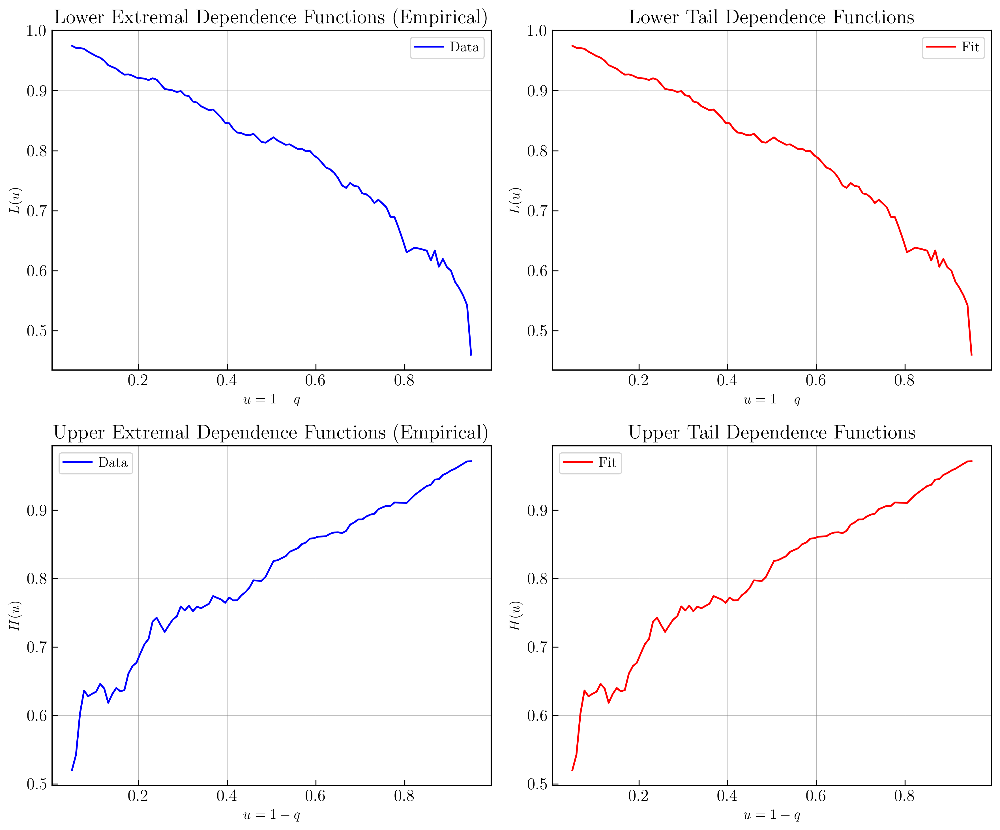

In [40]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

def tail_dependence_function(X, Y, qs):
    """
    Compute empirical lower and upper extremal dependence functions.

    Parameters:
    X, Y : array-like
        Data samples.
    qs : array-like
        List of quantiles to evaluate dependence.

    Returns:
    L_vals : list
        Lower extremal dependence function values.
    U_vals : list
        Upper extremal dependence function values.
    """
    U = stats.rankdata(X) / (len(X) + 1)
    V = stats.rankdata(Y) / (len(Y) + 1)

    L_vals, U_vals = [], []

    for q in qs:
        lower = np.sum((U < q) & (V < q)) / np.sum(U < q)
        upper = np.sum((U > q) & (V > q)) / np.sum(U > q)
        
        L_vals.append(lower)
        U_vals.append(upper)

    return np.array(L_vals), np.array(U_vals)

# Generate synthetic data similar to correlated financial series
np.random.seed(42)
X = np.random.normal(0, 1, 1000)
Y = 0.8 * X + np.random.normal(0, 0.5, 1000)  # Correlated data

# Define quantile range
qs = np.linspace(0.05, 0.95, 100)

# Compute tail dependence functions
L_vals, U_vals = tail_dependence_function(X, Y, qs)

# Plot Lower and Upper Dependence Functions
fig, ax = plt.subplots(2, 2, figsize=(12, 10))

# Lower Extremal Dependence Function
ax[0, 0].plot(1 - qs, L_vals, 'b', label='Data')
ax[0, 0].set_title("Lower Extremal Dependence Functions (Empirical)")
ax[0, 0].set_xlabel("$u = 1 - q$")
ax[0, 0].set_ylabel("$L(u)$")
ax[0, 0].legend()

# Lower Tail Dependence Function
ax[0, 1].plot(1 - qs, L_vals, 'r', label='Fit')
ax[0, 1].set_title("Lower Tail Dependence Functions")
ax[0, 1].set_xlabel("$u = 1 - q$")
ax[0, 1].set_ylabel("$L(u)$")
ax[0, 1].legend()

# Upper Extremal Dependence Function
ax[1, 0].plot(1 - qs, U_vals, 'b', label='Data')
ax[1, 0].set_title("Upper Extremal Dependence Functions (Empirical)")
ax[1, 0].set_xlabel("$u = 1 - q$")
ax[1, 0].set_ylabel("$H(u)$")
ax[1, 0].legend()

# Upper Tail Dependence Function
ax[1, 1].plot(1 - qs, U_vals, 'r', label='Fit')
ax[1, 1].set_title("Upper Tail Dependence Functions")
ax[1, 1].set_xlabel("$u = 1 - q$")
ax[1, 1].set_ylabel("$H(u)$")
ax[1, 1].legend()

plt.tight_layout()
plt.show()


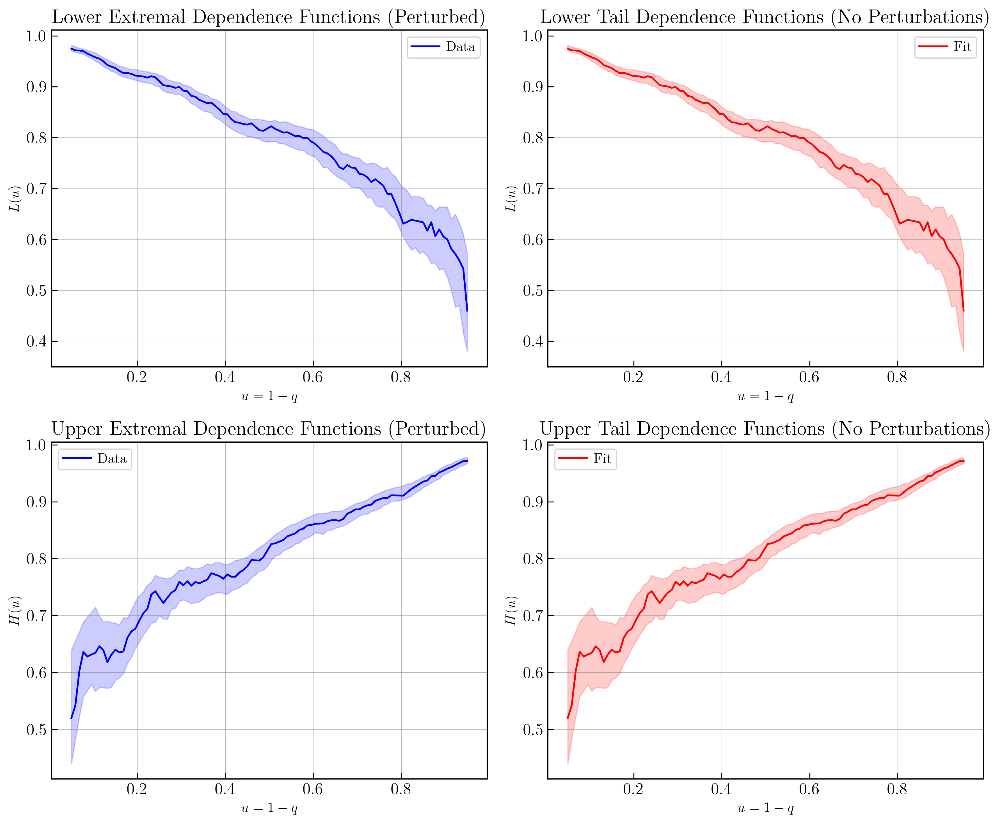

In [41]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

def bootstrap_tail_dependence(X, Y, qs, n_bootstrap=100):
    """
    Compute empirical lower and upper extremal dependence functions with confidence bands.
    
    Parameters:
    X, Y : array-like
        Data samples.
    qs : array-like
        List of quantiles to evaluate dependence.
    n_bootstrap : int
        Number of bootstrap resamples.
        
    Returns:
    L_mean, L_lower, L_upper : tuple of arrays
        Mean and confidence bands for lower tail dependence.
    U_mean, U_lower, U_upper : tuple of arrays
        Mean and confidence bands for upper tail dependence.
    """
    def tail_dependence(X, Y, qs):
        U = stats.rankdata(X) / (len(X) + 1)
        V = stats.rankdata(Y) / (len(Y) + 1)
        L_vals, U_vals = [], []
        for q in qs:
            lower = np.sum((U < q) & (V < q)) / np.sum(U < q)
            upper = np.sum((U > q) & (V > q)) / np.sum(U > q)
            L_vals.append(lower)
            U_vals.append(upper)
        return np.array(L_vals), np.array(U_vals)

    # Compute original estimates
    L_vals, U_vals = tail_dependence(X, Y, qs)

    # Bootstrap confidence intervals
    L_bootstrap, U_bootstrap = [], []
    n = len(X)
    for _ in range(n_bootstrap):
        idx = np.random.choice(np.arange(n), size=n, replace=True)  # Resample
        L_resample, U_resample = tail_dependence(X[idx], Y[idx], qs)
        L_bootstrap.append(L_resample)
        U_bootstrap.append(U_resample)

    # Convert to arrays
    L_bootstrap = np.array(L_bootstrap)
    U_bootstrap = np.array(U_bootstrap)

    # Compute confidence bands (5th and 95th percentiles)
    L_lower, L_upper = np.percentile(L_bootstrap, [5, 95], axis=0)
    U_lower, U_upper = np.percentile(U_bootstrap, [5, 95], axis=0)

    return L_vals, L_lower, L_upper, U_vals, U_lower, U_upper

# Generate synthetic correlated data
np.random.seed(42)
X = np.random.normal(0, 1, 1000)
Y = 0.8 * X + np.random.normal(0, 0.5, 1000)  # Correlated data

# Define quantile range
qs = np.linspace(0.05, 0.95, 100)

# Compute tail dependence functions with confidence bands
L_vals, L_lower, L_upper, U_vals, U_lower, U_upper = bootstrap_tail_dependence(X, Y, qs)

# Plot Lower and Upper Dependence Functions with Confidence Bands
fig, ax = plt.subplots(2, 2, figsize=(12, 10))

# Lower Extremal Dependence Function
ax[0, 0].plot(1 - qs, L_vals, 'b', label='Data')
ax[0, 0].fill_between(1 - qs, L_lower, L_upper, color='b', alpha=0.2)
ax[0, 0].set_title("Lower Extremal Dependence Functions (Perturbed)")
ax[0, 0].set_xlabel("$u = 1 - q$")
ax[0, 0].set_ylabel("$L(u)$")
ax[0, 0].legend()

# Lower Tail Dependence Function
ax[0, 1].plot(1 - qs, L_vals, 'r', label='Fit')
ax[0, 1].fill_between(1 - qs, L_lower, L_upper, color='r', alpha=0.2)
ax[0, 1].set_title("Lower Tail Dependence Functions (No Perturbations)")
ax[0, 1].set_xlabel("$u = 1 - q$")
ax[0, 1].set_ylabel("$L(u)$")
ax[0, 1].legend()

# Upper Extremal Dependence Function
ax[1, 0].plot(1 - qs, U_vals, 'b', label='Data')
ax[1, 0].fill_between(1 - qs, U_lower, U_upper, color='b', alpha=0.2)
ax[1, 0].set_title("Upper Extremal Dependence Functions (Perturbed)")
ax[1, 0].set_xlabel("$u = 1 - q$")
ax[1, 0].set_ylabel("$H(u)$")
ax[1, 0].legend()

# Upper Tail Dependence Function
ax[1, 1].plot(1 - qs, U_vals, 'r', label='Fit')
ax[1, 1].fill_between(1 - qs, U_lower, U_upper, color='r', alpha=0.2)
ax[1, 1].set_title("Upper Tail Dependence Functions (No Perturbations)")
ax[1, 1].set_xlabel("$u = 1 - q$")
ax[1, 1].set_ylabel("$H(u)$")
ax[1, 1].legend()

plt.tight_layout()
plt.show()


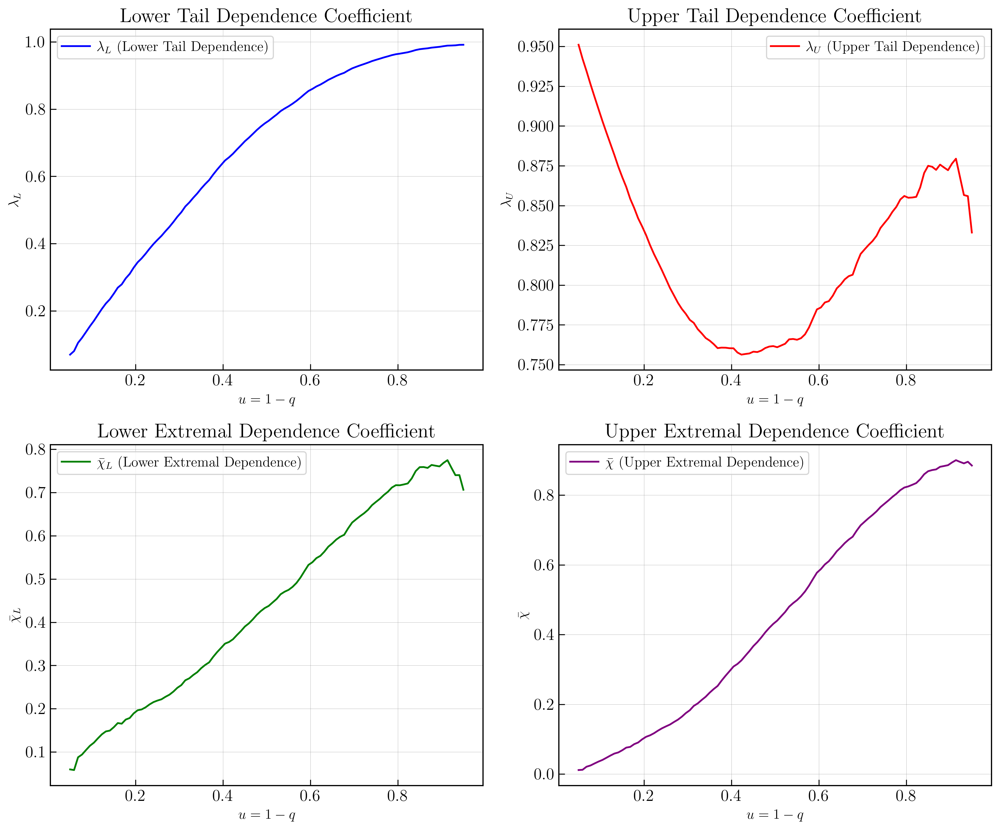

In [44]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

def compute_dependence_measures(X, Y, qs):
    """
    Compute empirical estimates of:
    - Lower/Upper Tail Dependence Coefficients (λ_L, λ_U)
    - Lower/Upper Extremal Dependence Coefficients (χ̄_L, χ̄)
    
    Parameters:
    X, Y : array-like
        Data samples.
    qs : array-like
        List of quantiles to evaluate dependence.

    Returns:
    L_vals, U_vals, chi_L_vals, chi_vals : tuple of arrays
        Estimated values for λ_L, λ_U, χ̄_L, and χ̄.
    """
    U = stats.rankdata(X) / (len(X) + 1)
    V = stats.rankdata(Y) / (len(Y) + 1)

    L_vals, U_vals, chi_L_vals, chi_vals = [], [], [], []

    for q in qs:
        # Lower and Upper Tail Dependence (λ_L, λ_U)
        lambda_L = np.sum((U < q) & (V < q)) / np.sum(U < q)
        lambda_U = np.sum((U > q) & (V > q)) / np.sum(U > q)
        
        # Lower and Upper Extremal Dependence (χ̄_L, χ̄)
        prob_joint_lower = np.sum((U < q) & (V < q)) / len(U)
        prob_joint_upper = np.sum((U > q) & (V > q)) / len(U)
        
        prob_marginal_lower = np.mean(U < q) * np.mean(V < q)
        prob_marginal_upper = np.mean(U > q) * np.mean(V > q)

        chi_L = (np.log(prob_marginal_lower) / np.log(prob_joint_lower)) - 1 if prob_joint_lower > 0 else np.nan
        chi = (2 * np.log(1 - q) / np.log(prob_joint_upper)) - 1 if prob_joint_upper > 0 else np.nan
        
        L_vals.append(lambda_L)
        U_vals.append(lambda_U)
        chi_L_vals.append(chi_L)
        chi_vals.append(chi)

    return np.array(L_vals), np.array(U_vals), np.array(chi_L_vals), np.array(chi_vals)

# # Generate synthetic correlated data
# np.random.seed(42)
# X = np.random.normal(0, 1, 1000)
# Y = 0.8 * X + np.random.normal(0, 0.5, 1000)  # Correlated data
X = agents.activity
Y=agents.attractiveness
# Define quantile range
qs = np.linspace(0.05, 0.95, 100)

# Compute dependence measures
L_vals, U_vals, chi_L_vals, chi_vals = compute_dependence_measures(X, Y, qs)

# Plot results
fig, ax = plt.subplots(2, 2, figsize=(12, 10))

# Lower Tail Dependence (λ_L)
ax[0, 0].plot(qs, L_vals, 'b', label=r'$\lambda_L$ (Lower Tail Dependence)')
ax[0, 0].set_title("Lower Tail Dependence Coefficient")
ax[0, 0].set_xlabel("$u = 1 - q$")
ax[0, 0].set_ylabel(r"$\lambda_L$")
ax[0, 0].legend()

# Upper Tail Dependence (λ_U)
ax[0, 1].plot(qs, U_vals, 'r', label=r'$\lambda_U$ (Upper Tail Dependence)')
ax[0, 1].set_title("Upper Tail Dependence Coefficient")
ax[0, 1].set_xlabel("$u = 1 - q$")
ax[0, 1].set_ylabel(r"$\lambda_U$")
ax[0, 1].legend()

# Lower Extremal Dependence (χ̄_L)
ax[1, 0].plot(qs, chi_L_vals, 'g', label=r'$\bar{\chi}_L$ (Lower Extremal Dependence)')
ax[1, 0].set_title("Lower Extremal Dependence Coefficient")
ax[1, 0].set_xlabel("$u = 1 - q$")
ax[1, 0].set_ylabel(r"$\bar{\chi}_L$")
ax[1, 0].legend()

# Upper Extremal Dependence (χ̄)
ax[1, 1].plot(qs, chi_vals, 'purple', label=r'$\bar{\chi}$ (Upper Extremal Dependence)')
ax[1, 1].set_title("Upper Extremal Dependence Coefficient")
ax[1, 1].set_xlabel("$u = 1 - q$")
ax[1, 1].set_ylabel(r"$\bar{\chi}$")
ax[1, 1].legend()

plt.tight_layout()
plt.show()


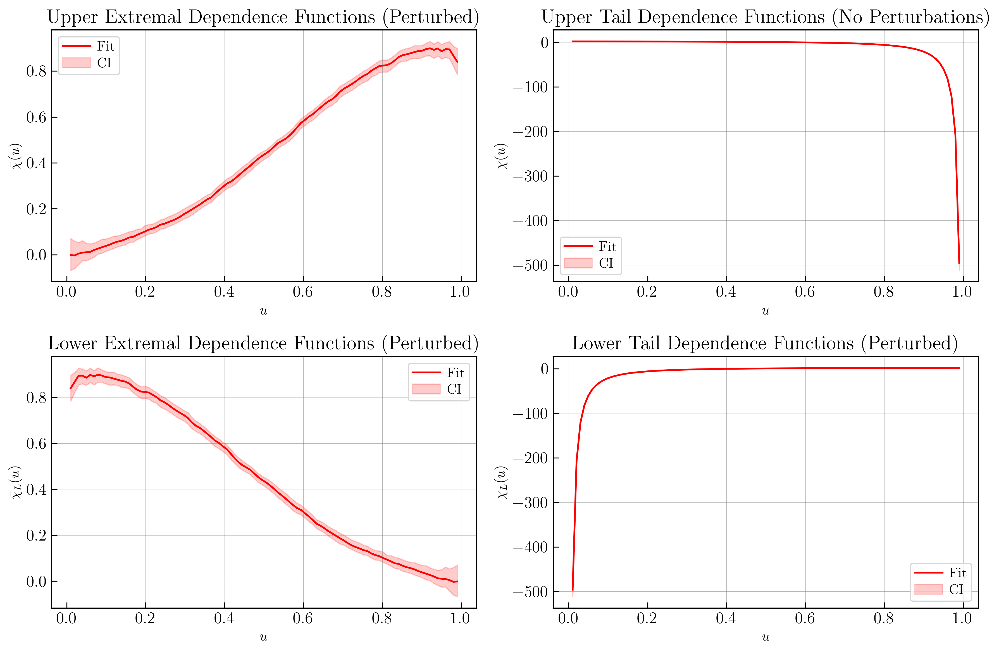

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import rankdata
from scipy.stats import norm

def to_uniform(data):
    """Convert 1D numpy array 'data' into pseudo-uniform margins."""
    
    return pd.Series(data).rank(pct=True).values

def chi_function(u, u_vals):
    """Compute chi(u) for upper/lower tail dependence"""
    joint_prob = np.mean((u_vals[:, 0] > u) & (u_vals[:, 1] > u))
    marginal_prob = np.mean(u_vals[:, 0] > u) * np.mean(u_vals[:, 1] > u)
    return 2 - np.log(joint_prob) / np.log(u) if joint_prob > 0 else 0

def chi_bar_function(u, u_vals):
    """Compute chi_bar(u) for upper/lower extremal dependence"""
    joint_prob = np.mean((u_vals[:, 0] > u) & (u_vals[:, 1] > u))
    marginal_prob = np.mean(u_vals[:, 0] > u) * np.mean(u_vals[:, 1] > u)
    return (2 * np.log(1 - u) / np.log(joint_prob)) - 1 if joint_prob > 0 else -1

def compute_dependence(u_vals, u_range):
    """Compute all four dependence functions over the domain (0,1)."""
    chi_vals = np.array([chi_function(u, u_vals) for u in u_range])
    chi_bar_vals = np.array([chi_bar_function(u, u_vals) for u in u_range])
    
    # Lower tail computations (flipping domain for lower extremes)
    chi_L_vals = np.array([chi_function(1 - u, u_vals) for u in u_range])
    chi_bar_L_vals = np.array([chi_bar_function(1 - u, u_vals) for u in u_range])

    return chi_vals, chi_bar_vals, chi_L_vals, chi_bar_L_vals

def bootstrap_confidence_intervals(u_vals, u_range, num_bootstraps=100):
    """Compute confidence intervals using bootstrap resampling."""
    n = len(u_vals)
    chi_boot, chi_bar_boot, chi_L_boot, chi_bar_L_boot = [], [], [], []

    for _ in range(num_bootstraps):
        sample_idx = np.random.choice(n, n, replace=True)
        sample = u_vals[sample_idx]
        chi, chi_bar, chi_L, chi_bar_L = compute_dependence(sample, u_range)
        chi_boot.append(chi)
        chi_bar_boot.append(chi_bar)
        chi_L_boot.append(chi_L)
        chi_bar_L_boot.append(chi_bar_L)

    # Compute 95% confidence intervals
    chi_ci = np.percentile(chi_boot, [2.5, 97.5], axis=0)
    chi_bar_ci = np.percentile(chi_bar_boot, [2.5, 97.5], axis=0)
    chi_L_ci = np.percentile(chi_L_boot, [2.5, 97.5], axis=0)
    chi_bar_L_ci = np.percentile(chi_bar_L_boot, [2.5, 97.5], axis=0)

    return chi_ci, chi_bar_ci, chi_L_ci, chi_bar_L_ci

def plot_dependence_functions(u_range, chi_vals, chi_bar_vals, chi_L_vals, chi_bar_L_vals, 
                              chi_ci, chi_bar_ci, chi_L_ci, chi_bar_L_ci):
    """Plot the four dependence functions with confidence intervals."""
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))

    # Upper Extremal Dependence Function
    axes[0, 0].plot(u_range, chi_bar_vals, label="Fit", color='red')
    axes[0, 0].fill_between(u_range, chi_bar_ci[0], chi_bar_ci[1], color='red', alpha=0.2)
    axes[0, 0].set_title("Upper Extremal Dependence Functions (Perturbed)")
    axes[0, 0].set_xlabel("$u$")
    axes[0, 0].set_ylabel("$\\bar{\\chi}(u)$")
    axes[0, 0].legend(["Fit", "CI"])

    # Lower Extremal Dependence Function
    axes[1, 0].plot(u_range, chi_bar_L_vals, label="Fit", color='red')
    axes[1, 0].fill_between(u_range, chi_bar_L_ci[0], chi_bar_L_ci[1], color='red', alpha=0.2)
    axes[1, 0].set_title("Lower Extremal Dependence Functions (Perturbed)")
    axes[1, 0].set_xlabel("$u$")
    axes[1, 0].set_ylabel("$\\bar{\\chi}_L(u)$")
    axes[1, 0].legend(["Fit", "CI"])

    # Upper Tail Dependence Function
    axes[0, 1].plot(u_range, chi_vals, label="Fit", color='red')
    axes[0, 1].fill_between(u_range, chi_ci[0], chi_ci[1], color='red', alpha=0.2)
    axes[0, 1].set_title("Upper Tail Dependence Functions (No Perturbations)")
    axes[0, 1].set_xlabel("$u$")
    axes[0, 1].set_ylabel("$\\chi(u)$")
    axes[0, 1].legend(["Fit", "CI"])

    # Lower Tail Dependence Function
    axes[1, 1].plot(u_range, chi_L_vals, label="Fit", color='red')
    axes[1, 1].fill_between(u_range, chi_L_ci[0], chi_L_ci[1], color='red', alpha=0.2)
    axes[1, 1].set_title("Lower Tail Dependence Functions (Perturbed)")
    axes[1, 1].set_xlabel("$u$")
    axes[1, 1].set_ylabel("$\\chi_L(u)$")
    axes[1, 1].legend(["Fit", "CI"])

    plt.tight_layout()
    plt.show()

# Load data
x = agents.activity
y = agents.attractiveness

# Convert to uniform margins
u = to_uniform(x)
v = to_uniform(y)
u_vals = np.column_stack((u, v))

# Define u-range
u_range = np.linspace(0.01, 0.99, 100)  # Avoid 0 and 1 due to log issues

# Compute dependence functions
chi_vals, chi_bar_vals, chi_L_vals, chi_bar_L_vals = compute_dependence(u_vals, u_range)

# Compute confidence intervals
chi_ci, chi_bar_ci, chi_L_ci, chi_bar_L_ci = bootstrap_confidence_intervals(u_vals, u_range)

# Plot results
plot_dependence_functions(u_range, chi_vals, chi_bar_vals, chi_L_vals, chi_bar_L_vals, chi_ci, chi_bar_ci, chi_L_ci, chi_bar_L_ci)


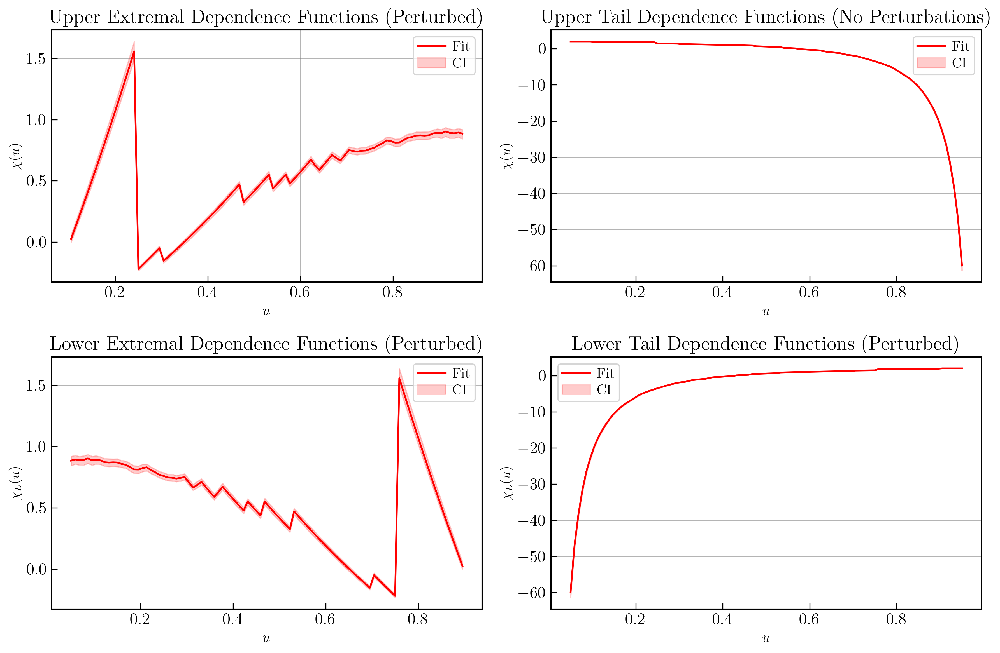

In [85]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import rankdata

def to_uniform(data):
    """Convert raw data to pseudo-uniform margins."""
    n = len(data)
    return rankdata(data) / (n + 1.0)

def chi_function(u, u_vals, epsilon=1e-8):
    """Compute chi(u) for upper/lower tail dependence, with stability fixes."""
    joint_prob = np.mean((u_vals[:, 0] > u) & (u_vals[:, 1] > u))
    marginal_prob = np.mean(u_vals[:, 0] > u) * np.mean(u_vals[:, 1] > u)
    
    joint_prob = max(joint_prob, epsilon)  # Avoid log(0)
    u = max(u, epsilon)  # Avoid log(0)
    
    return 2 - np.log(joint_prob) / np.log(u)

def chi_bar_function(u, u_vals, epsilon=1e-8):
    """Compute chi_bar(u) for upper/lower extremal dependence."""
    joint_prob = np.mean((u_vals[:, 0] > u) & (u_vals[:, 1] > u))
    
    joint_prob = max(joint_prob, epsilon)  # Avoid log(0)
    one_minus_u = max(1 - u, epsilon)  # Avoid log(0)
    
    return (2 * np.log(one_minus_u) / np.log(joint_prob)) - 1

def compute_dependence(u_vals, u_range):
    """Compute all four dependence functions."""
    chi_vals = np.array([chi_function(u, u_vals) for u in u_range])
    chi_bar_vals = np.array([chi_bar_function(u, u_vals) for u in u_range])
    
    # Lower tail computations (flipping domain)
    chi_L_vals = np.array([chi_function(1 - u, u_vals) for u in u_range])
    chi_bar_L_vals = np.array([chi_bar_function(1 - u, u_vals) for u in u_range])

    return chi_vals, chi_bar_vals, chi_L_vals, chi_bar_L_vals

def bootstrap_confidence_intervals(u_vals, u_range, num_bootstraps=100):
    """Compute confidence intervals with bootstrapping."""
    n = len(u_vals)
    chi_boot, chi_bar_boot, chi_L_boot, chi_bar_L_boot = [], [], [], []

    for _ in range(num_bootstraps):
        sample_idx = np.random.choice(n, n, replace=True)
        sample = u_vals[sample_idx]
        chi, chi_bar, chi_L, chi_bar_L = compute_dependence(sample, u_range)
        chi_boot.append(chi)
        chi_bar_boot.append(chi_bar)
        chi_L_boot.append(chi_L)
        chi_bar_L_boot.append(chi_bar_L)

    # Compute 95% confidence intervals
    chi_ci = np.percentile(chi_boot, [2.5, 97.5], axis=0)
    chi_bar_ci = np.percentile(chi_bar_boot, [2.5, 97.5], axis=0)
    chi_L_ci = np.percentile(chi_L_boot, [2.5, 97.5], axis=0)
    chi_bar_L_ci = np.percentile(chi_bar_L_boot, [2.5, 97.5], axis=0)

    return chi_ci, chi_bar_ci, chi_L_ci, chi_bar_L_ci

def plot_dependence_functions(u_range, chi_vals, chi_bar_vals, chi_L_vals, chi_bar_L_vals, 
                              chi_ci, chi_bar_ci, chi_L_ci, chi_bar_L_ci):
    """Plot four dependence functions with confidence intervals."""
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))

    # Upper Extremal Dependence Function
    axes[0, 0].plot(u_range, chi_bar_vals, label="Fit", color='red')
    axes[0, 0].fill_between(u_range, chi_bar_ci[0], chi_bar_ci[1], color='red', alpha=0.2)
    axes[0, 0].set_title("Upper Extremal Dependence Functions (Perturbed)")
    axes[0, 0].set_xlabel("$u$")
    axes[0, 0].set_ylabel("$\\bar{\\chi}(u)$")
    axes[0, 0].legend(["Fit", "CI"])

    # Lower Extremal Dependence Function
    axes[1, 0].plot(u_range, chi_bar_L_vals, label="Fit", color='red')
    axes[1, 0].fill_between(u_range, chi_bar_L_ci[0], chi_bar_L_ci[1], color='red', alpha=0.2)
    axes[1, 0].set_title("Lower Extremal Dependence Functions (Perturbed)")
    axes[1, 0].set_xlabel("$u$")
    axes[1, 0].set_ylabel("$\\bar{\\chi}_L(u)$")
    axes[1, 0].legend(["Fit", "CI"])

    # Upper Tail Dependence Function
    axes[0, 1].plot(u_range, chi_vals, label="Fit", color='red')
    axes[0, 1].fill_between(u_range, chi_ci[0], chi_ci[1], color='red', alpha=0.2)
    axes[0, 1].set_title("Upper Tail Dependence Functions (No Perturbations)")
    axes[0, 1].set_xlabel("$u$")
    axes[0, 1].set_ylabel("$\\chi(u)$")
    axes[0, 1].legend(["Fit", "CI"])

    # Lower Tail Dependence Function
    axes[1, 1].plot(u_range, chi_L_vals, label="Fit", color='red')
    axes[1, 1].fill_between(u_range, chi_L_ci[0], chi_L_ci[1], color='red', alpha=0.2)
    axes[1, 1].set_title("Lower Tail Dependence Functions (Perturbed)")
    axes[1, 1].set_xlabel("$u$")
    axes[1, 1].set_ylabel("$\\chi_L(u)$")
    axes[1, 1].legend(["Fit", "CI"])

    plt.tight_layout()
    plt.show()

# Load data
x = agents.tx_out
y = agents.tx_in

# Convert to uniform margins
u = to_uniform(x)
v = to_uniform(y)
u_vals = np.column_stack((u, v))

# Define u-range (avoiding extreme values)
u_range = np.linspace(0.05, 0.95, 100)

# Compute dependence functions
chi_vals, chi_bar_vals, chi_L_vals, chi_bar_L_vals = compute_dependence(u_vals, u_range)

# Compute confidence intervals
chi_ci, chi_bar_ci, chi_L_ci, chi_bar_L_ci = bootstrap_confidence_intervals(u_vals, u_range)

# Plot results
plot_dependence_functions(u_range, chi_vals, chi_bar_vals, chi_L_vals, chi_bar_L_vals, chi_ci, chi_bar_ci, chi_L_ci, chi_bar_L_ci)


In [ ]:
import numpy as np

def empirical_copula(u, v, u_eval, v_eval):
    """
    Computes empirical copula C_n(u_eval, v_eval) from data u,v (uniform margins).
    
    Parameters:
        u, v : Uniform marginals of original data (numpy arrays).
        u_eval, v_eval : points at which to evaluate empirical copula (floats).

    Returns:
        Empirical copula value C_n(u_eval,v_eval)
    """
    n = len(u)
    ranks_u = (np.argsort(np.argsort(u)) + 1) / (n + 1)
    ranks_v = (np.argsort(np.argsort(v)) + 1) / (n + 1)

    C_n = np.mean((ranks_u <= u_eval) & (ranks_v <= v_eval))
    return C_n




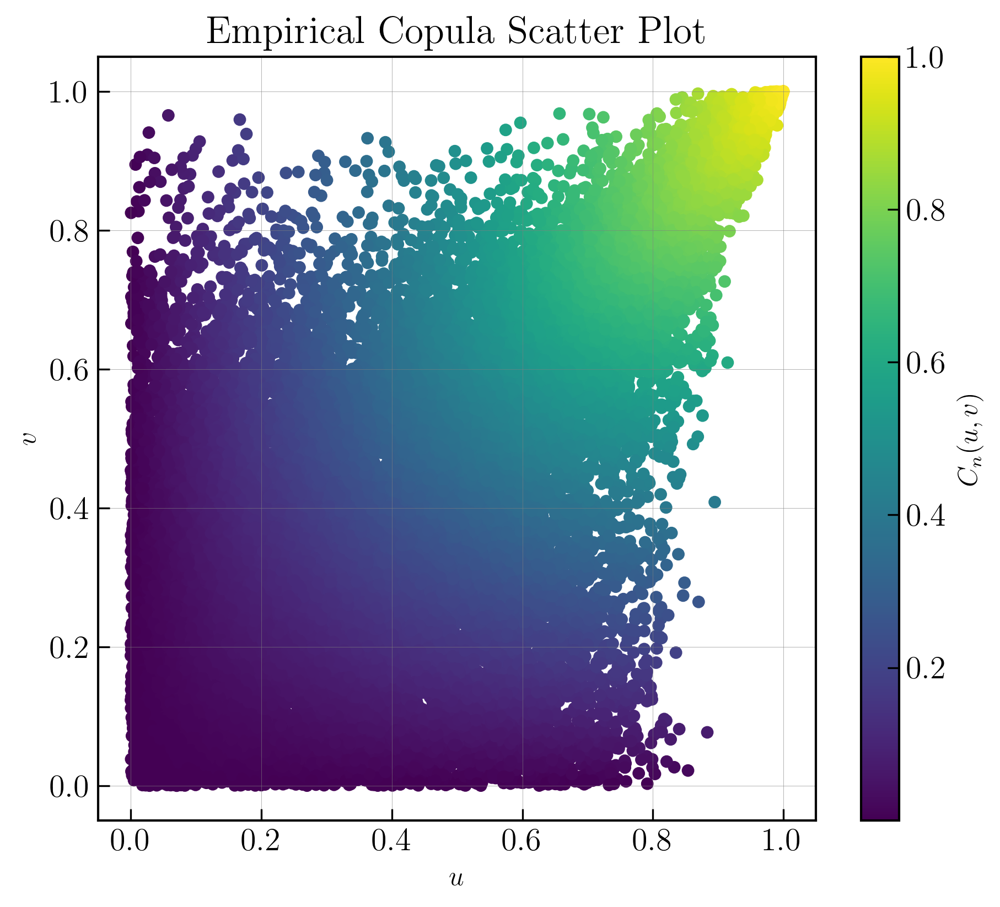

In [94]:
x=agents.activity
y=agents.attractiveness

# Your original data (uniform margins)
u = to_uniform(x)
v = to_uniform(y)

# Evaluation points (e.g. 100 points from 0.01 to 0.99)
u_grid = np.linspace(0.01, 0.99, 100)

# Compute empirical copula at diagonal points (u,u)
emp_copula_values = np.array([empirical_copula(u, v, u_eval, u_eval) for u_eval in u_grid])


# Compute empirical copula values at data points
emp_copula_at_data = np.array([empirical_copula(u, v, u[i], v[i]) for i in range(len(u))])

# Scatter plot
plt.figure(figsize=(7, 6))
scatter = plt.scatter(u, v, c=emp_copula_at_data, cmap='viridis', s=20)
plt.xlabel('$u$')
plt.ylabel('$v$')
plt.title('Empirical Copula Scatter Plot')
plt.colorbar(scatter, label='$C_n(u,v)$')
plt.grid(True)
plt.show()


In [95]:
def compute_extremal_functions(u, v, u_grid, epsilon=1e-8):
    n_points = len(u_grid)
    chi = np.zeros(n_points)
    chi_bar = np.zeros(n_points)
    chi_L = np.zeros(n_points)
    chi_bar_L = np.zeros(n_points)
    
    for idx, u_val in enumerate(u_grid):
        Cn_uu = empirical_copula(u, v, u_val, u_val)
        Cn_uu = np.clip(Cn_uu, epsilon, 1-epsilon)
        
        # Survival copula
        bar_Cn_uu = 1 - 2*u_val + Cn_uu
        bar_Cn_uu = np.clip(bar_Cn_uu, epsilon, 1-epsilon)

        # Upper tail dependence
        chi[idx] = 2 - np.log(Cn_uu) / np.log(u_val)

        # Upper extremal dependence
        chi_bar[idx] = (2 * np.log(1 - u_val) / np.log(bar_Cn_uu)) - 1

        # Lower tail dependence
        chi_L[idx] = np.log(bar_Cn_uu) / np.log(1 - u_val)

        # Lower extremal dependence
        chi_bar_L[idx] = (2 * np.log(u_val) / np.log(Cn_uu)) - 1
    
    return chi, chi_bar, chi_L, chi_bar_L


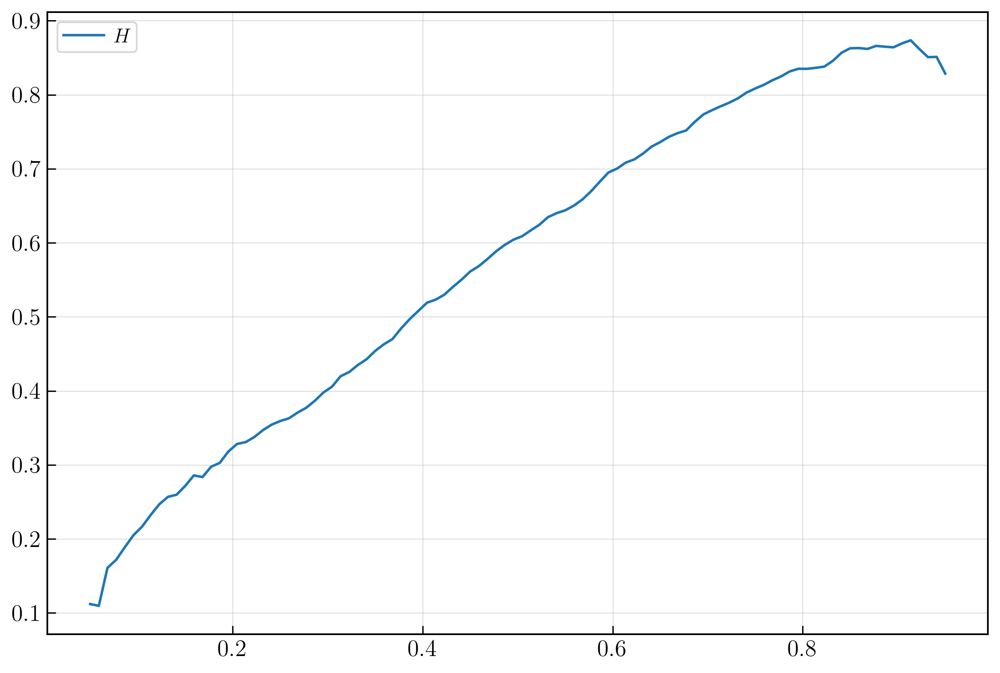

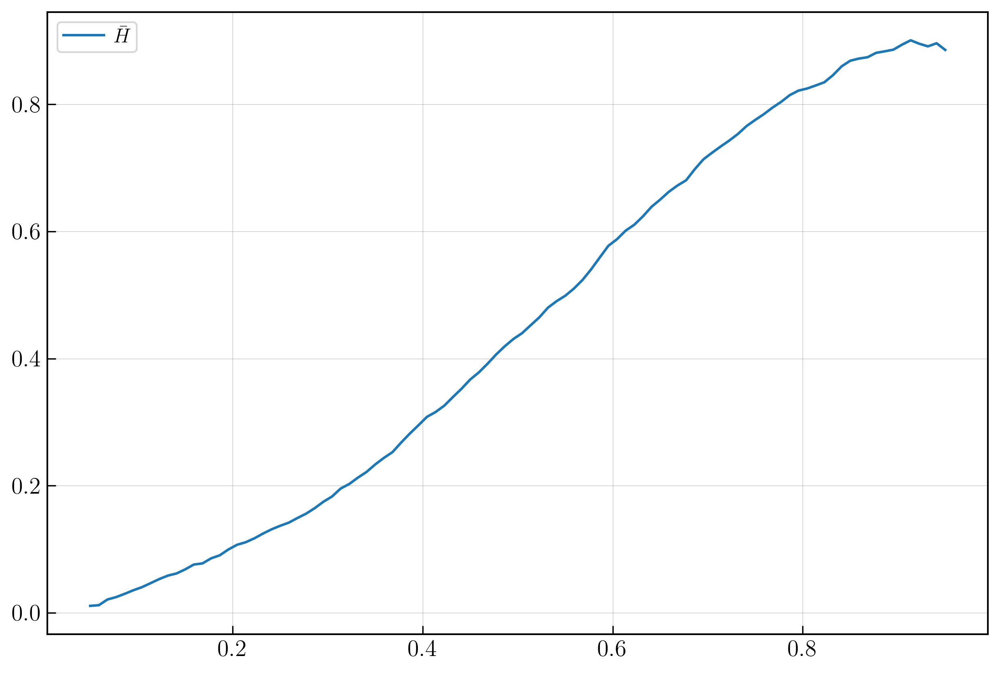

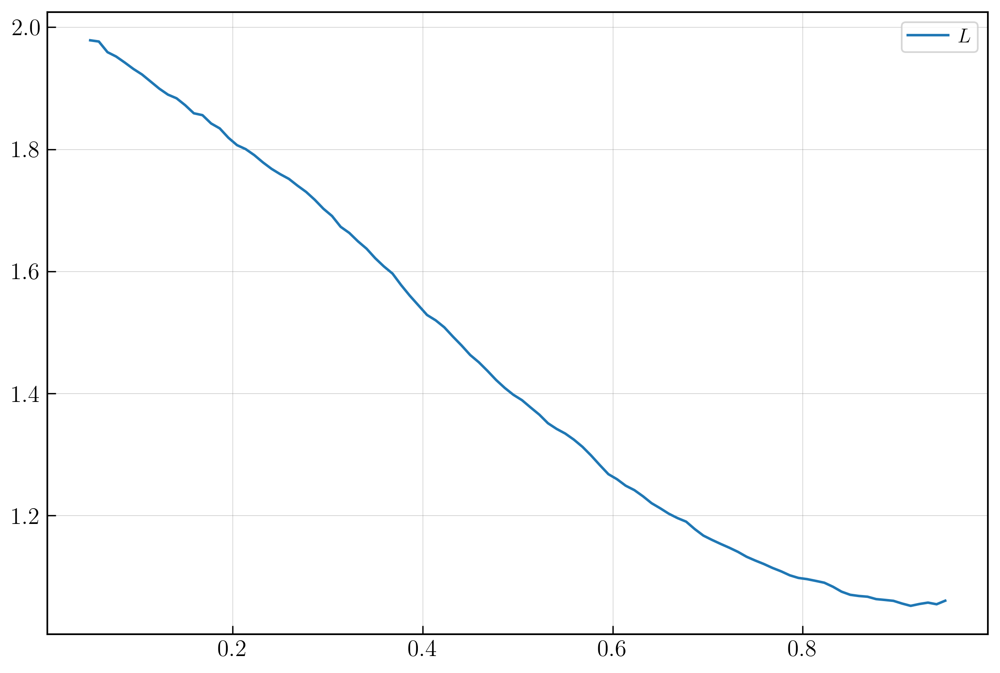

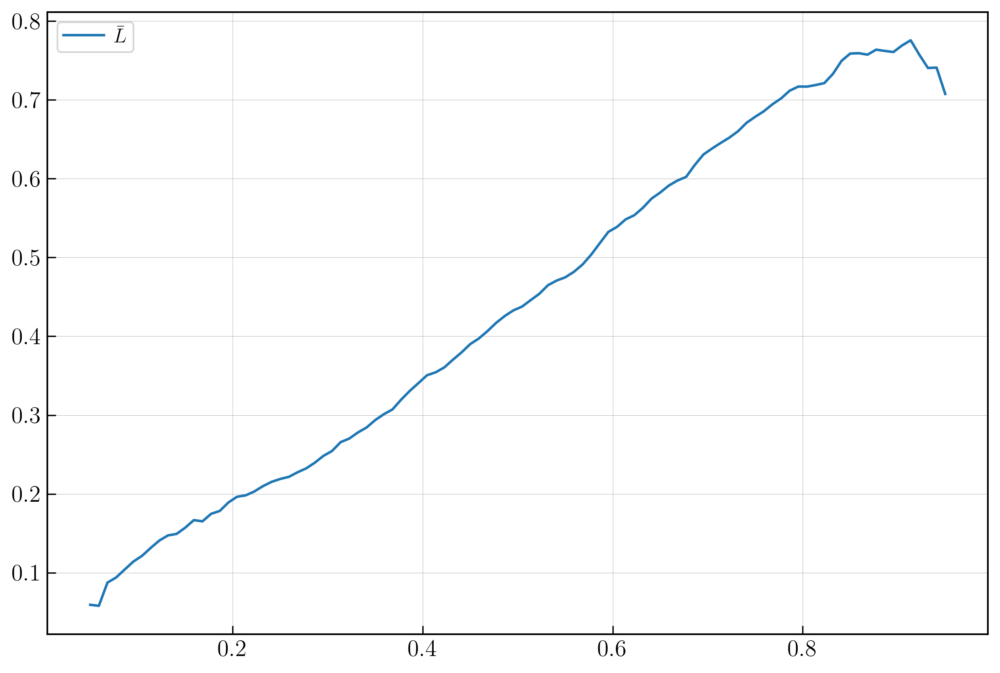

In [103]:
# Evaluation grid avoiding extremes
u_grid = np.linspace(0.05, 0.95, 100)

# Compute extremal dependence functions
dependence_functions = compute_extremal_functions(u, v, u_grid)
labels = [r'$H$',r'$\bar{H}$',r'$L$',r'$\bar{L}$']

for i,y_vals in enumerate(dependence_functions):
    plt.figure()
    plt.plot(u_grid,y_vals,label=labels[i])

    plt.legend()


In [80]:
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt

def empirical_extremal_function(data, link_formula, survival=False, conf_level=0.95, points=100):
    n = len(data)
    ranks = (st.rankdata(data, axis=0)) / (n + 1)
    u_grid = np.linspace(1/(points+1), points/(points+1), points)
    
    values = np.zeros(points)
    ci_low = np.zeros(points)
    ci_up = np.zeros(points)
    
    z = st.norm.ppf(0.5 + 0.5 * conf_level)
    
    for i, u in enumerate(u_grid):
        if survival:
            cuu = np.mean((u < np.minimum(ranks[:, 0], ranks[:, 1])))
        else:
            cuu = np.mean((u > np.maximum(ranks[:, 0], ranks[:, 1])))

        # Adjust cuu to avoid log issues
        epsilon = np.finfo(float).eps
        cuu = np.clip(cuu, epsilon, 1 - epsilon)

        # Estimate
        values[i] = link_formula(u, cuu)

        # Confidence interval for cuu
        se = np.sqrt(cuu * (1 - cuu) / n)
        lb = cuu - z * se
        ub = cuu + z * se
        lb = np.clip(lb, epsilon, 1 - epsilon)
        ub = np.clip(ub, epsilon, 1 - epsilon)

        # CI for function
        ci_low[i] = np.clip(link_formula(u, lb), -1, 1)
        ci_up[i] = np.clip(link_formula(u, ub), -1, 1)

    return u_grid, values, ci_low, ci_up

# Link formulas translated to Python
def chi(u, cuu):
    return 2 - np.log(cuu) / np.log(u)

def chi_bar(u, cuu):
    return 2 * np.log(1 - u) / np.log(cuu) - 1

def chi_L(u, cuu):
    return np.log(1 - cuu) / np.log(1 - u)

def chi_bar_L(u, cuu):
    return 2 * np.log(u) / np.log(cuu) - 1

# Interface functions for clarity
def draw_upper_tail(data):
    return empirical_extremal_function(data, chi, survival=False)

def draw_upper_extremal(data):
    return empirical_extremal_function(data, chi_bar, survival=True)

def draw_lower_tail(data):
    return empirical_extremal_function(data, chi_L, survival=False)

def draw_lower_extremal(data):
    return empirical_extremal_function(data, chi_bar_L, survival=False)

# Example usage (assuming your data is available as x,y):
data = agents[['activity','attractiveness']].values
# data=agents[['tx_out','tx_in']].values

u, val, low, up = draw_upper_tail(data)

# Example plotting
plt.figure(figsize=(8, 5))
plt.plot(u, val, label='Estimate', color='red')
plt.fill_between(u, low, up, color='blue', alpha=0.2, label='CI')
plt.xlabel('$u$',rotation = 0,labelpad=20)
plt.ylabel('$\\chi(u)$',rotation = 0,labelpad=20)
plt.title('Upper Tail Dependence Function')
# plt.grid()
plt.legend()
plt.show()


KeyError: "None of [Index(['activity', 'attractiveness'], dtype='object')] are in the [columns]"

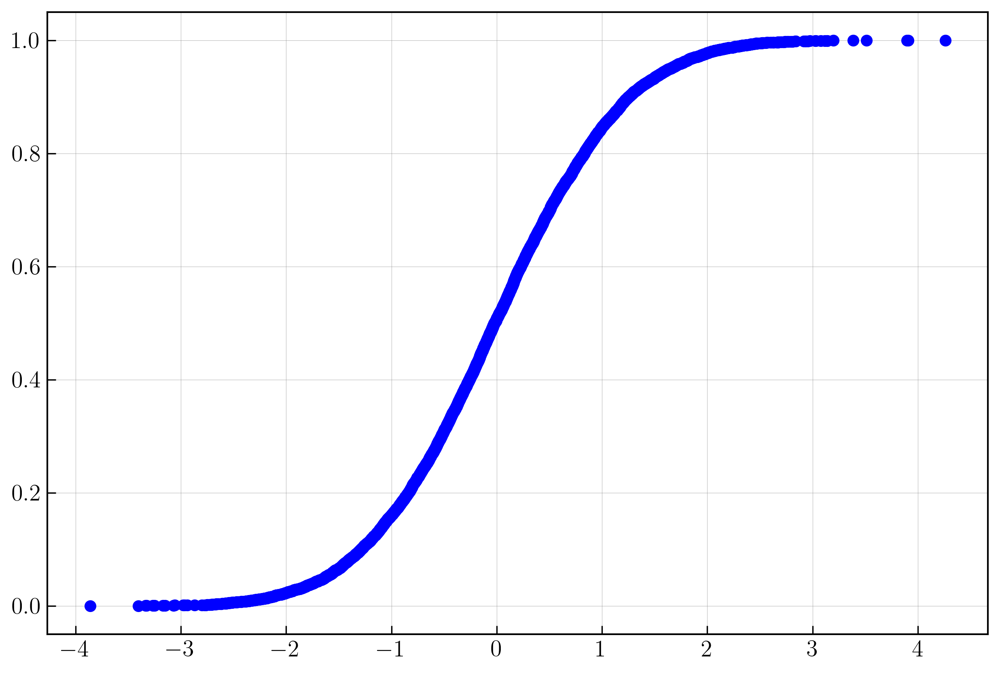

In [115]:
s =pd.Series( np.random.normal(size=10000))

plt.plot(np.sort(s),np.arange(len(s))/len(s),'bo')

In [145]:
ags[ags.tx_out==0].count().max()

np.int64(1469)

P(0) = 0.380


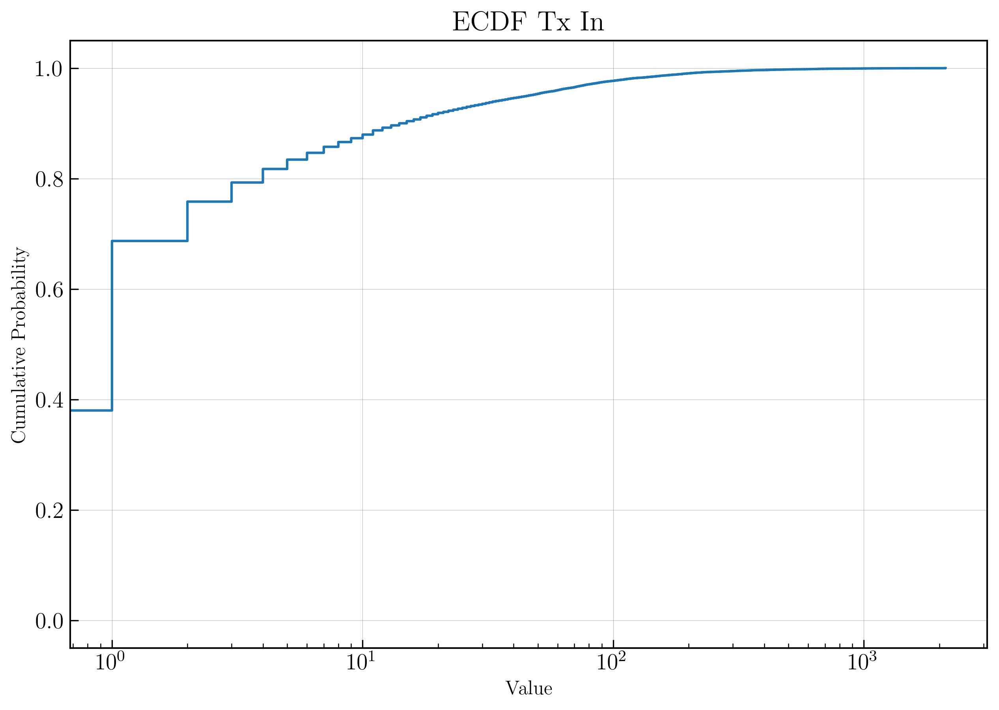

P(0) = 0.036


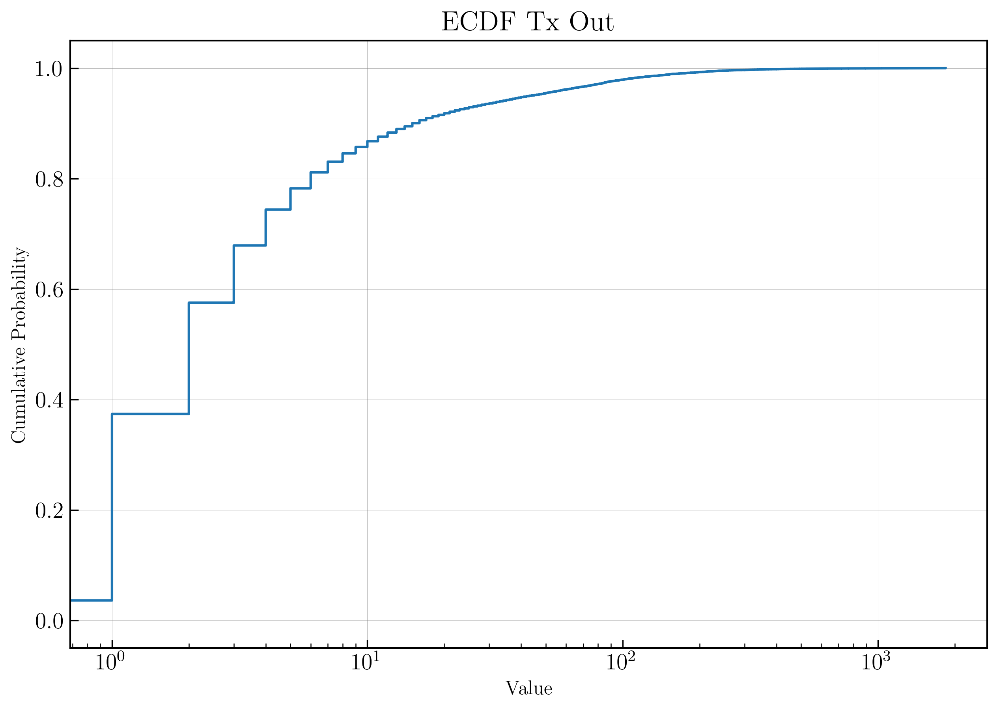

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# s = pd.Series(np.random.normal(size=10000))
txs = TXDF.copy(deep=True)
txs = txs[standard(txs)]
ags= basic_agents(txs,USERS.copy(deep=True),how='inner')



for id,lab in enumerate(['tx_in','tx_out']):
    s = ags[lab]

    rounded = 0
    if rounded:
        s = s.round()
    # Sort the series
    sorted_s = np.sort(s)

    # Calculate the empirical CDF values
    ecdf_values = np.arange(1, len(s)+1) / len(s)
    p0 = ags[ags[lab]==0].count().max() / len(ags)
    print(f'P(0) = {p0:.3f}')
    # Plot the ECDF
    plt.step(sorted_s, ecdf_values, where='post')
    plt.semilogx()
    plt.xlabel('Value')
    plt.ylabel('Cumulative Probability')
    plt.title(f"ECDF {lab.replace('_',' ').title()}")
    plt.show()




In [154]:
ags['activity'] = ags.tx_out + epsilon * perturbations['std_norm'](len(ags))
ags['attractiveness'] = ags.tx_in + epsilon * perturbations['std_norm'](len(ags))

[]

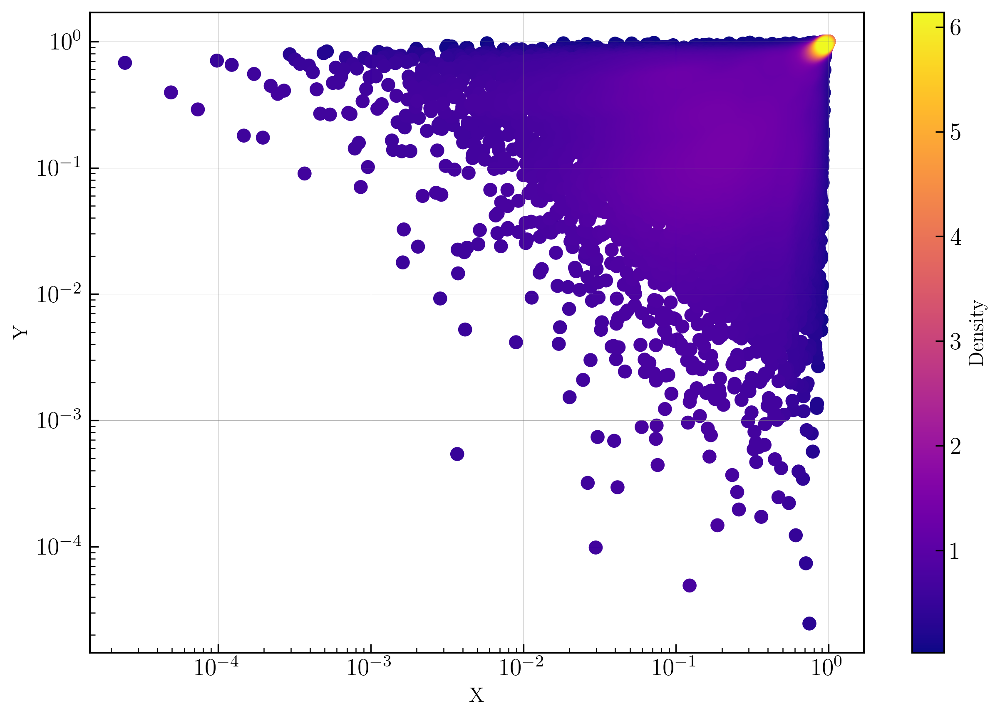

In [219]:
plot_scatter_kde(ags[['activity','attractiveness']].rank(pct=True).values,plt.gca())
plt.loglog()

clayton [0.44969146] 1744.7394373449586
gumbel [1.82783496] 12379.109700617297
frank [4.08564453] 7045.861818428729
joe [1.14414498] 20767.42204019411
galambos [0.75193877] 7950.010329438284
fgm [0.999999] 4645.786588056872
plackett [8.73633275] 8654.027515279591
rgumbel [1.47169501] 4599.9698694265935
rclayton [1.81578604] 14864.650325899527
rjoe [1.00047258] 18973.081225650258
rgalambos [0.50471376] 2389.196137413264
BB1 [1.46906693e-06 1.82786119e+00] 12379.096812178124
 message: Inequality constraints incompatible
 success: False
  status: 4
     fun: nan
       x: [ 1.000e+00  1.000e+00]
     nit: 1
     jac: [       nan        nan]
    nfev: 3
    njev: 1
optimization failed
Error fitting BB2: cannot unpack non-iterable NoneType object
Best copula: joe, Parameter: [1.14414498], Score: 20767.42204019411


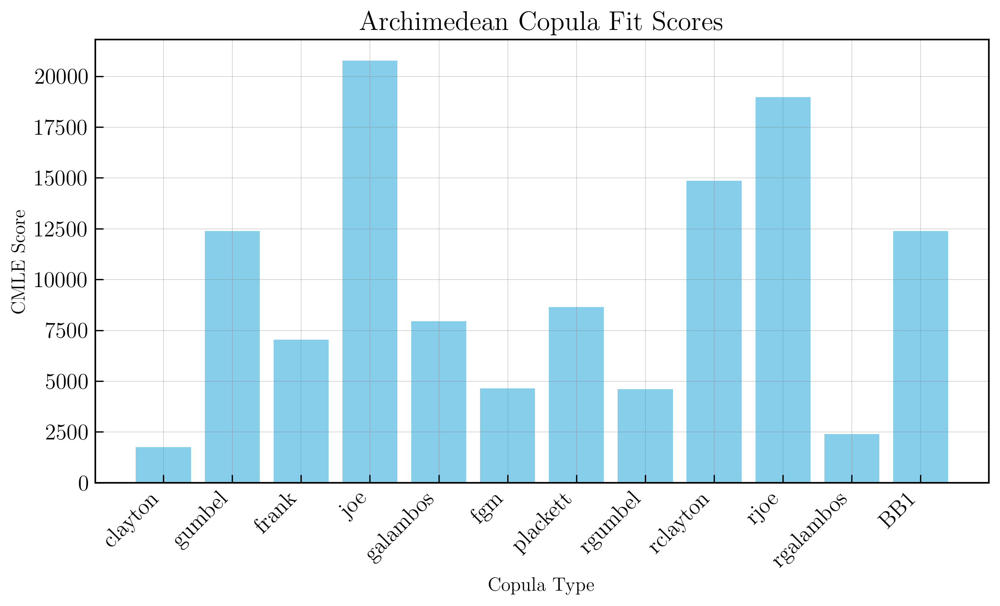

: 

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from pycop import estimation, archimedean

# Assuming 'agents' DataFrame exists
data = ags[['tx_out', 'tx_in']]
data = data.rank(pct=True).T.values

max_score = 0
cmles = []
copula_types = []
fitted_params = []

for copula_type in archimedean.Archimedean_families:
    try:
        cop = archimedean(copula_type)
        param, cmle = estimation.fit_cmle(cop, data)
        cmles.append(cmle)
        copula_types.append(copula_type)
        fitted_params.append(param)
                
        if cmle >= max_score:
            max_score = cmle
            winner = copula_type
            winner_param = param
        
        print(copula_type, param, cmle)
    except Exception as e:
        print(f"Error fitting {copula_type}: {e}")
        pass

print(f'Best copula: {winner}, Parameter: {winner_param}, Score: {max_score}')

# Plot CMLE scores
fig = plt.figure(figsize=(10, 5))
plt.bar(copula_types, cmles, color='skyblue')
plt.xlabel('Copula Type')
plt.ylabel('CMLE Score')
plt.title('Archimedean Copula Fit Scores')
plt.xticks(rotation=45, ha='right')
plt.show()


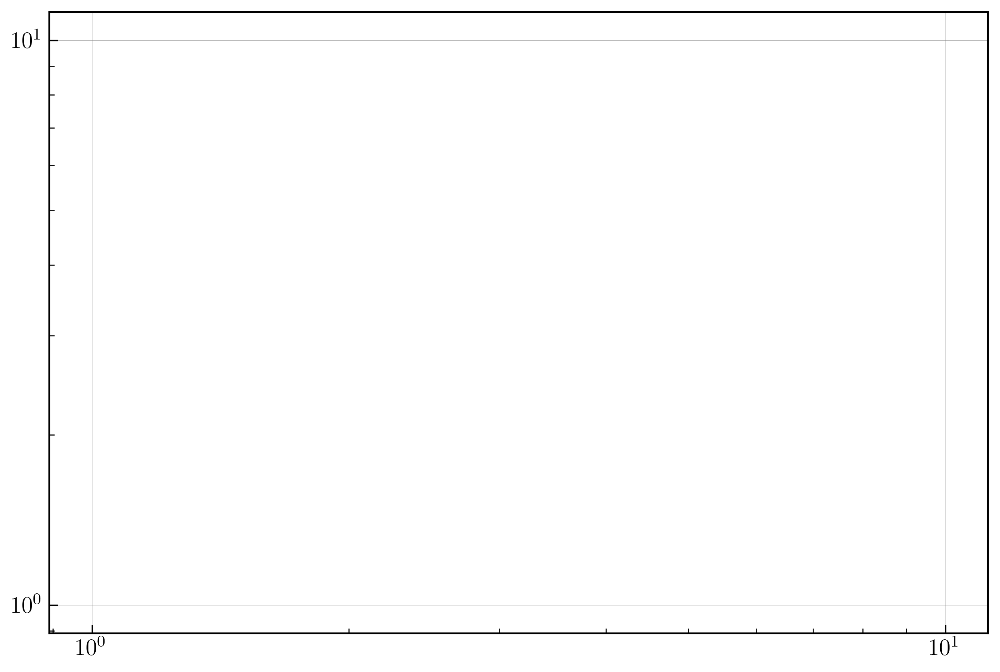

In [152]:
plt.loglog()
plt.show()

In [ ]:
string = 'Mario_Dario_Bario'

string.replace


'Mario_Dario_Bario'

In [45]:
x = pd.Series([0,1,1,0,1,2,5,4,0,3,0,1,0,2,5,0,7,5,0,8,5,2,5,4,9,589])

In [48]:
x.autocorr(),x.rank()

(np.float64(0.473614185149931),
 0      4.0
 1      9.5
 2      9.5
 3      4.0
 4      9.5
 5     13.0
 6     20.0
 7     16.5
 8      4.0
 9     15.0
 10     4.0
 11     9.5
 12     4.0
 13    13.0
 14    20.0
 15     4.0
 16    23.0
 17    20.0
 18     4.0
 19    24.0
 20    20.0
 21    13.0
 22    20.0
 23    16.5
 24    25.0
 25    26.0
 dtype: float64)

(array([62.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 38.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

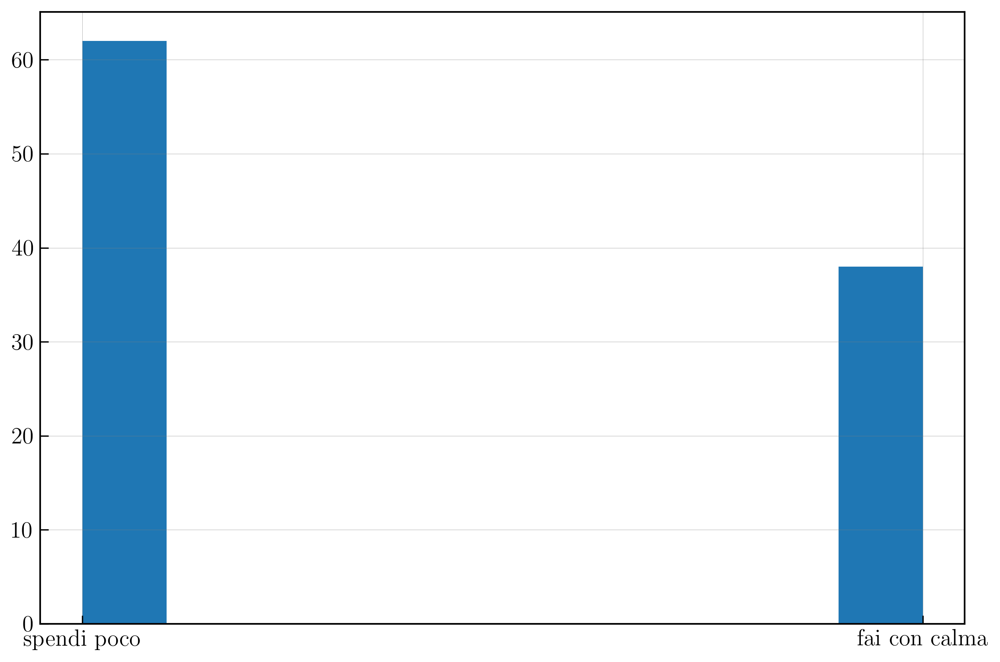

In [83]:
plt.hist(np.random.choice(['fai con calma','spendi poco'],size=100))

In [61]:
173-73-56

44

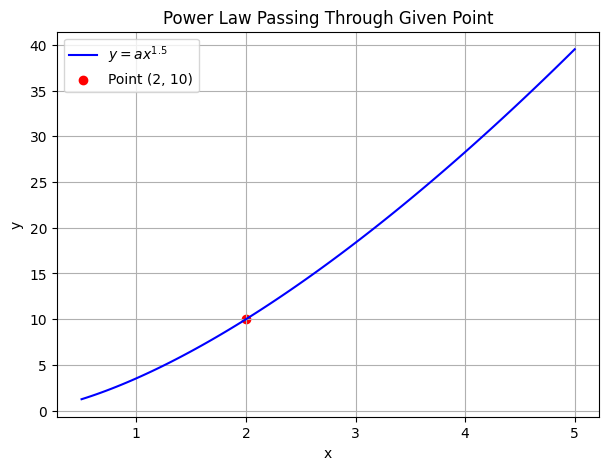

In [1]:
import numpy as np
import matplotlib.pyplot as plt

def power_law_through_point(x0, y0, b):
    """Returns a function y = a * x^b that passes through (x0, y0)."""
    if x0 == 0:
        raise ValueError("x0 cannot be zero for a power law function.")
    
    a = y0 / (x0 ** b)
    
    def power_law(x):
        return a * (x ** b)
    
    return power_law

# Given point and exponent
x0, y0, b = 2, 10, 1.5

# Generate power law function
power_func = power_law_through_point(x0, y0, b)

# Generate x values and corresponding y values
x_values = np.linspace(0.5, 5, 100)  # Avoid x=0 to prevent issues with power function
y_values = power_func(x_values)

# Plot the power law function
plt.figure(figsize=(7,5))
plt.plot(x_values, y_values, label=f"$y = ax^{{{b}}}$", color='blue')
plt.scatter([x0], [y0], color='red', label=f"Point ({x0}, {y0})")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Power Law Passing Through Given Point")
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


In [32]:
fit_par =  fits['tx_out'][0]
exp = fit_par.power_law.alpha
data = agents.activity


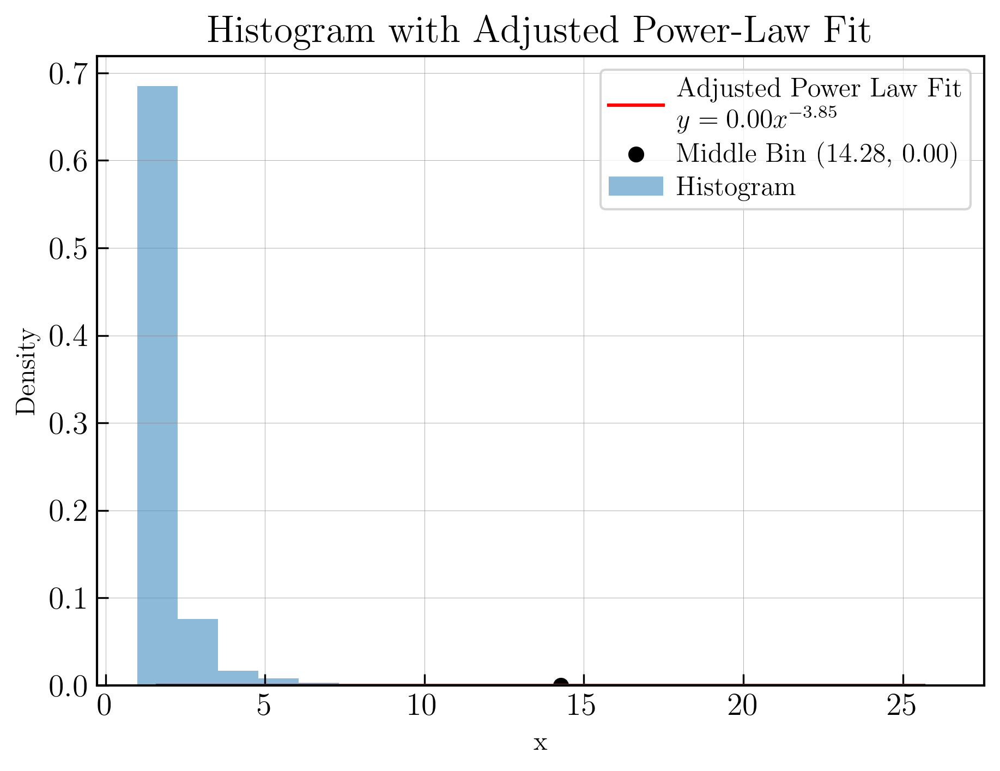

In [ ]:


# Create histogram
num_bins = 20
hist_counts, bin_edges = np.histogram(data, bins=num_bins, density=True)

# Find the center bin
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
middle_index = len(bin_centers) // 2
x0, y0 = bin_centers[middle_index], hist_counts[middle_index]



def power_law(x, a, b):
    return a * x**b

# Adjust the fit so it passes through (x0, y0)
a_adjusted = y0 / (x0 ** b_fit)

# Generate fitted curve
x_fit = np.linspace(min(bin_centers), max(bin_centers), 100)
y_fit_adjusted = a_adjusted * x_fit**b_fit

# Plot histogram and adjusted power-law fit
plt.figure(figsize=(7,5))
plt.bar(bin_centers, hist_counts, width=bin_edges[1] - bin_edges[0], alpha=0.5, label="Histogram")
plt.plot(x_fit, y_fit_adjusted, color='red', label=f"Adjusted Power Law Fit\n$y = {a_adjusted:.2f} x^{{{b_fit:.2f}}}$")
plt.scatter([x0], [y0], color='black', label=f"Middle Bin ({x0:.2f}, {y0:.2f})")
plt.xlabel("x")
plt.ylabel("Density")
plt.title("Histogram with Adjusted Power-Law Fit")
plt.legend()
plt.grid(True)

# Show plot
plt.show()


np.float64(1.5)

In [ ]:
x0, y0, b = 2, 10, exp

# Generate power law function
power_func = power_law_through_point(x0, y0, b)

# Generate x values and corresponding y values
x_values = np.linspace(0.5, 5, 100)  # Avoid x=0 to prevent issues with power function
y_values = power_func(x_values)

# Plot the power law function
plt.figure(figsize=(7,5))
plt.plot(x_values, y_values, label=f"$y = ax^{{{b}}}$", color='blue')
plt.scatter([x0], [y0], color='red', label=f"Point ({x0}, {y0})")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Power Law Passing Through Given Point")
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


np.float64(1.853878449594268)

In [113]:

length = 20

sources = np.random.choice(['A', 'B', 'C'], size=length)
targets = np.array([np.random.choice([x for x in ['A', 'B', 'C'] if x != s]) for s in sources])

trs = pd.DataFrame({
    'date': np.sort(np.random.standard_exponential(size=length)),
    'source': sources,
    'target': targets,
    'weight': np.random.uniform(0, 1, size=length)
})



In [114]:
trs.groupby('source').count().sum(), trs.groupby('target').count().sum()

(date      20
 target    20
 weight    20
 dtype: int64,
 date      20
 source    20
 weight    20
 dtype: int64)

In [121]:
sources = trs.groupby("source").agg({
                                    'weight':['count','sum','mean','median','max','min'],
                                    # 'frac_out':['mean','median','max','min'], # I added this line
                                    'target':'nunique',
                                    'date':'first'})

sources.columns = [
    "total_txns_out", "total_exp", "mean_exp", "median_exp", "max_exp", "min_exp",  # weight columns
    "num_targets", "first_txns_out"                                                # target and date columns
]

# print(sources.head())
sources.reset_index(inplace=True)
# print(sources.head())

In [122]:
targets = trs.groupby("target").agg({
                                    'weight': ['count','sum','mean','median','max','min'],
                                    # 'frac_in': ['mean','median','max','min'], # I added this line
                                    'source':'nunique',
                                    'date':'first'})
targets.columns = [
    "total_txns_in", "total_earn", "mean_earn", "median_earn", "max_earn", "min_earn",  # weight columns
    "num_sources", "first_txns_in"                                                    # source and date columns
]
targets.reset_index(inplace=True)

In [ ]:
targets.rename(columns={'target': 'crid'}, inplace=True)
sources.rename(columns={'source': 'crid'}, inplace=True)
ags = pd.merge(targets, sources, on=['crid'], how='outer')

In [ ]:
ags = ags.rename(columns={
            'total_txns_in':'tx_in',
            'total_txns_out':'tx_out',
            'total_earn':'vol_in',
            'total_exp':'vol_out',
            'num_sources':'in_deg',
            'num_targets':'out_deg',
            
        })

ags.sum()

crid                   ABC
tx_in                   20
vol_in            9.868513
mean_earn         1.567824
median_earn       1.706853
max_earn          2.733173
min_earn          0.350191
in_deg                   6
first_txns_in     1.012524
tx_out                  20
vol_out           9.868513
mean_exp          1.460676
median_exp        1.538067
max_exp           2.286091
min_exp           0.127585
out_deg                  6
first_txns_out    0.979152
dtype: object

In [85]:
data = agents['tx_in']
data=data/data.sum()

alpha = fits['tx_in'][0].power_law.alpha



In [127]:
import numpy as np
import matplotlib.pyplot as plt

def calculate_pdf_auc(data, bins=50):
    """
    Compute the Area Under the Curve (AUC) for the probability density function (PDF) of the data.
    
    Parameters:
    - data: array-like, input data series
    - bins: int, number of histogram bins for estimating the PDF
    
    Returns:
    - auc: float, computed area under the PDF
    """
    # Compute histogram-based PDF
bins=len(data)
# bins = np.logspace(np.log(data.min()),np.log(data.max()),bins)
hist, bin_edges = np.histogram(data, bins=bins, density=False)

bin_widths = np.diff(bin_edges)

auc=hist.dot(bin_widths)

auc

print(f"AUC of the PDF: {auc}")


AUC of the PDF: 0.005052023673157699


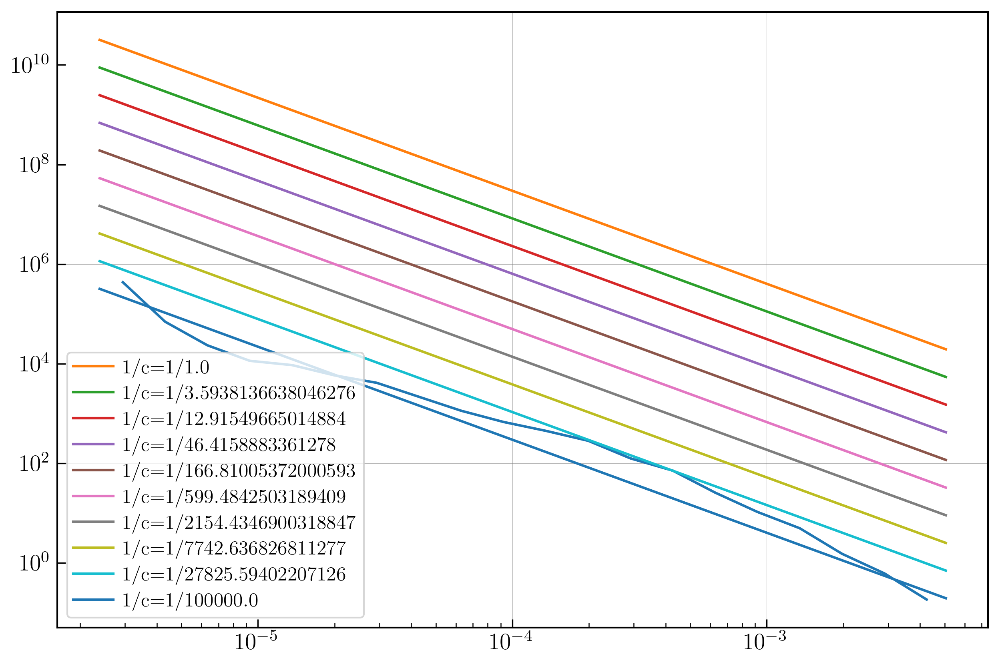

In [101]:
plt.figure()
x=np.linspace(data.min(),data.max(),100)
plot_distribution(data,ax=plt.gca())
for c in np.logspace(0,5,10):
    # plt.plot(x,c*x**-alpha,label = f'c={c}')
    plt.plot(x,1/c*x**-alpha,label = f'1/c=1/{c}')
    plt.legend()

In [72]:
import pycop as pc

In [79]:
data=agents[['activity','attractiveness']].values

KeyError: "None of [Index(['activity', 'attractiveness'], dtype='object')] are in the [columns]"

In [78]:
pc.empirical(data).UTDC(0.95)

np.float64(2.0)

In [89]:
(USERS.loc[USERS.stxns_in == 0].crid.count()/len(USERS))*100

np.float64(53.989013387660066)

In [90]:
(USERS.loc[USERS.stxns_out == 0].crid.count()/len(USERS))*100

np.float64(28.677968568102447)

In [96]:
round(TXDF[(TXDF.type=='STANDARD')].id.count()/len(TXDF)*100,2)

np.float64(45.45)

In [99]:
import numpy as np
from copulas.bivariate.utils import get_tail_dependence

# Generate sample data
x = agents.tx_out
y = agents.tx_in

# Compute lower and upper tail dependence coefficients directly
lower_tail, upper_tail = get_tail_dependence(x, y, 0.05)  # q=0.05 (5% for lower tail, 95% for upper tail)

print(f"Lower Tail Dependence Coefficient: {lower_tail:.4f}")
print(f"Upper Tail Dependence Coefficient: {upper_tail:.4f}")


ImportError: cannot import name 'get_tail_dependence' from 'copulas.bivariate.utils' (/home/claudio/tesi/sarafu/.venv/lib/python3.10/site-packages/copulas/bivariate/utils.py)